# Q-factorisation on Gridworld Maze

In [1]:
from pathlib import Path
import sys
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import time
from copy import deepcopy


# Resolve repository src path robustly when running notebook in-place.
repo_root = Path.cwd()
while repo_root != repo_root.parent and not (repo_root / 'src').exists():
    repo_root = repo_root.parent
sys.path.insert(0, str(repo_root / 'src'))

from environments.maze_discrete import MazeGridWorld, MazeGoalWrapper
from utils import (TrajectoryReplayBufferDiscrete, evaluate_policy, set_seed, build_goal_batch, get_base_env, collect_valid_states_fourrooms,
                   estimate_fisher_diag, extract_fixed_probe_sa_embedding, extract_mean_sa_embedding, extract_sa_batch_for_isotropy,
                   compute_embedding_drift, collect_weight_snapshot, get_free_cells, sample_goals, plot_sa_encoder_changes_across_tasks, compute_weight_change_from_snapshots)
from visualisations import visualise_embeddings, visualise_q_table, print_goal_embedding_similarity, plot_full_embedding_dashboard_html, plot_min_steps_and_min_time
from loss_functions import repulsion_loss_to_memory, sigreg_loss, orthogonal_loss, ewc_regulariser_loss, weight_regulariser_loss
from networks import snapshot_named_parameters, FactorisedDQN_QNetwork
from trainer import dqn_train_new


DEVICE = 'cuda' if torch.cuda.is_available() else ('mps' if torch.backends.mps.is_available() else 'cpu')
print('Using device:', DEVICE)


Using device: mps


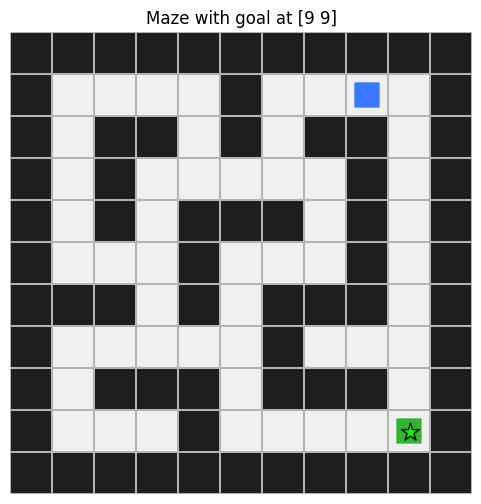

In [2]:
MAZE_LAYOUT = [
    [1,1,1,1,1,1,1,1,1,1,1],
    [1,0,0,0,0,1,0,0,0,0,1],
    [1,0,1,1,0,1,0,1,1,0,1],
    [1,0,1,0,0,0,0,0,1,0,1],
    [1,0,1,0,1,1,1,0,1,0,1],
    [1,0,0,0,1,0,0,0,1,0,1],
    [1,1,1,0,1,0,1,1,1,0,1],
    [1,0,0,0,0,0,1,0,0,0,1],
    [1,0,1,1,1,0,1,1,1,0,1],
    [1,0,0,0,1,0,0,0,0,0,1],
    [1,1,1,1,1,1,1,1,1,1,1],
]

def make_env(goal=(9, 9), slip_prob=0.00, max_horizon=500):
    base = MazeGridWorld(
        maze=MAZE_LAYOUT,
        max_episode_steps=max_horizon,
    )
    env = MazeGoalWrapper(
        base,
        goal_position=goal,
        goal_reward=1.0,
        step_reward=0.0,
        slip_prob=slip_prob,
        reward_mode="simple",
    )
    return env

env = make_env(goal=(9, 9))
obs, info = env.reset()

img = env.unwrapped.render()
goal = env.goal_position

plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.scatter(
    goal[0] * 40 + 20,
    goal[1] * 40 + 20,
    c="lime",
    s=180,
    marker="*",
    edgecolors="black",
)
plt.title(f"Maze with goal at {goal}")
plt.axis("off")
plt.show()

## Training Loop across goals and seeds


================ SEED 42 ================

Sampled GOALS for seed 42: [(1, 4), (6, 1), (9, 6), (5, 5), (7, 5), (8, 7), (4, 1), (1, 9), (7, 9), (1, 7), (8, 9), (4, 2)]

----- seed=42, task_idx=0, goal=(1, 4) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=-49.850 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=-49.950 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=-49.925 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=-49.900 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-43.513 | eval_len=437.6 | TD=3.8162e-03 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   6000 | eps=0.886 | eval_return=-12.238 | eval_len=375.9 | TD

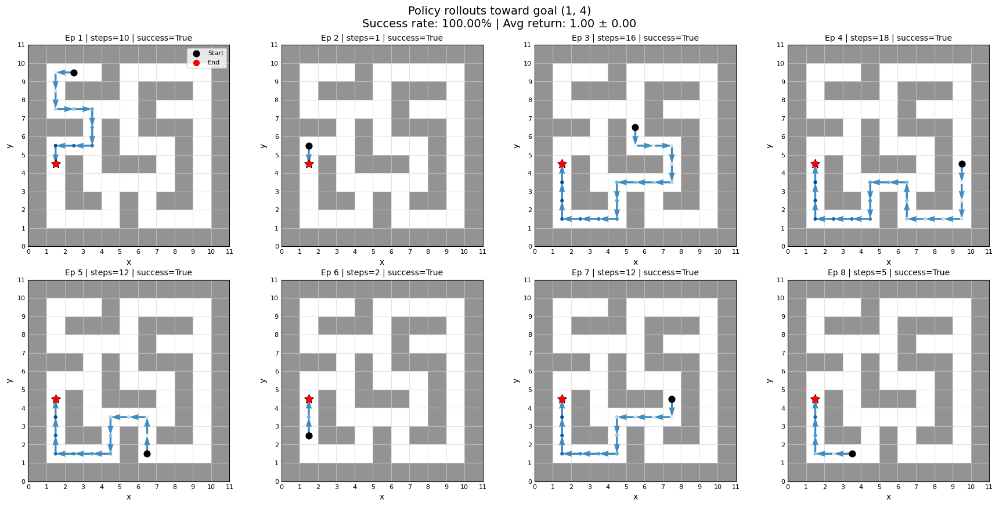

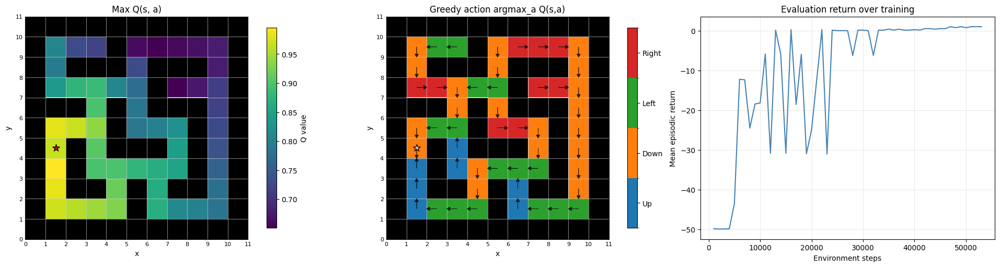

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.4209037 3.8419383 3.4760137 2.6847575 2.036192 ]
cumulative variance (first 5 dims): [0.26561537 0.4662158  0.63042367 0.728382   0.7847287 ]
cos(phi(s,a), psi/task): mean=0.7595, std=0.1122


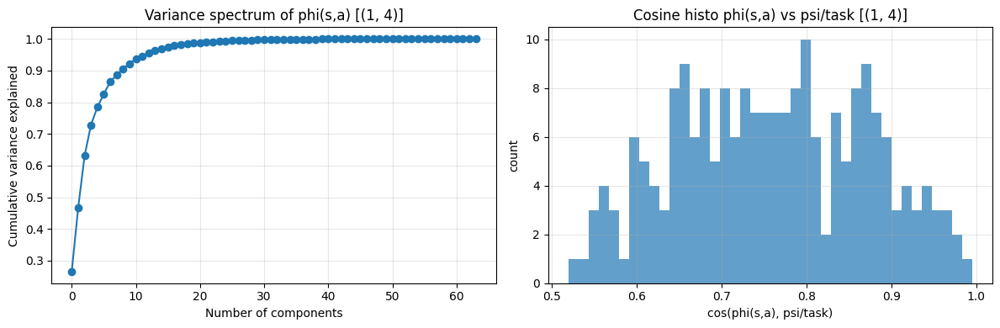


Goal embedding cosine similarity matrix:
     task_0
  task_0      1.000
Finished task_0 | seed=42 | goal=(1, 4) | steps=53000 | time=188.60s | anchor_sets=1

----- seed=42, task_idx=1, goal=(6, 1) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=438.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.375 | eval_len=314.9 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.375 | eval_len=315.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.125 | eval_len=438.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-6.088 | eval_len=438.1 | TD=5.6192e-04 | SA-stability=0.0000e+00 | projection=False dot=0.000e+00 g_new=3.707e-02 g_stable=0.000e+00
[DQN-factorised] step=   6000 | eps=0.886 | eval_ret

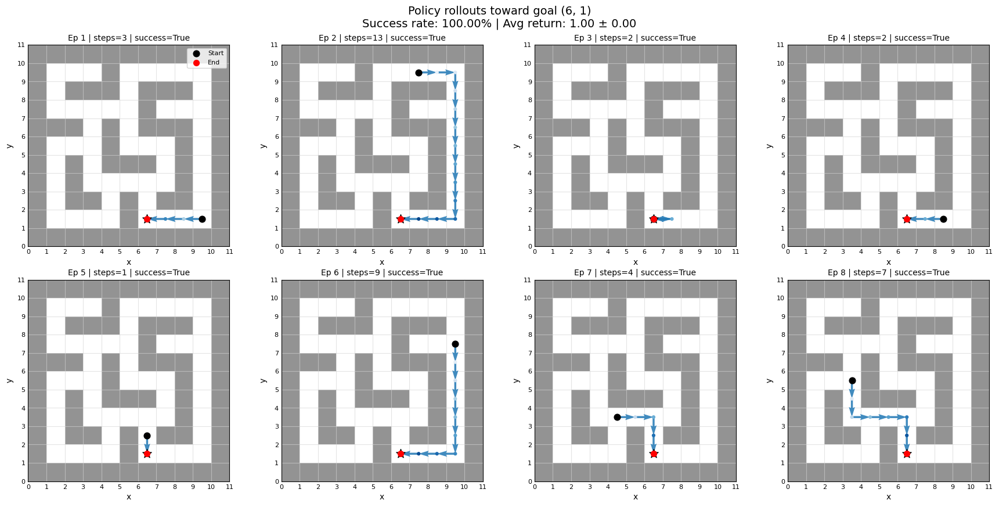

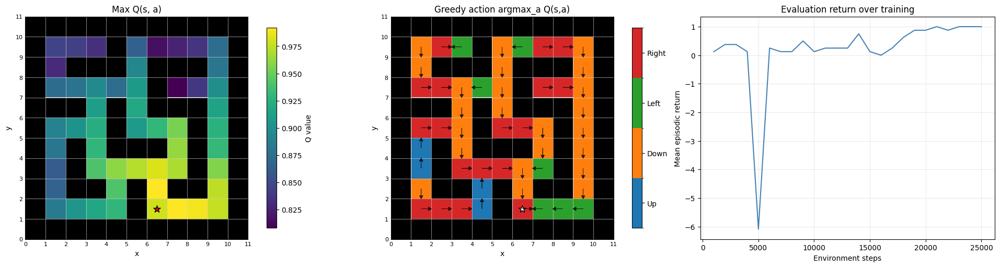

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.712775  2.9482503 2.9399908 2.5073252 2.0453994]
cumulative variance (first 5 dims): [0.24795936 0.4043144  0.55979466 0.6728796  0.74813527]
cos(phi(s,a), psi/task): mean=0.8499, std=0.0691


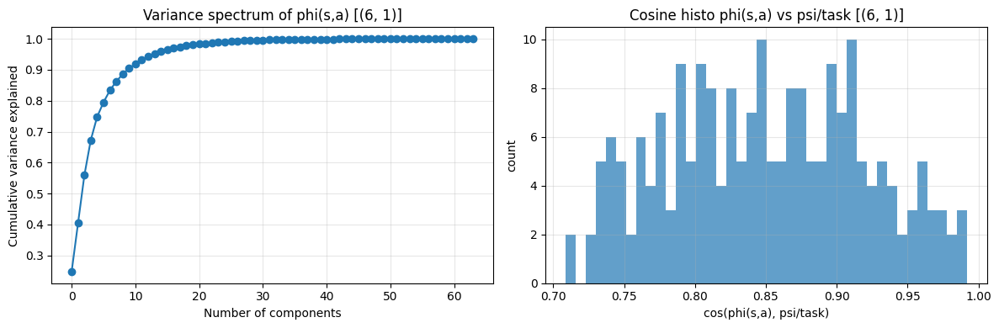


Goal embedding cosine similarity matrix:
     task_0     task_1
  task_0      1.000      0.955
  task_1      0.955      1.000

Off-diagonal mean similarity: 0.955
Off-diagonal min similarity: 0.955
Off-diagonal max similarity: 0.955
Finished task_1 | seed=42 | goal=(6, 1) | steps=25000 | time=82.25s | anchor_sets=2

----- seed=42, task_idx=2, goal=(9, 6) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.250 | eval_len=375.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.500 | eval_len=251.1 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-12.350 | eval_len=437.6 | 

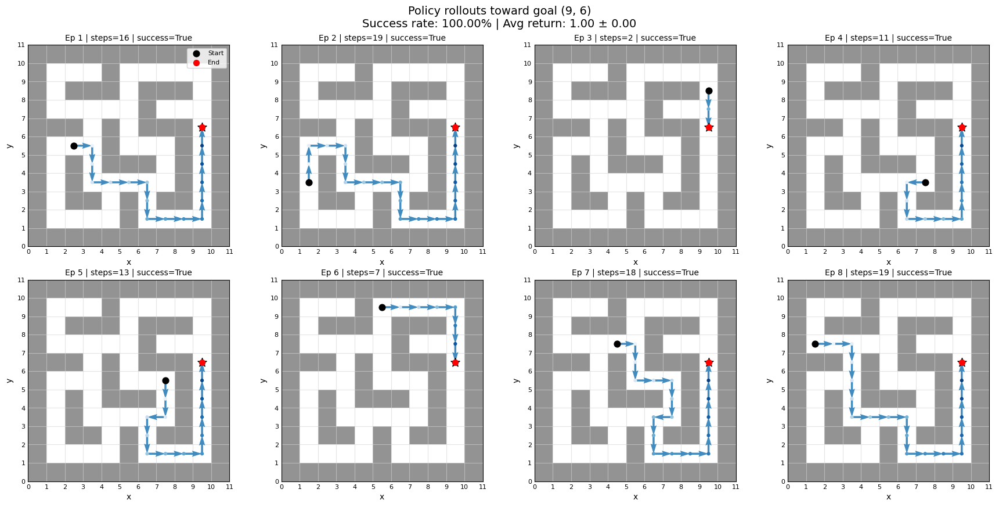

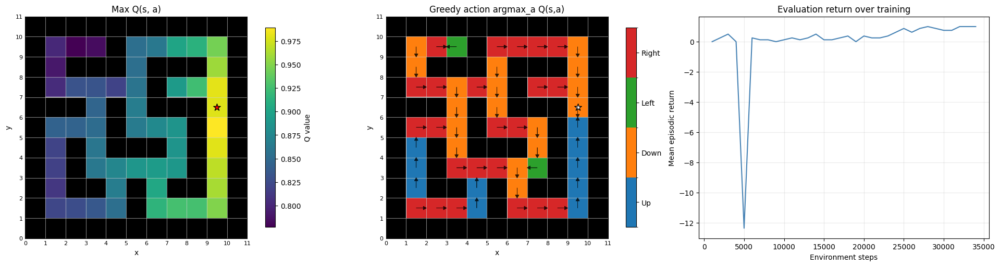

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.663083  3.0719018 2.96495   2.5451443 1.8891383]
cumulative variance (first 5 dims): [0.23406819 0.39868096 0.5520309  0.6650297  0.727285  ]
cos(phi(s,a), psi/task): mean=0.8208, std=0.0717


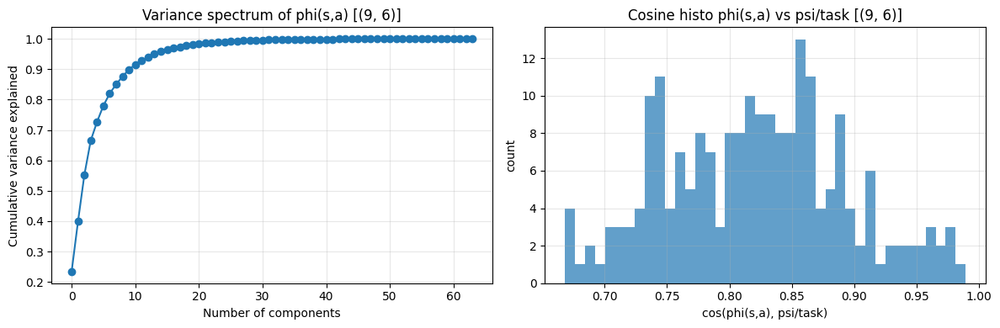


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2
  task_0      1.000      0.955      0.881
  task_1      0.955      1.000      0.950
  task_2      0.881      0.950      1.000

Off-diagonal mean similarity: 0.929
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 0.955
Finished task_2 | seed=42 | goal=(9, 6) | steps=34000 | time=119.09s | anchor_sets=3

----- seed=42, task_idx=3, goal=(5, 5) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-fa

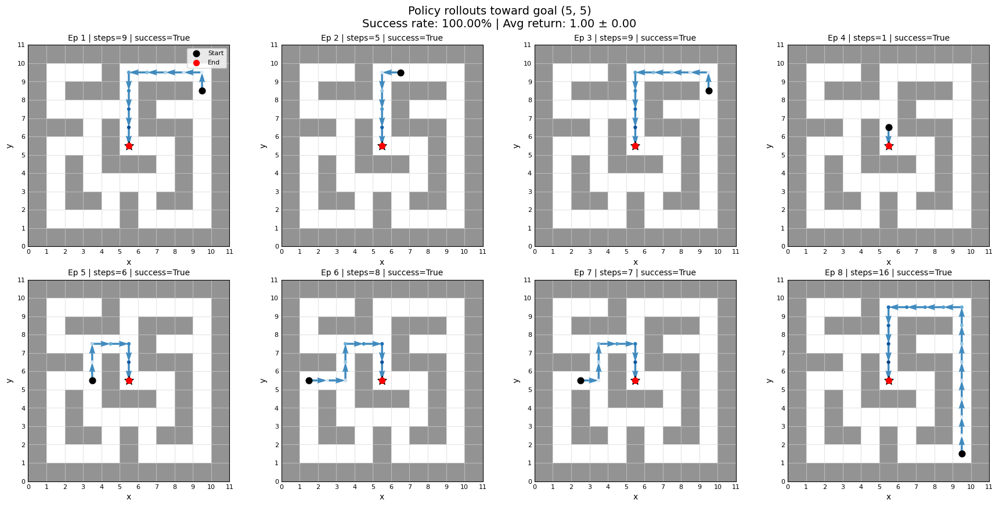

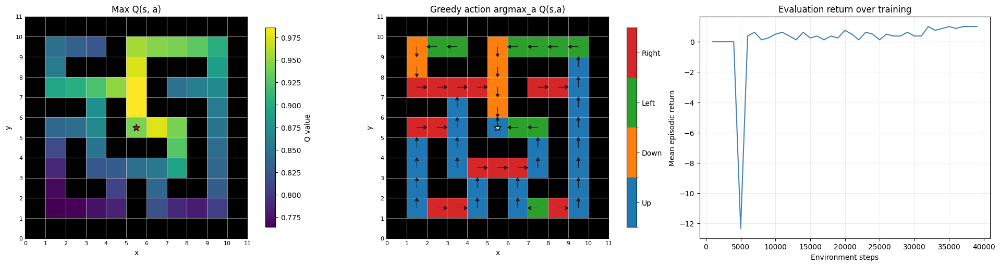

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.826496  3.2019365 3.0561361 2.5981905 1.8514643]
cumulative variance (first 5 dims): [0.24430771 0.4153723  0.5712127  0.68384856 0.7410445 ]
cos(phi(s,a), psi/task): mean=0.8036, std=0.0764


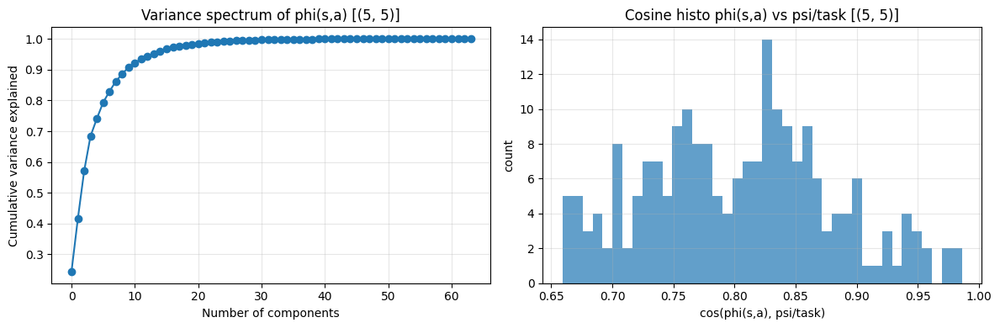


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3
  task_0      1.000      0.955      0.881      0.846
  task_1      0.955      1.000      0.950      0.917
  task_2      0.881      0.950      1.000      0.920
  task_3      0.846      0.917      0.920      1.000

Off-diagonal mean similarity: 0.911
Off-diagonal min similarity: 0.846
Off-diagonal max similarity: 0.955
Finished task_3 | seed=42 | goal=(5, 5) | steps=39000 | time=127.21s | anchor_sets=4

----- seed=42, task_idx=4, goal=(7, 5) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.375 | eval_len=314.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.250 | eval_len=375.9 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.125 | eval_len=438.2 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval

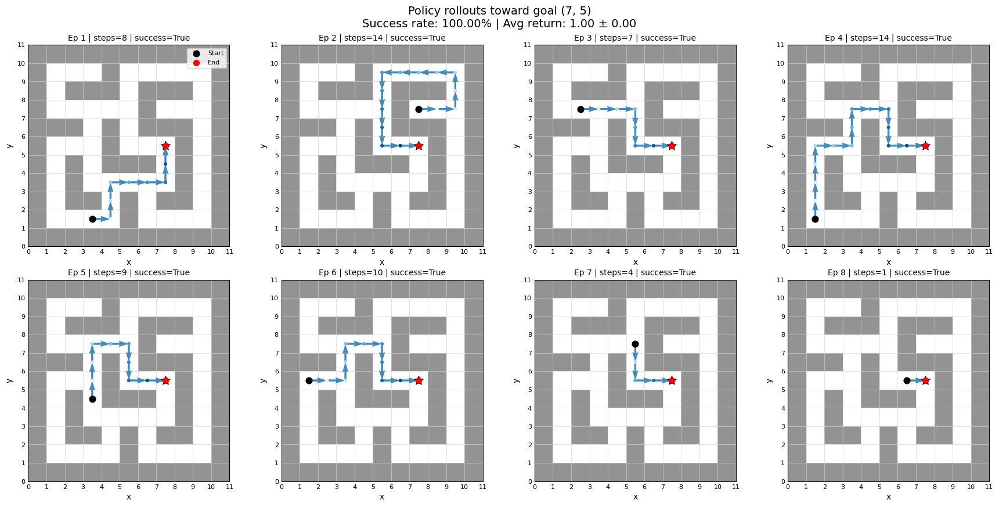

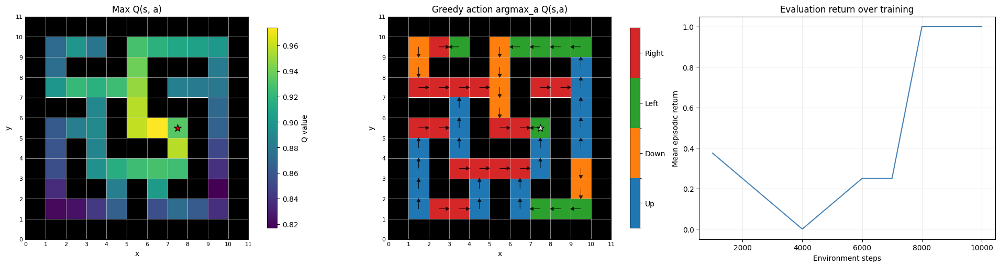

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.688809  3.177315  2.8506017 2.4545922 1.7928706]
cumulative variance (first 5 dims): [0.2506622 0.4366297 0.5863186 0.6973064 0.756519 ]
cos(phi(s,a), psi/task): mean=0.8388, std=0.0617


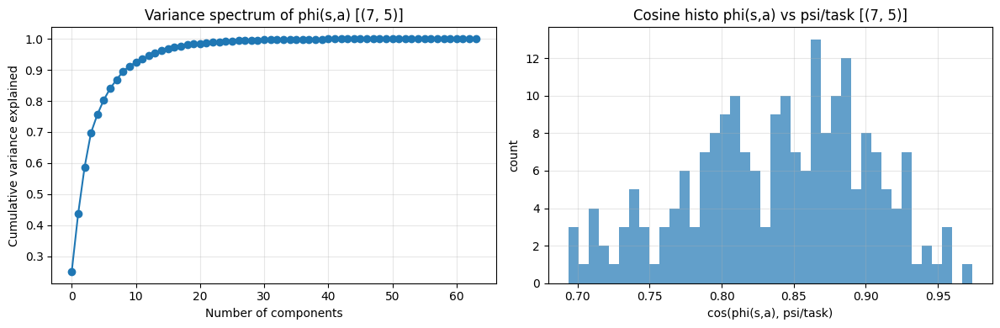


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4
  task_0      1.000      0.955      0.881      0.846      0.904
  task_1      0.955      1.000      0.950      0.917      0.971
  task_2      0.881      0.950      1.000      0.920      0.949
  task_3      0.846      0.917      0.920      1.000      0.978
  task_4      0.904      0.971      0.949      0.978      1.000

Off-diagonal mean similarity: 0.927
Off-diagonal min similarity: 0.846
Off-diagonal max similarity: 0.978
Finished task_4 | seed=42 | goal=(7, 5) | steps=10000 | time=25.16s | anchor_sets=5

----- seed=42, task_idx=5, goal=(8, 7) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval

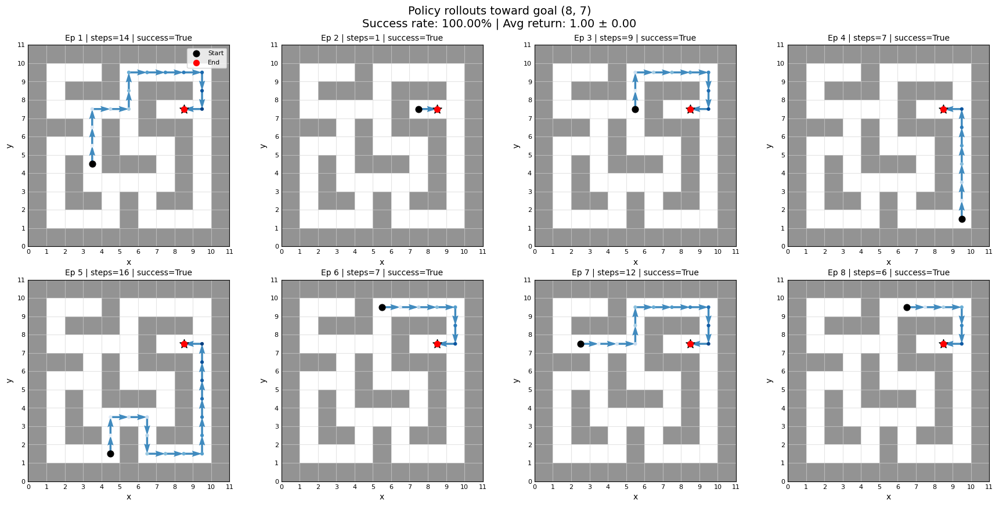

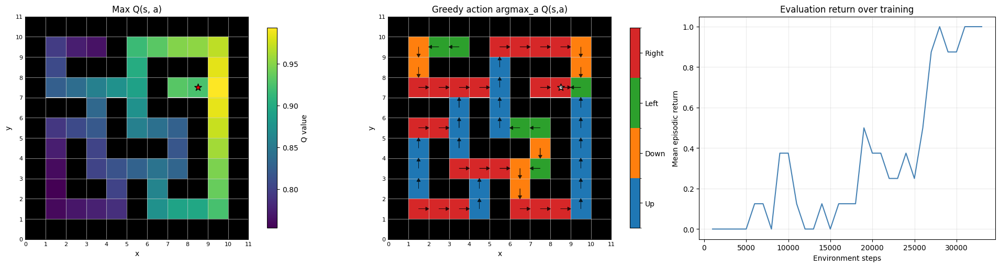

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.542157  3.2330606 2.8953612 2.6893203 1.9345589]
cumulative variance (first 5 dims): [0.2099893  0.38492936 0.52523243 0.64627737 0.70891356]
cos(phi(s,a), psi/task): mean=0.7991, std=0.0861


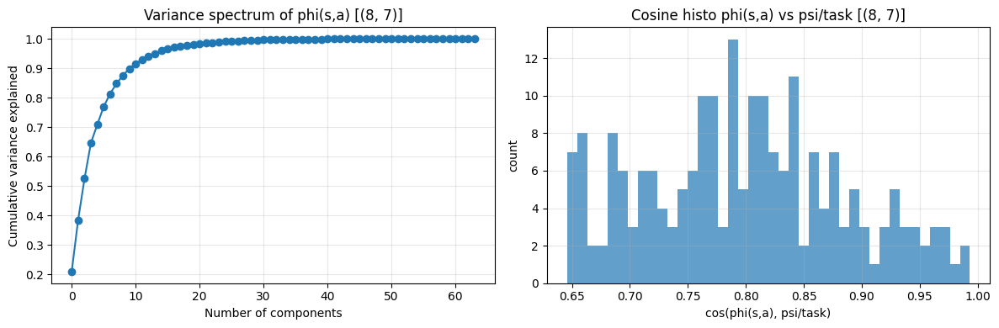


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5
  task_0      1.000      0.955      0.881      0.846      0.904      0.845
  task_1      0.955      1.000      0.950      0.917      0.971      0.922
  task_2      0.881      0.950      1.000      0.920      0.949      0.984
  task_3      0.846      0.917      0.920      1.000      0.978      0.934
  task_4      0.904      0.971      0.949      0.978      1.000      0.945
  task_5      0.845      0.922      0.984      0.934      0.945      1.000

Off-diagonal mean similarity: 0.927
Off-diagonal min similarity: 0.845
Off-diagonal max similarity: 0.984
Finished task_5 | seed=42 | goal=(8, 7) | steps=33000 | time=116.16s | anchor_sets=6

----- seed=42, task_idx=6, goal=(4, 1) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | 

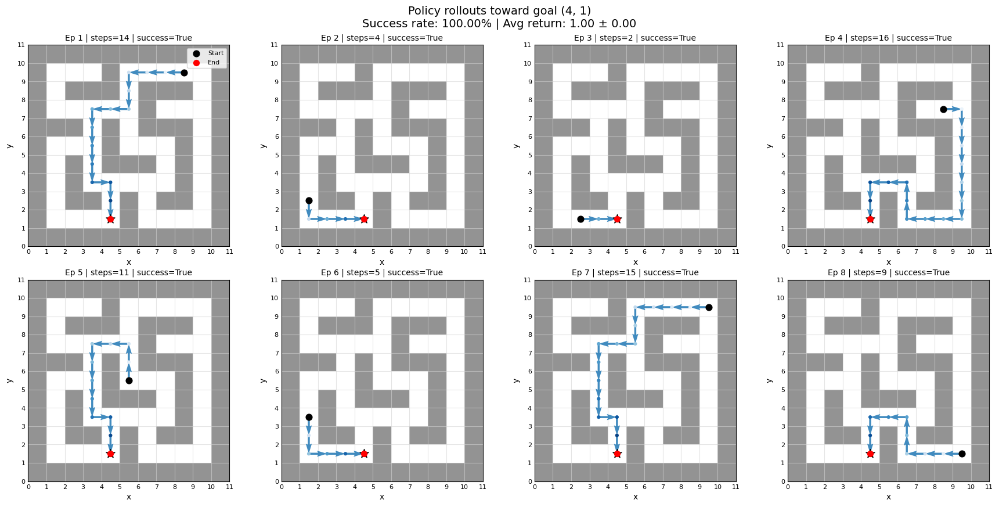

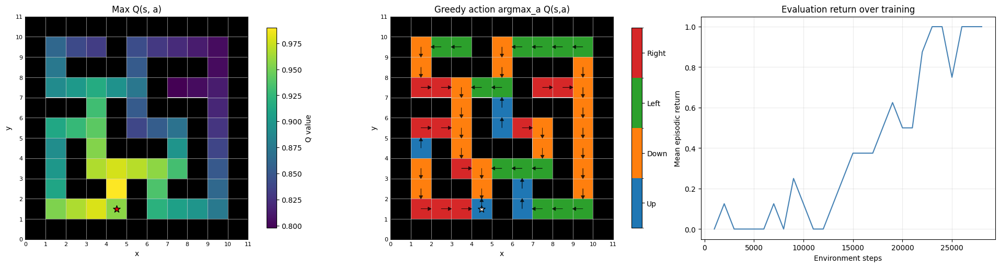

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.7417006 3.0894325 2.8745954 2.4661663 1.915419 ]
cumulative variance (first 5 dims): [0.25279218 0.42513096 0.5743345  0.68415165 0.75039667]
cos(phi(s,a), psi/task): mean=0.8272, std=0.0756


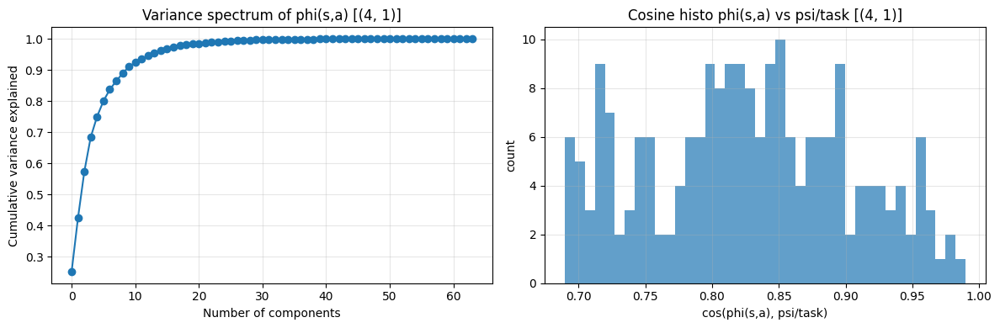


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6
  task_0      1.000      0.955      0.881      0.846      0.904      0.845      0.975
  task_1      0.955      1.000      0.950      0.917      0.971      0.922      0.971
  task_2      0.881      0.950      1.000      0.920      0.949      0.984      0.920
  task_3      0.846      0.917      0.920      1.000      0.978      0.934      0.901
  task_4      0.904      0.971      0.949      0.978      1.000      0.945      0.946
  task_5      0.845      0.922      0.984      0.934      0.945      1.000      0.900
  task_6      0.975      0.971      0.920      0.901      0.946      0.900      1.000

Off-diagonal mean similarity: 0.929
Off-diagonal min similarity: 0.845
Off-diagonal max similarity: 0.984
Finished task_6 | seed=42 | goal=(4, 1) | steps=28000 | time=92.68s | anchor_sets=7

----- seed=42, task_idx=7, goal=(1, 9) -----

[DQN-factorised] step=   1000 | eps=0.98

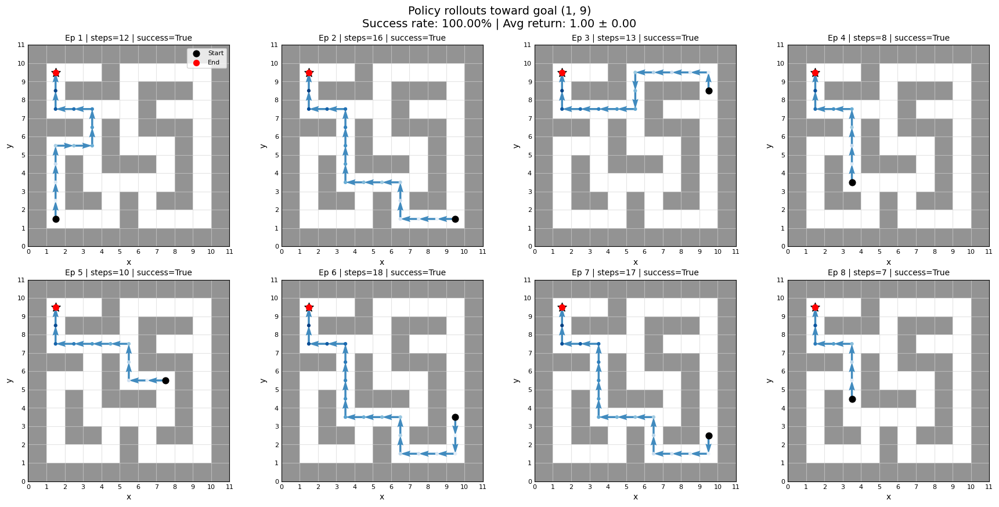

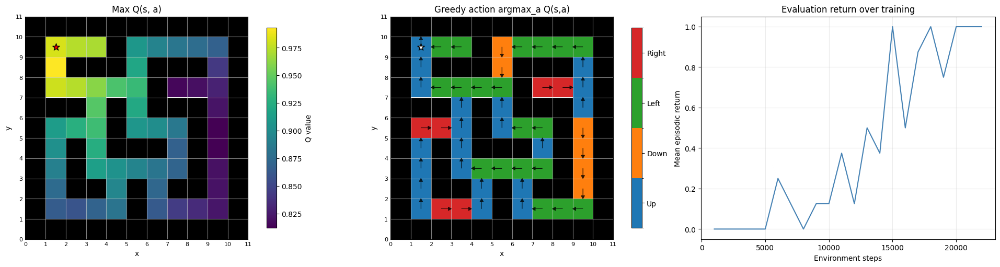

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.6564643 3.200994  2.8771038 2.2208793 1.8231813]
cumulative variance (first 5 dims): [0.24477667 0.43236983 0.58392066 0.67422265 0.73507917]
cos(phi(s,a), psi/task): mean=0.8327, std=0.0708


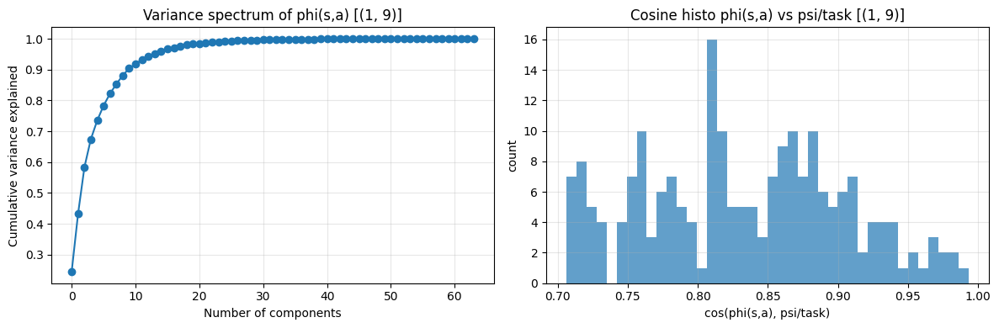


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7
  task_0      1.000      0.955      0.881      0.846      0.904      0.845      0.975      0.933
  task_1      0.955      1.000      0.950      0.917      0.971      0.922      0.971      0.949
  task_2      0.881      0.950      1.000      0.920      0.949      0.984      0.920      0.924
  task_3      0.846      0.917      0.920      1.000      0.978      0.934      0.901      0.964
  task_4      0.904      0.971      0.949      0.978      1.000      0.945      0.946      0.969
  task_5      0.845      0.922      0.984      0.934      0.945      1.000      0.900      0.928
  task_6      0.975      0.971      0.920      0.901      0.946      0.900      1.000      0.960
  task_7      0.933      0.949      0.924      0.964      0.969      0.928      0.960      1.000

Off-diagonal mean similarity: 0.934
Off-diagonal min similarity: 0.845
Off-diagonal max simi

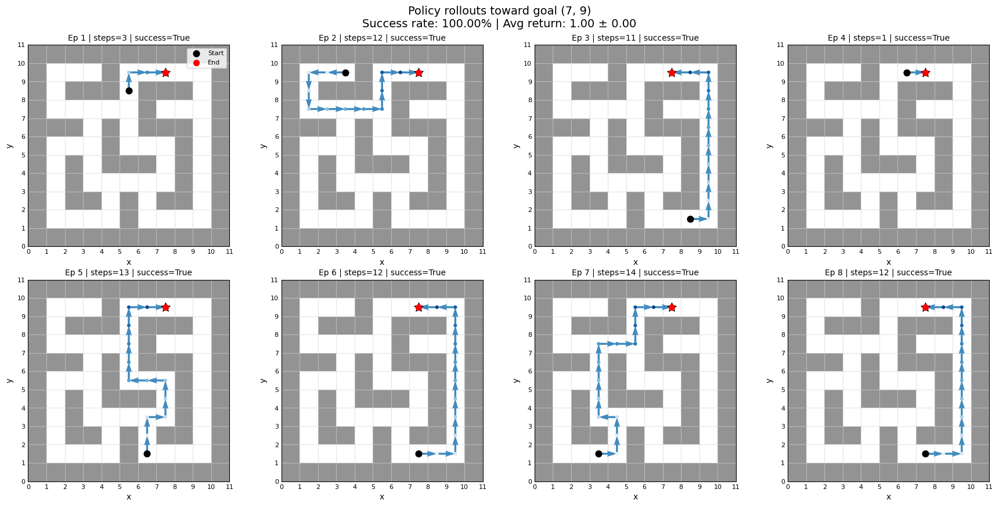

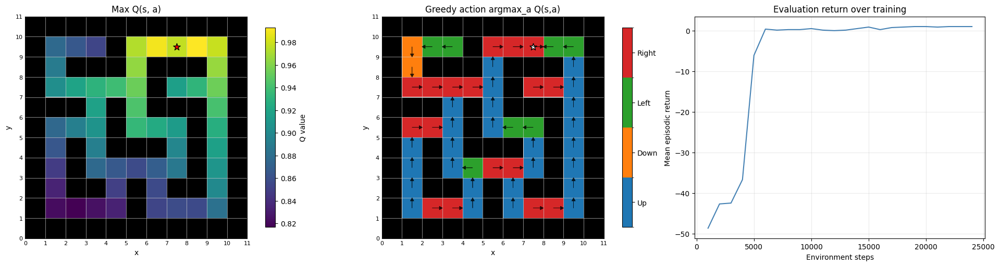

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.3764987 3.1334598 2.741009  2.4312258 1.8162332]
cumulative variance (first 5 dims): [0.21588333 0.40180677 0.54407465 0.65600204 0.7184659 ]
cos(phi(s,a), psi/task): mean=0.8405, std=0.0691


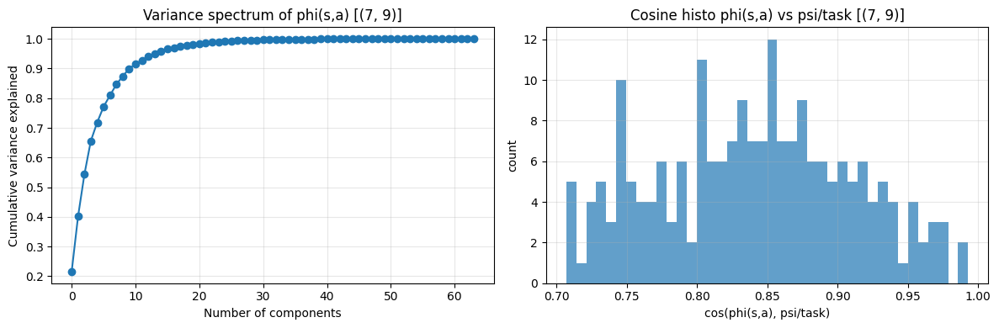


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8
  task_0      1.000      0.955      0.881      0.846      0.904      0.845      0.975      0.933      0.889
  task_1      0.955      1.000      0.950      0.917      0.971      0.922      0.971      0.949      0.952
  task_2      0.881      0.950      1.000      0.920      0.949      0.984      0.920      0.924      0.969
  task_3      0.846      0.917      0.920      1.000      0.978      0.934      0.901      0.964      0.979
  task_4      0.904      0.971      0.949      0.978      1.000      0.945      0.946      0.969      0.983
  task_5      0.845      0.922      0.984      0.934      0.945      1.000      0.900      0.928      0.979
  task_6      0.975      0.971      0.920      0.901      0.946      0.900      1.000      0.960      0.936
  task_7      0.933      0.949      0.924      0.964      0.969      0.928      0.960      1.000      

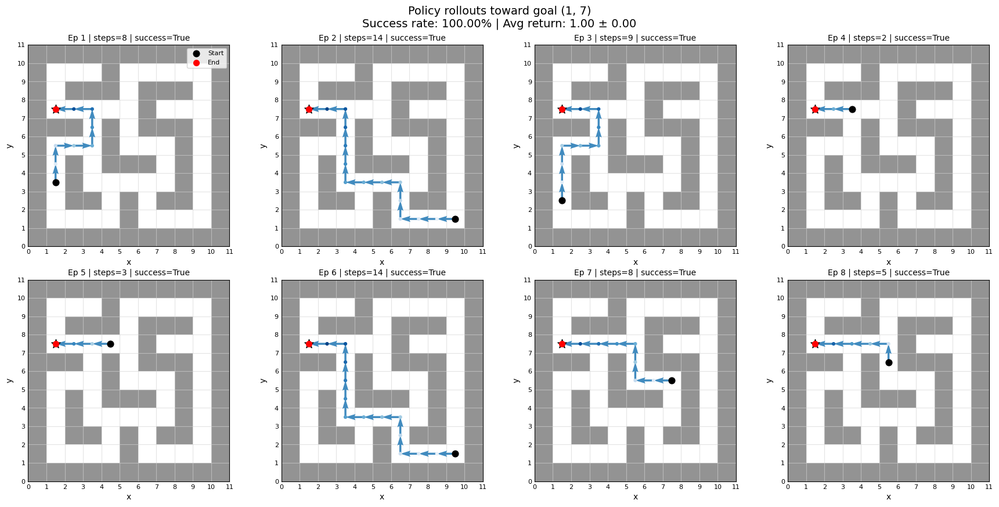

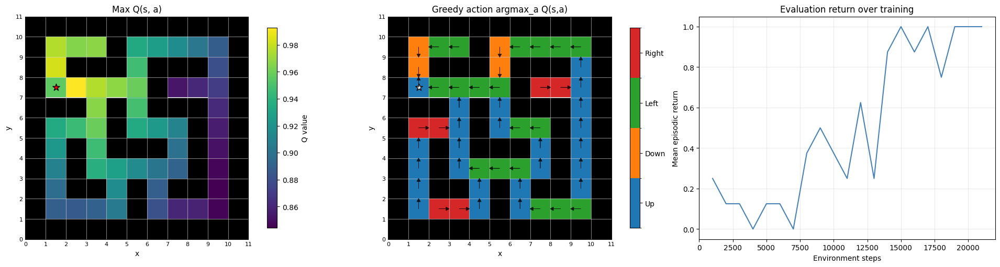

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.5978608 3.1728559 2.7266037 2.2336223 1.6596807]
cumulative variance (first 5 dims): [0.25212294 0.4481989  0.5929986  0.69017106 0.74382144]
cos(phi(s,a), psi/task): mean=0.8557, std=0.0649


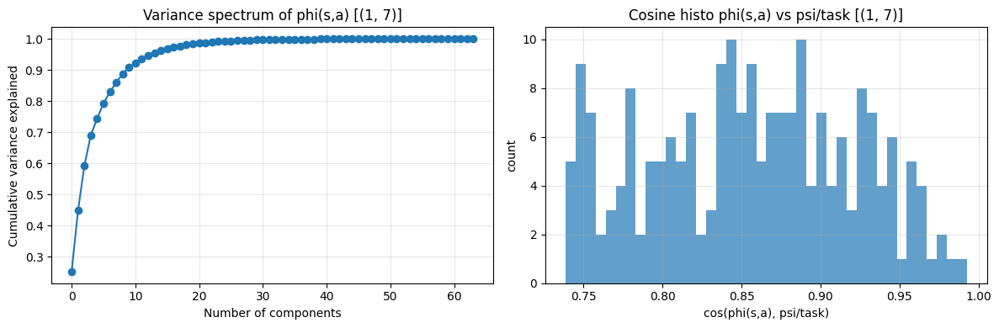


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9
  task_0      1.000      0.955      0.881      0.846      0.904      0.845      0.975      0.933      0.889      0.942
  task_1      0.955      1.000      0.950      0.917      0.971      0.922      0.971      0.949      0.952      0.972
  task_2      0.881      0.950      1.000      0.920      0.949      0.984      0.920      0.924      0.969      0.944
  task_3      0.846      0.917      0.920      1.000      0.978      0.934      0.901      0.964      0.979      0.968
  task_4      0.904      0.971      0.949      0.978      1.000      0.945      0.946      0.969      0.983      0.984
  task_5      0.845      0.922      0.984      0.934      0.945      1.000      0.900      0.928      0.979      0.939
  task_6      0.975      0.971      0.920      0.901      0.946      0.900      1.000      0.960      0.936      0.970
  task_7      

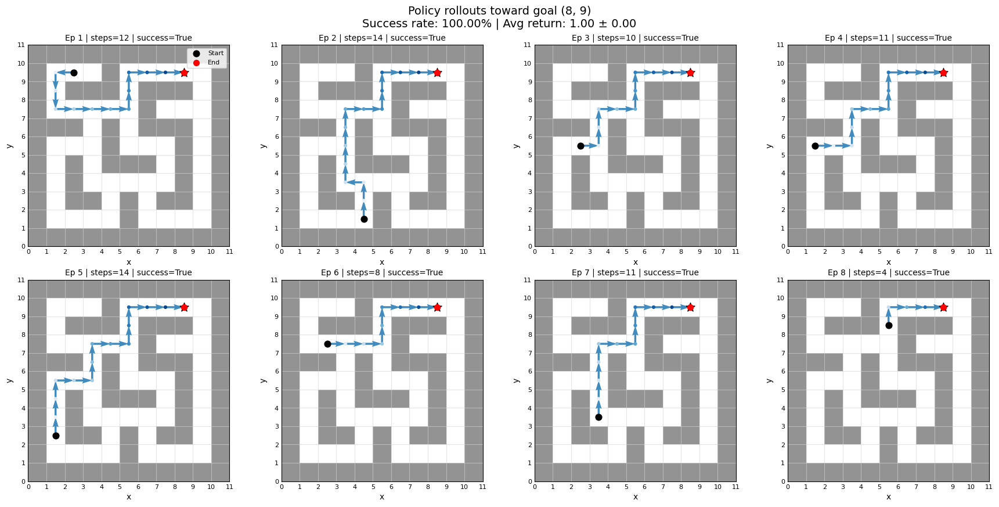

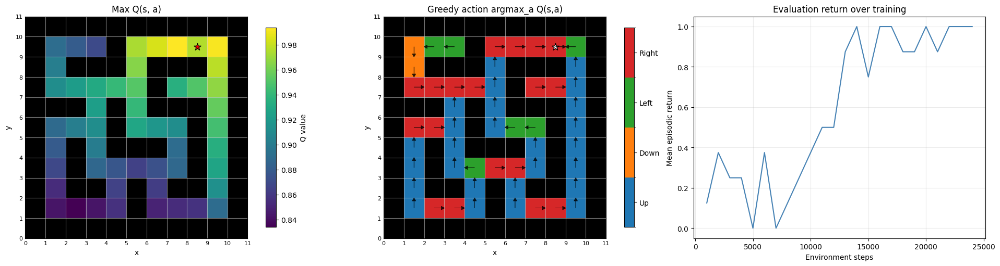

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.2876272 3.0905094 2.6699045 2.400852  1.7972339]
cumulative variance (first 5 dims): [0.21344706 0.40206596 0.54283804 0.65666777 0.72045505]
cos(phi(s,a), psi/task): mean=0.8508, std=0.0672


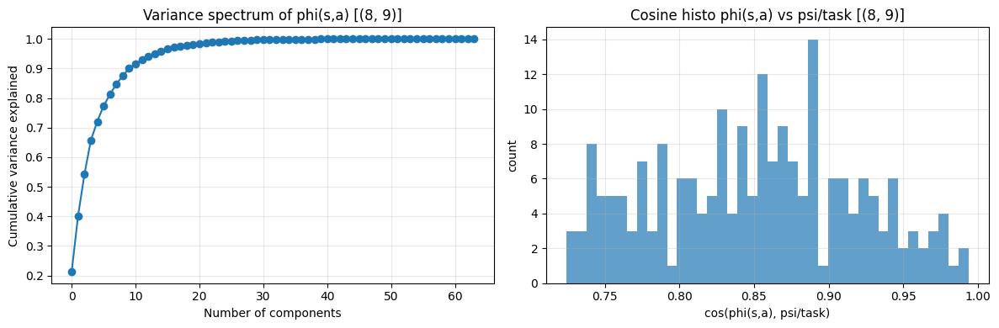


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10
  task_0      1.000      0.955      0.881      0.846      0.904      0.845      0.975      0.933      0.889      0.942      0.890
  task_1      0.955      1.000      0.950      0.917      0.971      0.922      0.971      0.949      0.952      0.972      0.956
  task_2      0.881      0.950      1.000      0.920      0.949      0.984      0.920      0.924      0.969      0.944      0.975
  task_3      0.846      0.917      0.920      1.000      0.978      0.934      0.901      0.964      0.979      0.968      0.975
  task_4      0.904      0.971      0.949      0.978      1.000      0.945      0.946      0.969      0.983      0.984      0.984
  task_5      0.845      0.922      0.984      0.934      0.945      1.000      0.900      0.928      0.979      0.939      0.981
  task_6      0.975      0.971      0.920      0.901    

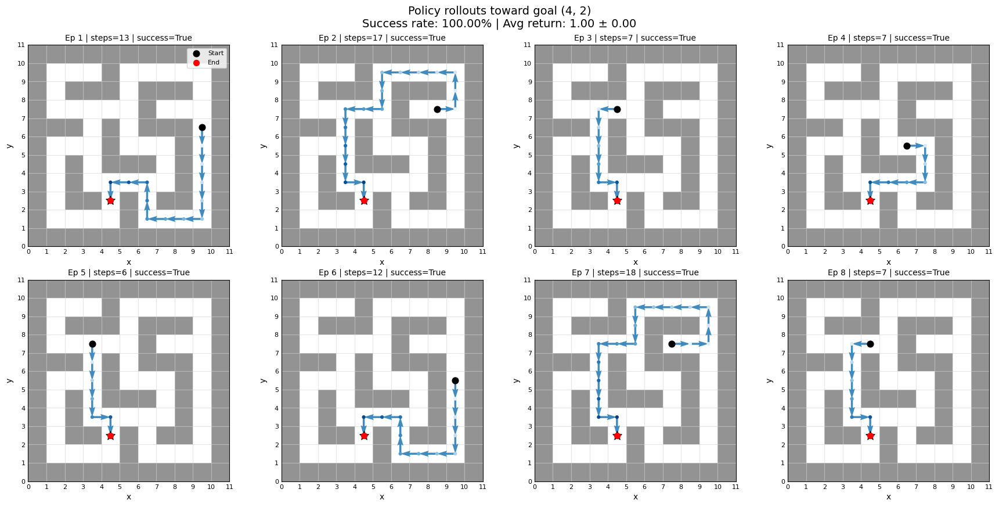

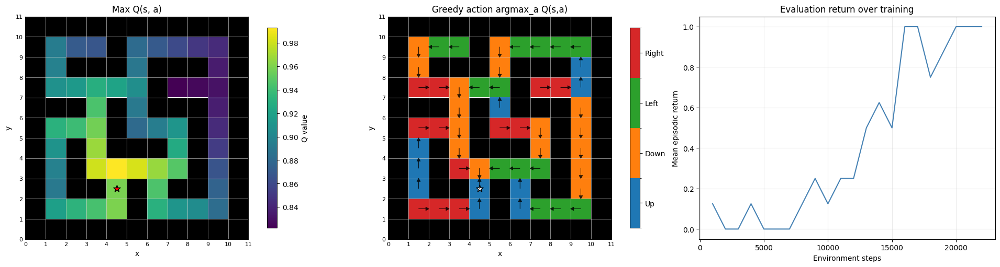

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.5694845 2.9582345 2.833842  2.463232  1.7846037]
cumulative variance (first 5 dims): [0.24480982 0.41295448 0.5672556  0.6838368  0.74502975]
cos(phi(s,a), psi/task): mean=0.8459, std=0.0668


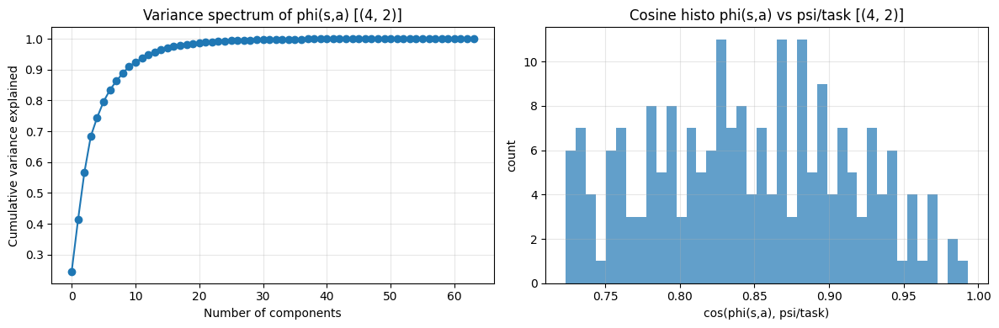


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10    task_11
  task_0      1.000      0.955      0.881      0.846      0.904      0.845      0.975      0.933      0.889      0.942      0.890      0.965
  task_1      0.955      1.000      0.950      0.917      0.971      0.922      0.971      0.949      0.952      0.972      0.956      0.985
  task_2      0.881      0.950      1.000      0.920      0.949      0.984      0.920      0.924      0.969      0.944      0.975      0.926
  task_3      0.846      0.917      0.920      1.000      0.978      0.934      0.901      0.964      0.979      0.968      0.975      0.913
  task_4      0.904      0.971      0.949      0.978      1.000      0.945      0.946      0.969      0.983      0.984      0.984      0.962
  task_5      0.845      0.922      0.984      0.934      0.945      1.000      0.900      0.928      0.979      0.939  

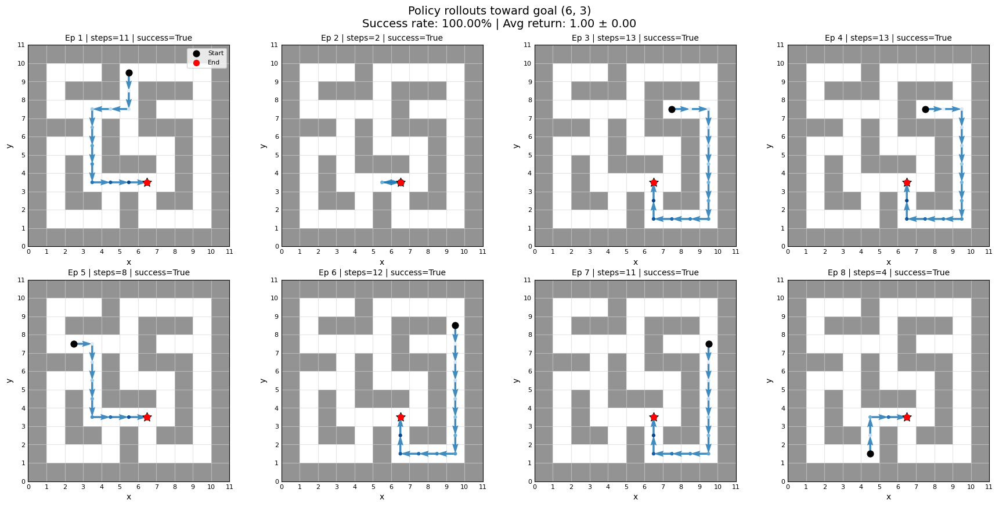

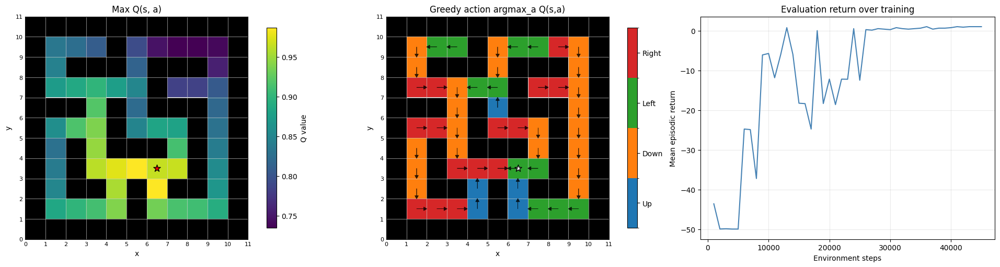

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.2392406 3.3242588 3.1550326 2.4633288 2.2393425]
cumulative variance (first 5 dims): [0.27561638 0.44509643 0.59776044 0.6908227  0.7677304 ]
cos(phi(s,a), psi/task): mean=0.8086, std=0.0828


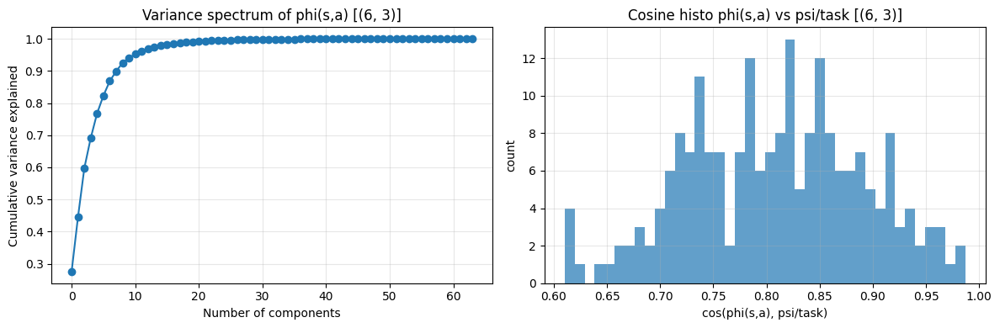


Goal embedding cosine similarity matrix:
     task_0
  task_0      1.000
Finished task_0 | seed=123 | goal=(6, 3) | steps=45000 | time=136.30s | anchor_sets=1

----- seed=123, task_idx=1, goal=(3, 1) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-18.613 | eval_len=437.8 | TD=5.4552e-04 | SA-stability=0.0000e+00 | projection=False dot=0.000e+00 g_new=2.354e-02 g_stable=0.000e+00
[DQN-factorised] step=   6000 | eps=0.886 | eval_

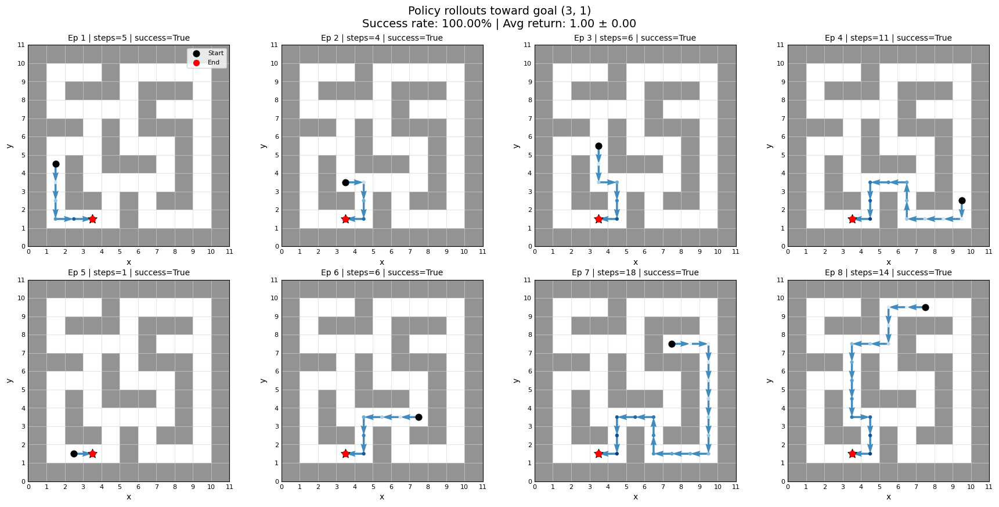

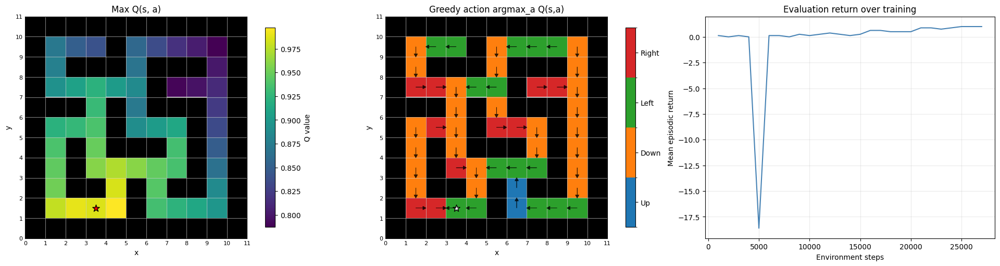

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.8992612 3.280464  2.7608142 2.3339393 1.8934001]
cumulative variance (first 5 dims): [0.26641476 0.4549811  0.5885385  0.68398786 0.746805  ]
cos(phi(s,a), psi/task): mean=0.8382, std=0.0776


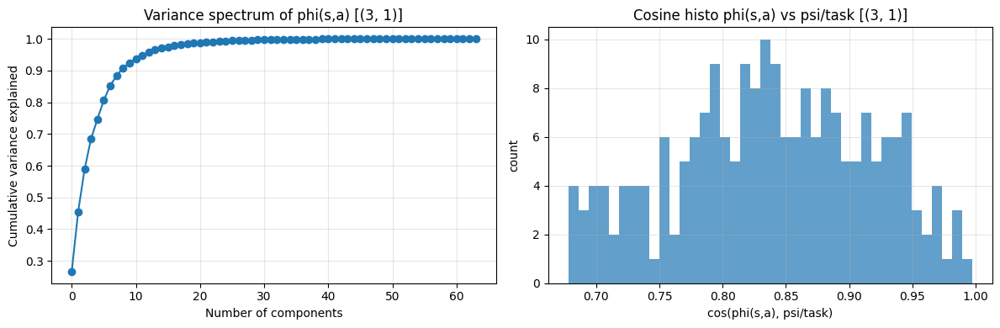


Goal embedding cosine similarity matrix:
     task_0     task_1
  task_0      1.000      0.992
  task_1      0.992      1.000

Off-diagonal mean similarity: 0.992
Off-diagonal min similarity: 0.992
Off-diagonal max similarity: 0.992
Finished task_1 | seed=123 | goal=(3, 1) | steps=27000 | time=83.84s | anchor_sets=2

----- seed=123, task_idx=2, goal=(7, 5) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-6.250 | eval_len=500.0 |

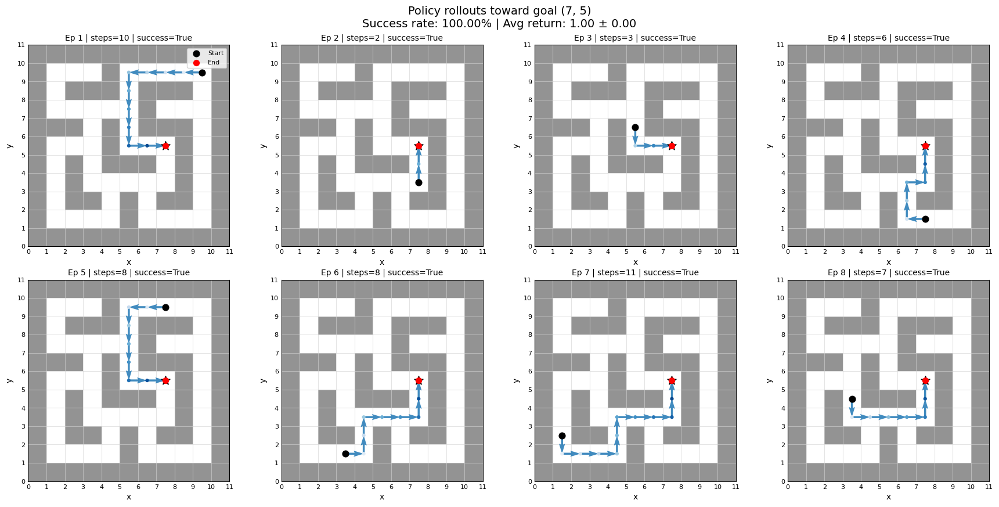

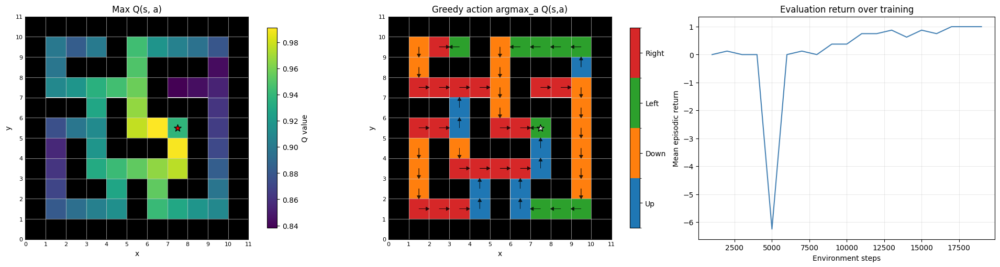

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.620925  3.1087928 2.6489623 2.3597043 1.8272283]
cumulative variance (first 5 dims): [0.25500542 0.44297773 0.5794555  0.68775475 0.75269234]
cos(phi(s,a), psi/task): mean=0.8554, std=0.0622


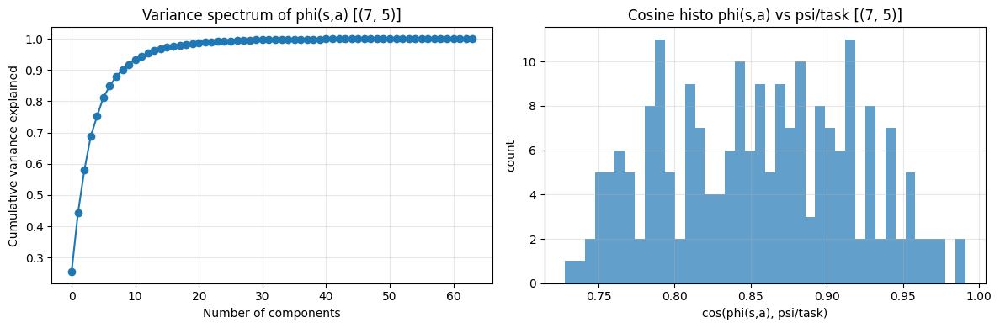


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2
  task_0      1.000      0.992      0.983
  task_1      0.992      1.000      0.986
  task_2      0.983      0.986      1.000

Off-diagonal mean similarity: 0.987
Off-diagonal min similarity: 0.983
Off-diagonal max similarity: 0.992
Finished task_2 | seed=123 | goal=(7, 5) | steps=19000 | time=54.06s | anchor_sets=3

----- seed=123, task_idx=3, goal=(1, 1) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-f

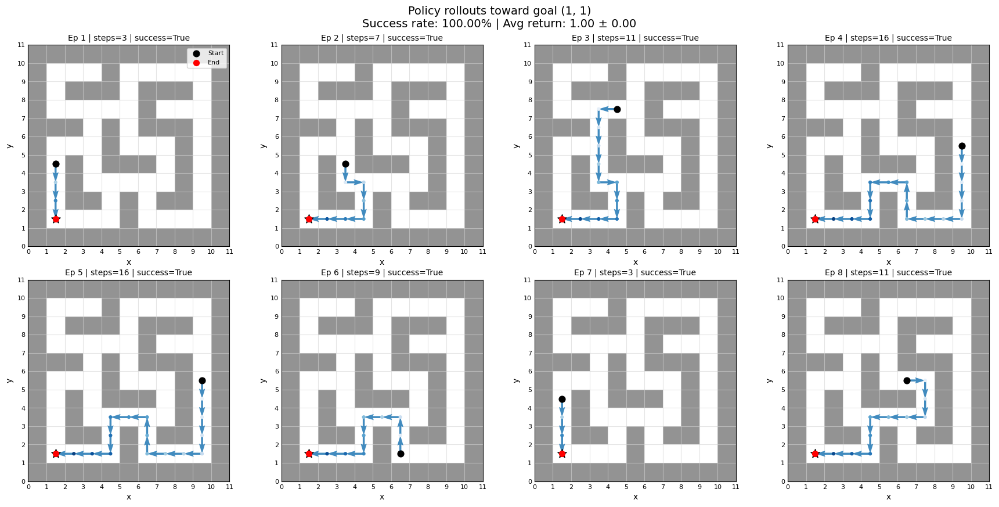

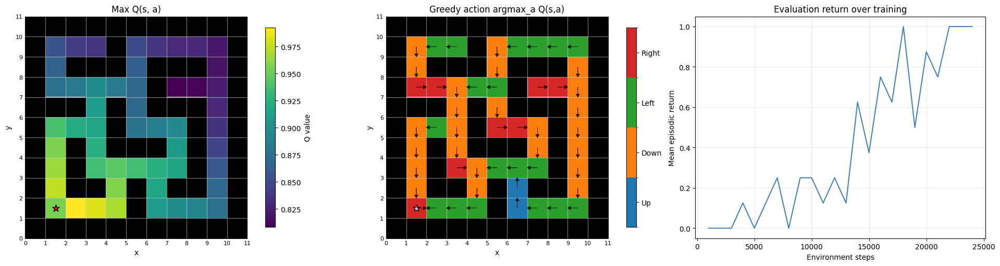

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.7511008 2.998465  2.717492  2.405545  1.8244059]
cumulative variance (first 5 dims): [0.26472205 0.4338715  0.57280576 0.6816736  0.7442939 ]
cos(phi(s,a), psi/task): mean=0.8336, std=0.0704


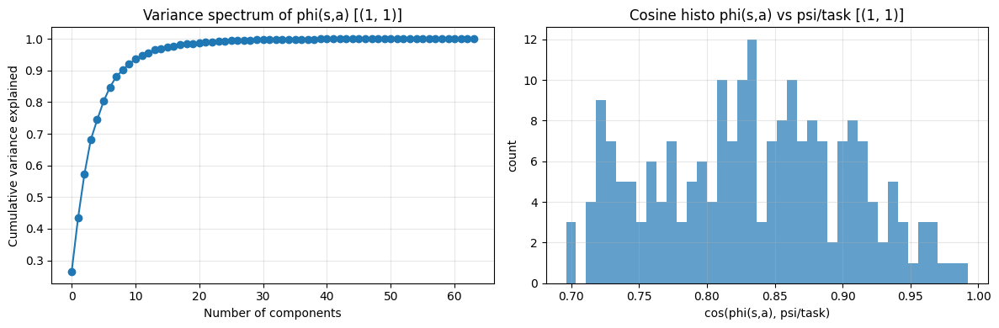


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3
  task_0      1.000      0.992      0.983      0.969
  task_1      0.992      1.000      0.986      0.983
  task_2      0.983      0.986      1.000      0.951
  task_3      0.969      0.983      0.951      1.000

Off-diagonal mean similarity: 0.977
Off-diagonal min similarity: 0.951
Off-diagonal max similarity: 0.992
Finished task_3 | seed=123 | goal=(1, 1) | steps=24000 | time=73.76s | anchor_sets=4

----- seed=123, task_idx=4, goal=(7, 9) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=437.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.375 | eval_len=313.2 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eva

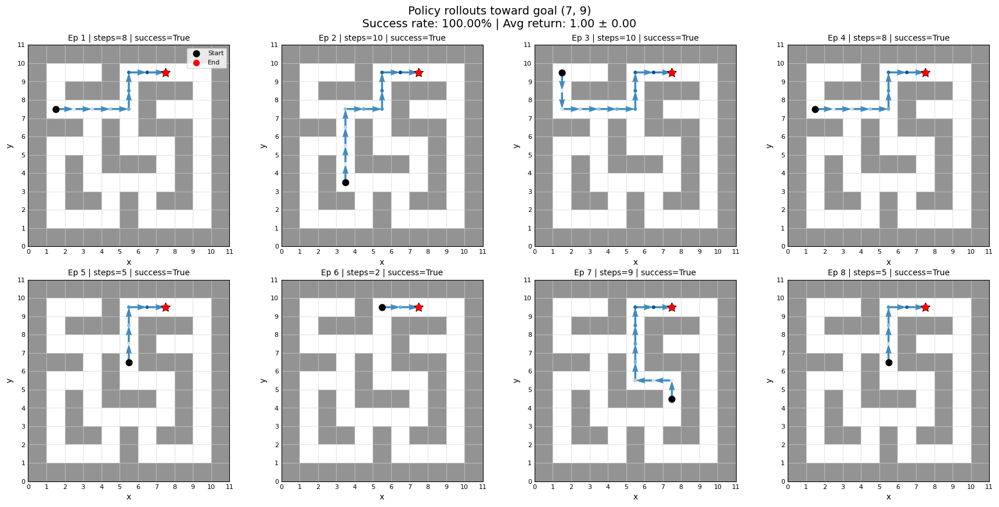

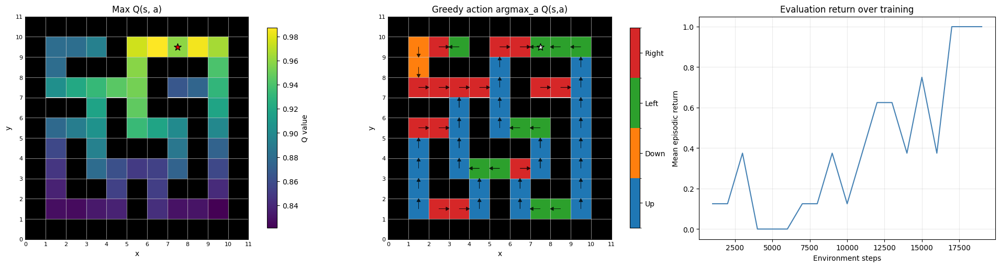

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.7716033 2.8255641 2.5553951 2.4300694 1.8212916]
cumulative variance (first 5 dims): [0.2712106  0.42342824 0.54792863 0.6605166  0.7237598 ]
cos(phi(s,a), psi/task): mean=0.8292, std=0.0673


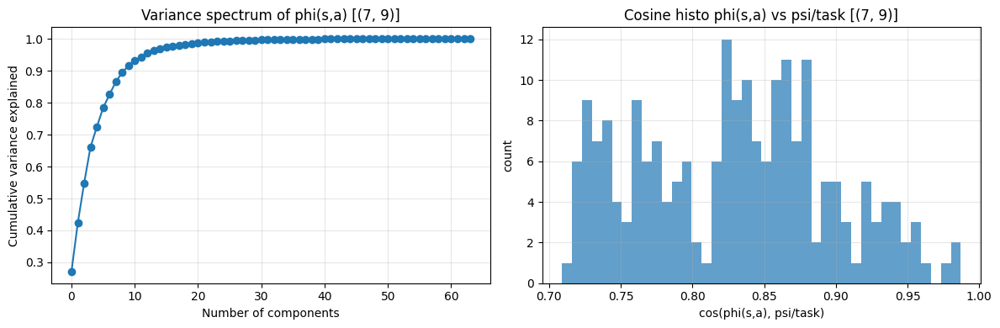


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4
  task_0      1.000      0.992      0.983      0.969      0.925
  task_1      0.992      1.000      0.986      0.983      0.938
  task_2      0.983      0.986      1.000      0.951      0.950
  task_3      0.969      0.983      0.951      1.000      0.928
  task_4      0.925      0.938      0.950      0.928      1.000

Off-diagonal mean similarity: 0.961
Off-diagonal min similarity: 0.925
Off-diagonal max similarity: 0.992
Finished task_4 | seed=123 | goal=(7, 9) | steps=19000 | time=57.13s | anchor_sets=5

----- seed=123, task_idx=5, goal=(1, 2) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | ev

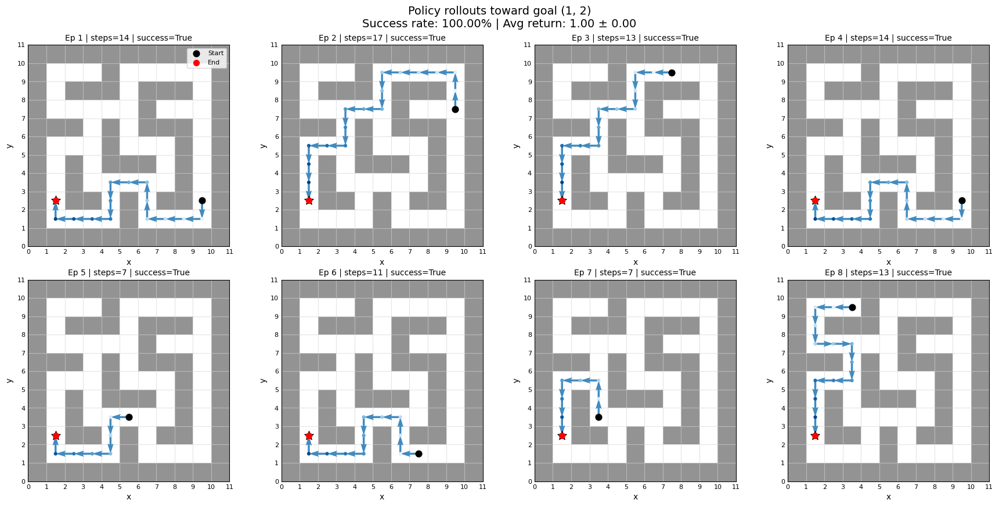

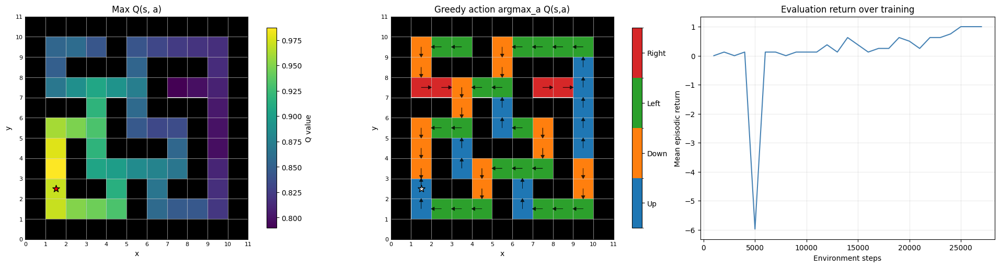

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.7286851 3.0542085 2.7885222 2.5443811 1.7487972]
cumulative variance (first 5 dims): [0.2571487  0.42968097 0.5735016  0.69324106 0.7498066 ]
cos(phi(s,a), psi/task): mean=0.8133, std=0.0726


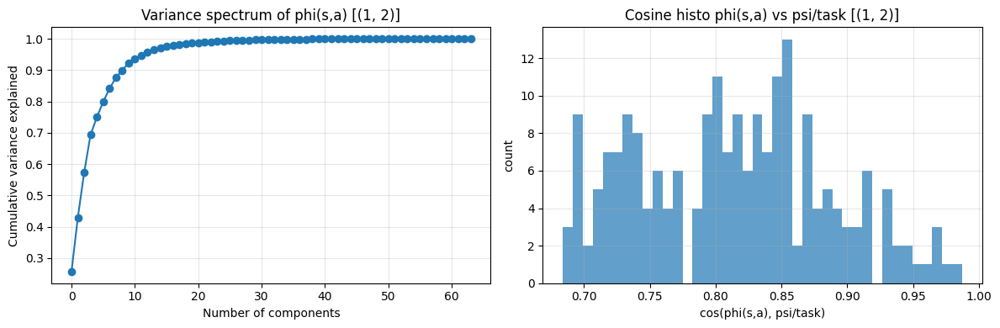


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5
  task_0      1.000      0.992      0.983      0.969      0.925      0.941
  task_1      0.992      1.000      0.986      0.983      0.938      0.956
  task_2      0.983      0.986      1.000      0.951      0.950      0.923
  task_3      0.969      0.983      0.951      1.000      0.928      0.986
  task_4      0.925      0.938      0.950      0.928      1.000      0.933
  task_5      0.941      0.956      0.923      0.986      0.933      1.000

Off-diagonal mean similarity: 0.956
Off-diagonal min similarity: 0.923
Off-diagonal max similarity: 0.992
Finished task_5 | seed=123 | goal=(1, 2) | steps=27000 | time=88.77s | anchor_sets=6

----- seed=123, task_idx=6, goal=(5, 8) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.250 |

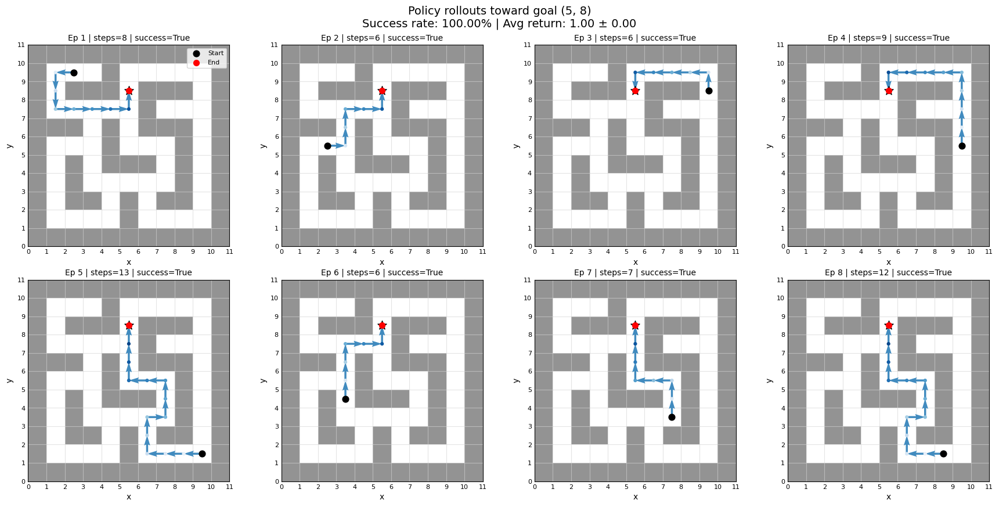

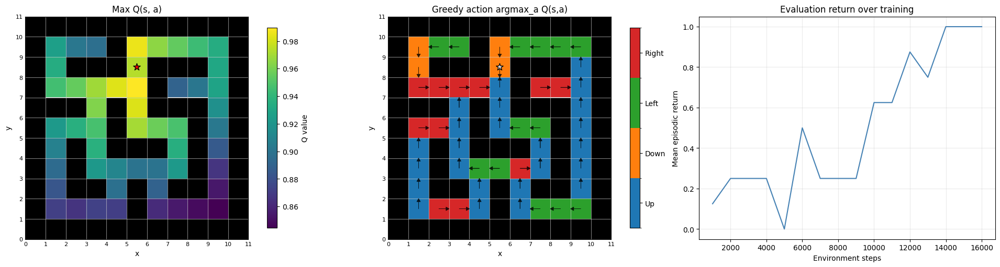

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.59849   2.6814368 2.6253574 2.444442  1.6492693]
cumulative variance (first 5 dims): [0.2718551  0.4228047  0.56750643 0.6929523  0.75005805]
cos(phi(s,a), psi/task): mean=0.8606, std=0.0640


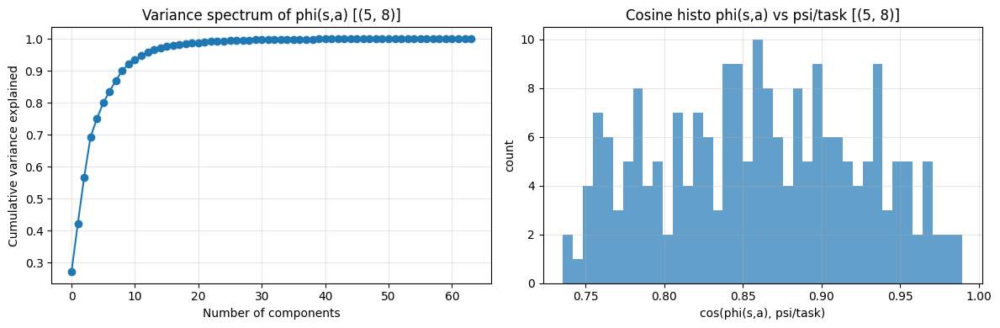


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6
  task_0      1.000      0.992      0.983      0.969      0.925      0.941      0.962
  task_1      0.992      1.000      0.986      0.983      0.938      0.956      0.970
  task_2      0.983      0.986      1.000      0.951      0.950      0.923      0.987
  task_3      0.969      0.983      0.951      1.000      0.928      0.986      0.948
  task_4      0.925      0.938      0.950      0.928      1.000      0.933      0.979
  task_5      0.941      0.956      0.923      0.986      0.933      1.000      0.940
  task_6      0.962      0.970      0.987      0.948      0.979      0.940      1.000

Off-diagonal mean similarity: 0.959
Off-diagonal min similarity: 0.923
Off-diagonal max similarity: 0.992
Finished task_6 | seed=123 | goal=(5, 8) | steps=16000 | time=42.07s | anchor_sets=7

----- seed=123, task_idx=7, goal=(9, 2) -----

[DQN-factorised] step=   1000 | eps=0.

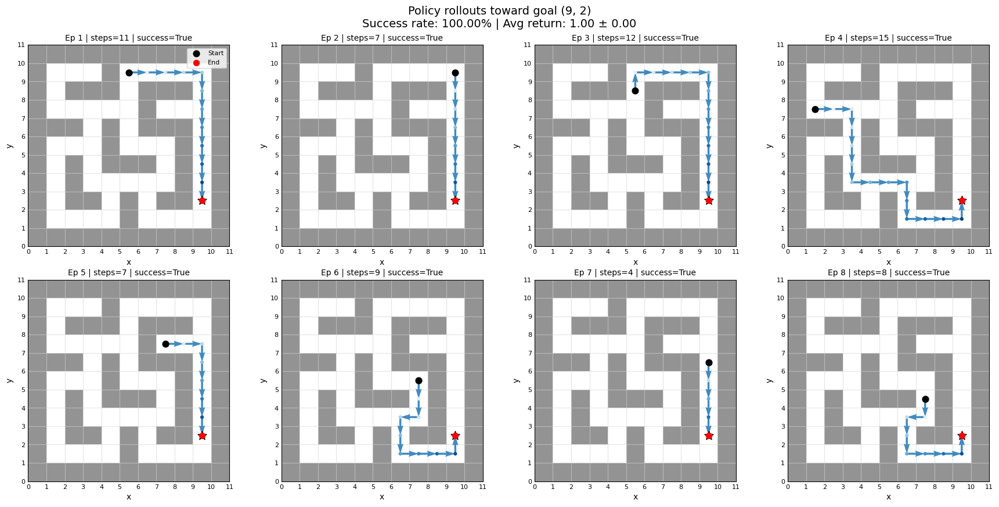

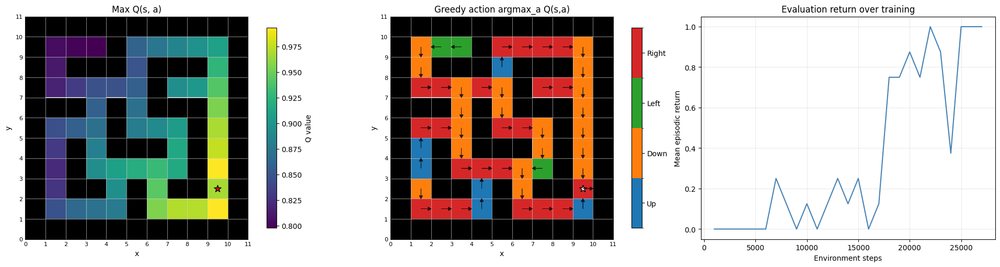

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.8760788 2.679865  2.5280366 2.2256527 1.8569914]
cumulative variance (first 5 dims): [0.29676992 0.4386301  0.5648714  0.66271883 0.7308357 ]
cos(phi(s,a), psi/task): mean=0.8311, std=0.0720


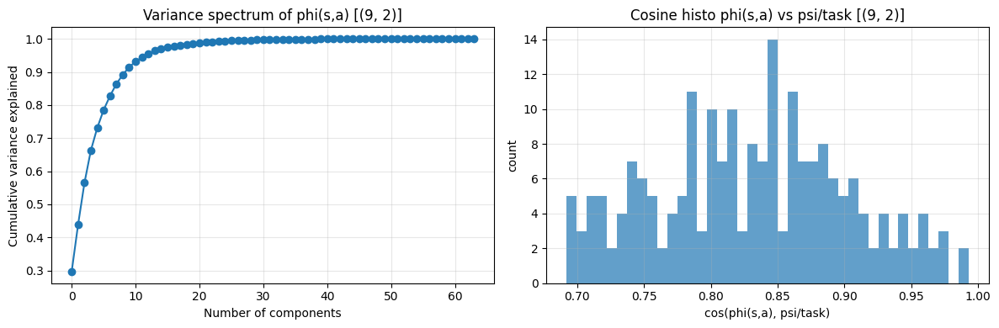


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7
  task_0      1.000      0.992      0.983      0.969      0.925      0.941      0.962      0.935
  task_1      0.992      1.000      0.986      0.983      0.938      0.956      0.970      0.939
  task_2      0.983      0.986      1.000      0.951      0.950      0.923      0.987      0.947
  task_3      0.969      0.983      0.951      1.000      0.928      0.986      0.948      0.904
  task_4      0.925      0.938      0.950      0.928      1.000      0.933      0.979      0.905
  task_5      0.941      0.956      0.923      0.986      0.933      1.000      0.940      0.878
  task_6      0.962      0.970      0.987      0.948      0.979      0.940      1.000      0.933
  task_7      0.935      0.939      0.947      0.904      0.905      0.878      0.933      1.000

Off-diagonal mean similarity: 0.949
Off-diagonal min similarity: 0.878
Off-diagonal max simi

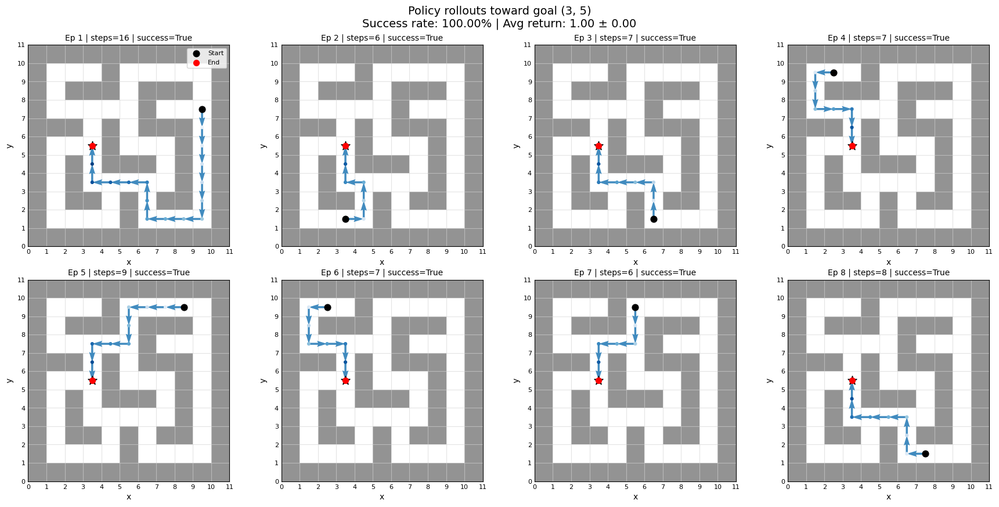

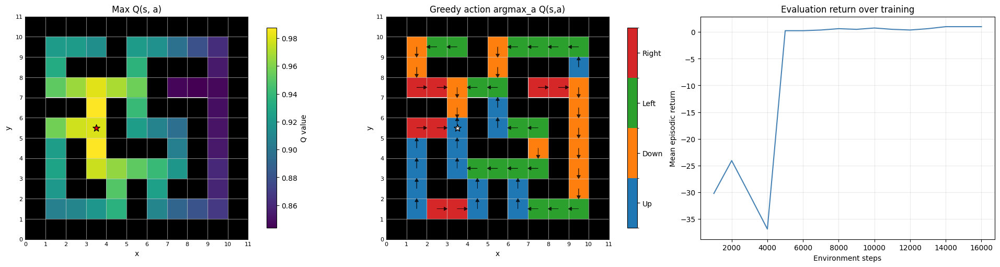

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.7283895 2.9164116 2.6778276 2.3389854 1.5642561]
cumulative variance (first 5 dims): [0.2820981  0.45470387 0.6002239  0.71124685 0.760903  ]
cos(phi(s,a), psi/task): mean=0.8579, std=0.0652


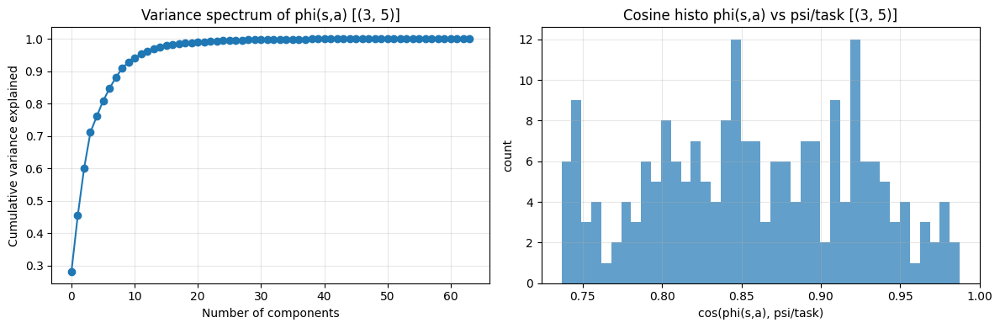


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8
  task_0      1.000      0.992      0.983      0.969      0.925      0.941      0.962      0.935      0.978
  task_1      0.992      1.000      0.986      0.983      0.938      0.956      0.970      0.939      0.984
  task_2      0.983      0.986      1.000      0.951      0.950      0.923      0.987      0.947      0.979
  task_3      0.969      0.983      0.951      1.000      0.928      0.986      0.948      0.904      0.975
  task_4      0.925      0.938      0.950      0.928      1.000      0.933      0.979      0.905      0.962
  task_5      0.941      0.956      0.923      0.986      0.933      1.000      0.940      0.878      0.970
  task_6      0.962      0.970      0.987      0.948      0.979      0.940      1.000      0.933      0.985
  task_7      0.935      0.939      0.947      0.904      0.905      0.878      0.933      1.000      

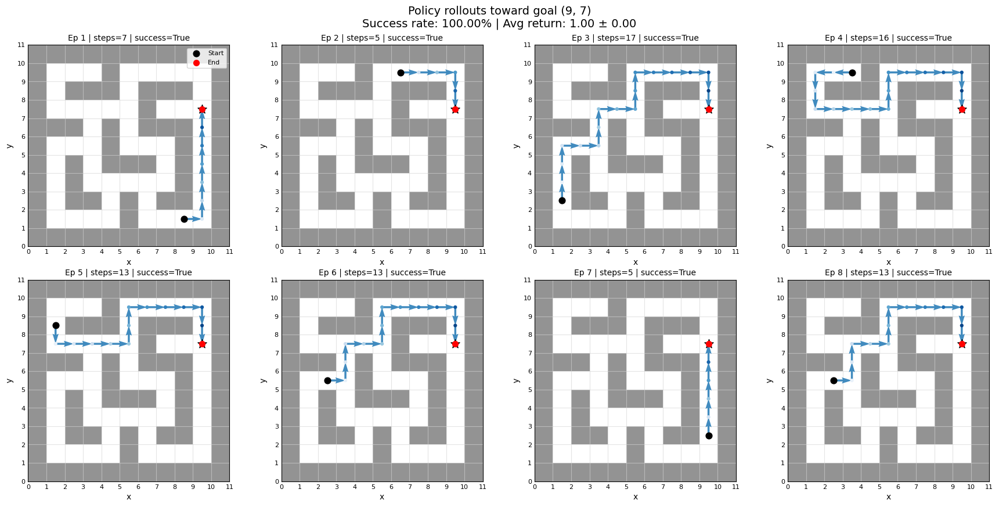

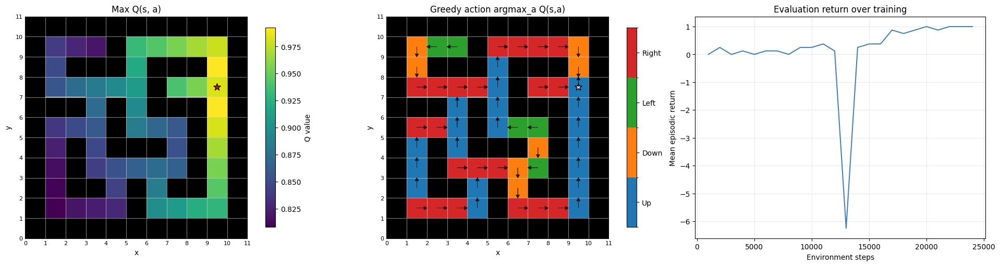

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.8438253 2.9058022 2.5099986 2.3006637 1.7879624]
cumulative variance (first 5 dims): [0.28648582 0.4502082  0.5723664  0.6749983  0.73698413]
cos(phi(s,a), psi/task): mean=0.8300, std=0.0733


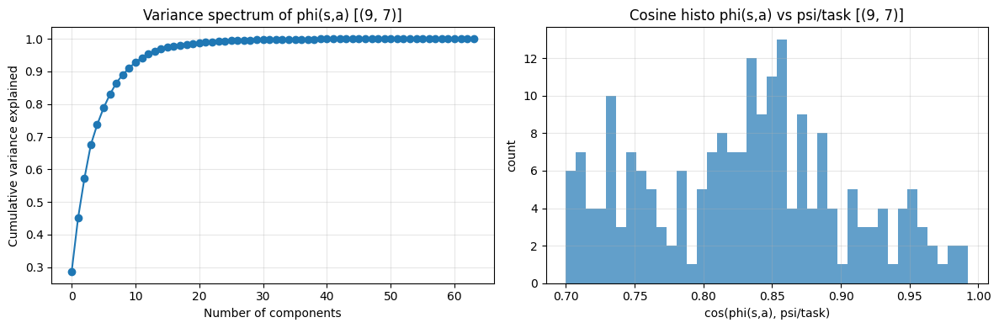


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9
  task_0      1.000      0.992      0.983      0.969      0.925      0.941      0.962      0.935      0.978      0.913
  task_1      0.992      1.000      0.986      0.983      0.938      0.956      0.970      0.939      0.984      0.925
  task_2      0.983      0.986      1.000      0.951      0.950      0.923      0.987      0.947      0.979      0.946
  task_3      0.969      0.983      0.951      1.000      0.928      0.986      0.948      0.904      0.975      0.893
  task_4      0.925      0.938      0.950      0.928      1.000      0.933      0.979      0.905      0.962      0.943
  task_5      0.941      0.956      0.923      0.986      0.933      1.000      0.940      0.878      0.970      0.876
  task_6      0.962      0.970      0.987      0.948      0.979      0.940      1.000      0.933      0.985      0.954
  task_7      

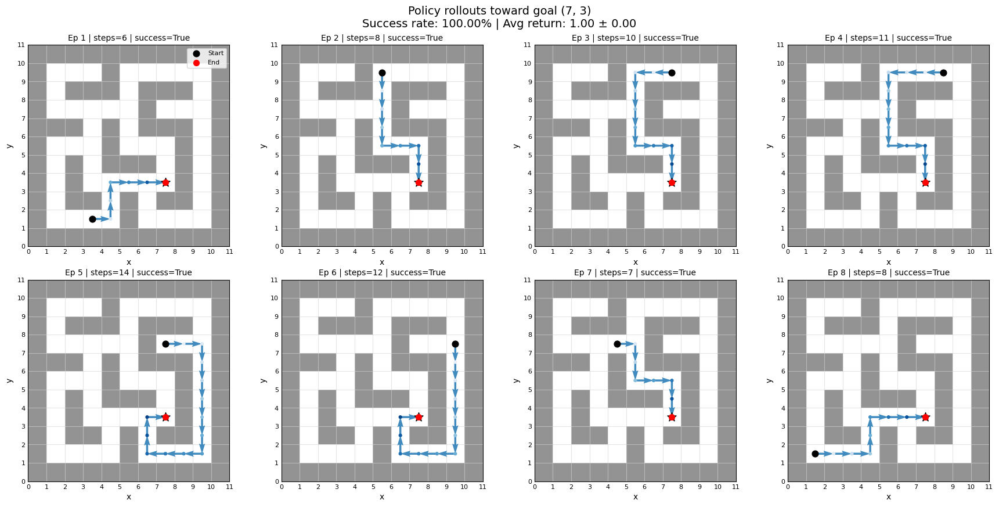

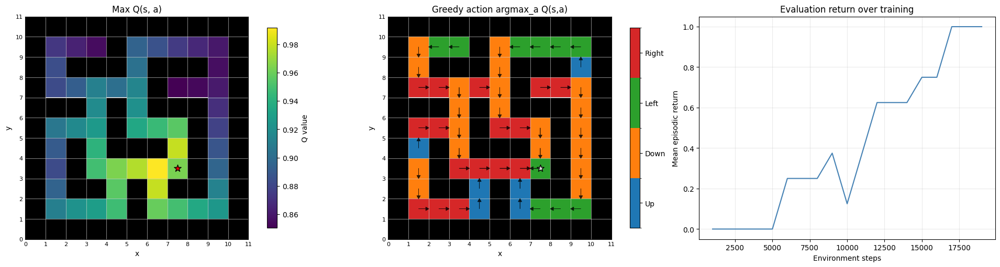

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.7215657 2.853752  2.7106006 2.3535104 1.7942263]
cumulative variance (first 5 dims): [0.2733825  0.4341328  0.57916033 0.68849343 0.7520373 ]
cos(phi(s,a), psi/task): mean=0.8555, std=0.0629


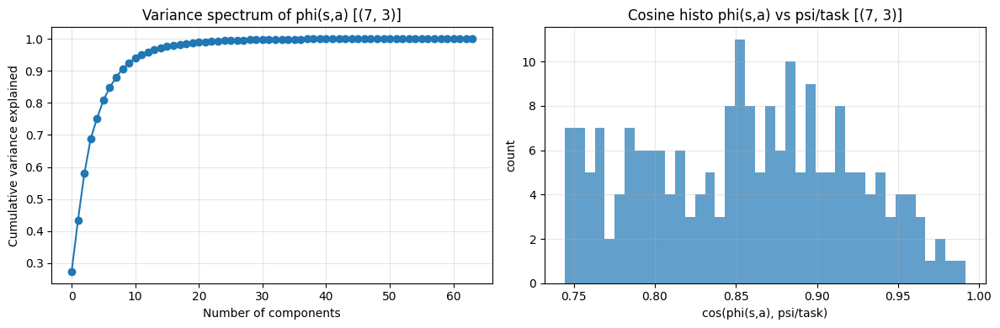


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10
  task_0      1.000      0.992      0.983      0.969      0.925      0.941      0.962      0.935      0.978      0.913      0.990
  task_1      0.992      1.000      0.986      0.983      0.938      0.956      0.970      0.939      0.984      0.925      0.992
  task_2      0.983      0.986      1.000      0.951      0.950      0.923      0.987      0.947      0.979      0.946      0.990
  task_3      0.969      0.983      0.951      1.000      0.928      0.986      0.948      0.904      0.975      0.893      0.961
  task_4      0.925      0.938      0.950      0.928      1.000      0.933      0.979      0.905      0.962      0.943      0.927
  task_5      0.941      0.956      0.923      0.986      0.933      1.000      0.940      0.878      0.970      0.876      0.927
  task_6      0.962      0.970      0.987      0.948    

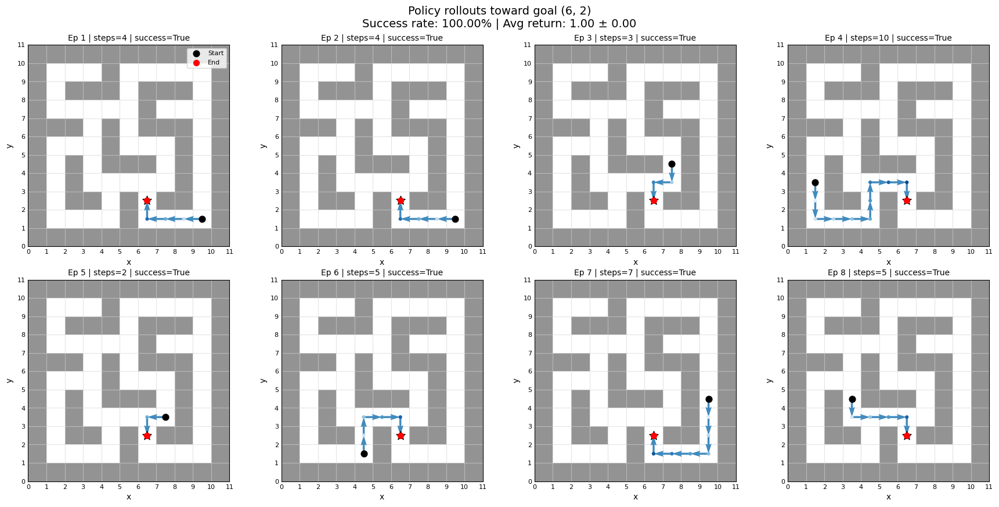

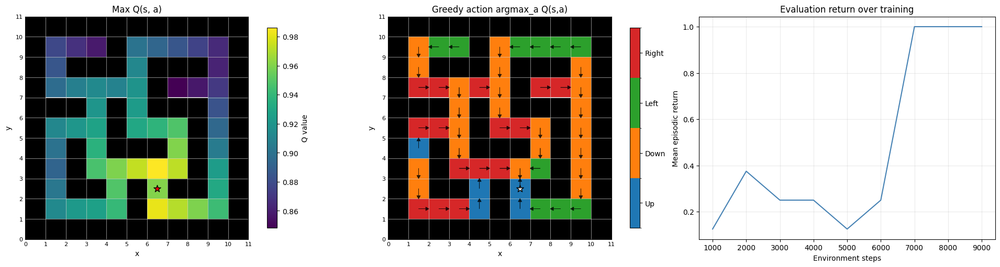

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.7547557 2.8011508 2.6360047 2.340505  1.7612181]
cumulative variance (first 5 dims): [0.28429365 0.44251925 0.58263797 0.6931025  0.7556529 ]
cos(phi(s,a), psi/task): mean=0.8593, std=0.0626


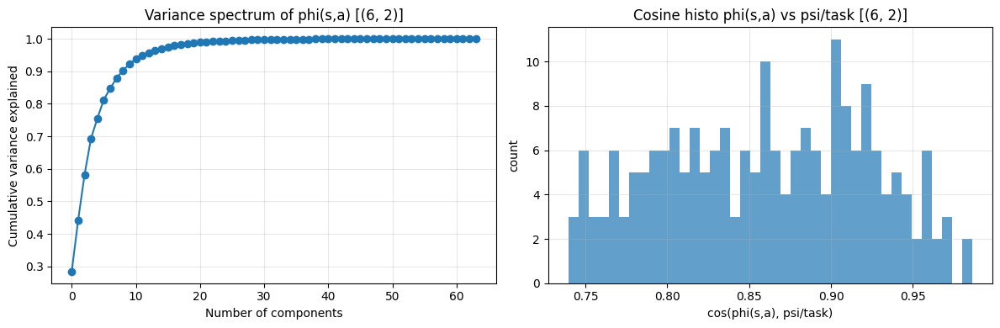


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10    task_11
  task_0      1.000      0.992      0.983      0.969      0.925      0.941      0.962      0.935      0.978      0.913      0.990      0.992
  task_1      0.992      1.000      0.986      0.983      0.938      0.956      0.970      0.939      0.984      0.925      0.992      0.994
  task_2      0.983      0.986      1.000      0.951      0.950      0.923      0.987      0.947      0.979      0.946      0.990      0.989
  task_3      0.969      0.983      0.951      1.000      0.928      0.986      0.948      0.904      0.975      0.893      0.961      0.969
  task_4      0.925      0.938      0.950      0.928      1.000      0.933      0.979      0.905      0.962      0.943      0.927      0.930
  task_5      0.941      0.956      0.923      0.986      0.933      1.000      0.940      0.878      0.970      0.876  

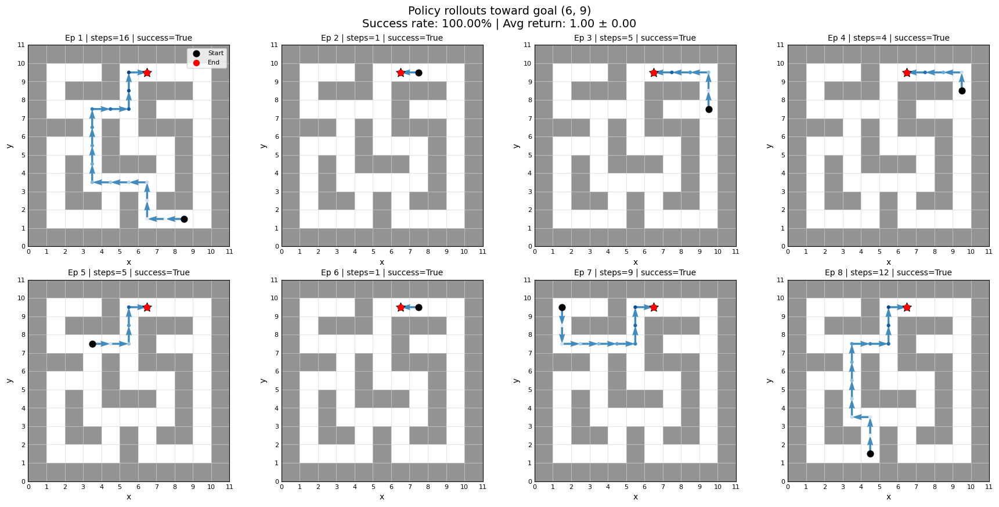

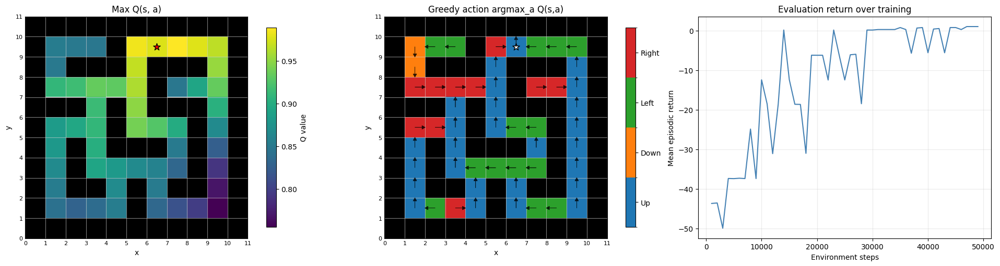

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.0665345 3.7113729 2.8190055 2.1005402 1.9443207]
cumulative variance (first 5 dims): [0.2541726  0.4658863  0.58803016 0.65584767 0.71395296]
cos(phi(s,a), psi/task): mean=0.8217, std=0.0780


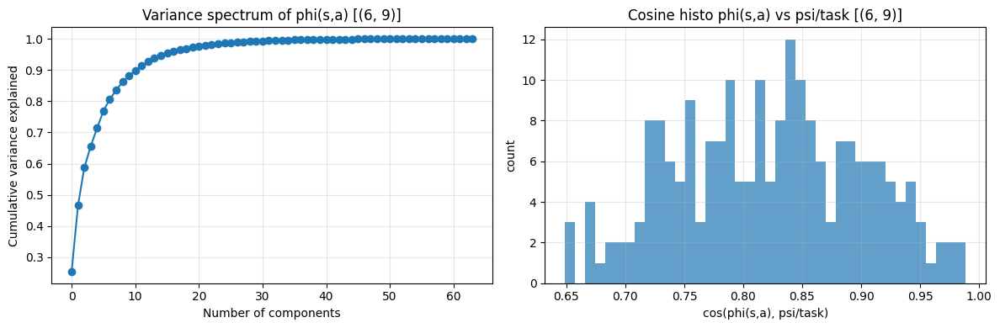


Goal embedding cosine similarity matrix:
     task_0
  task_0      1.000
Finished task_0 | seed=456 | goal=(6, 9) | steps=49000 | time=166.57s | anchor_sets=1

----- seed=456, task_idx=1, goal=(3, 6) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=-30.438 | eval_len=314.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=-17.938 | eval_len=191.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=-17.975 | eval_len=190.4 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=-30.525 | eval_len=315.1 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-12.225 | eval_len=375.9 | TD=9.7048e-04 | SA-stability=0.0000e+00 | projection=False dot=0.000e+00 g_new=3.678e-02 g_stable=0.000e+00
[DQN-factorised] step=   6000 | eps=0.886

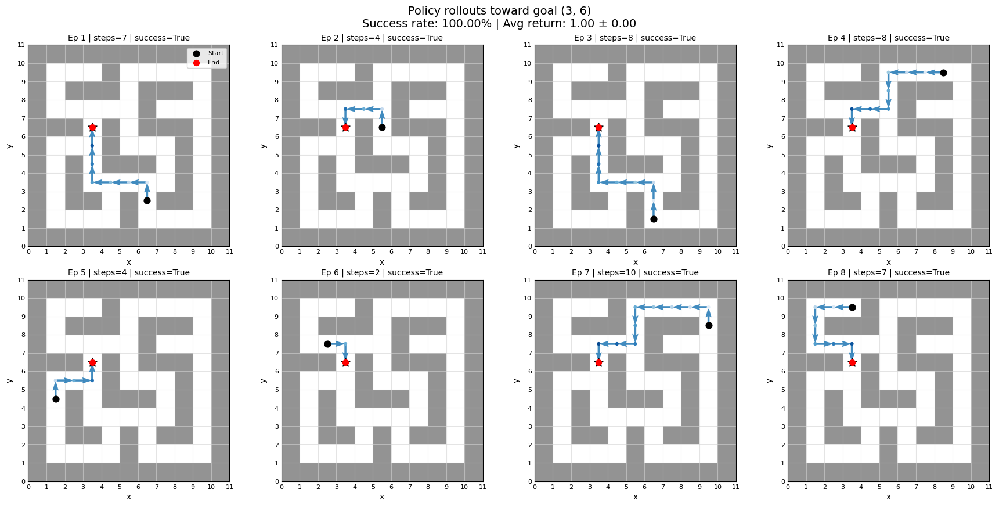

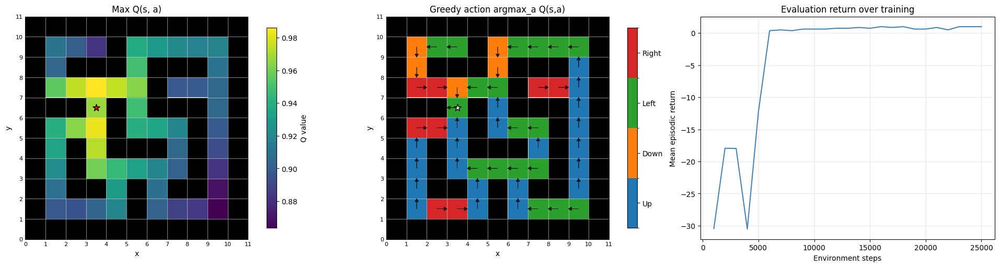

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.3991911 3.282363  2.2254522 1.9225166 1.6641755]
cumulative variance (first 5 dims): [0.23604399 0.4561414  0.5573176  0.6328237  0.68940073]
cos(phi(s,a), psi/task): mean=0.8673, std=0.0583


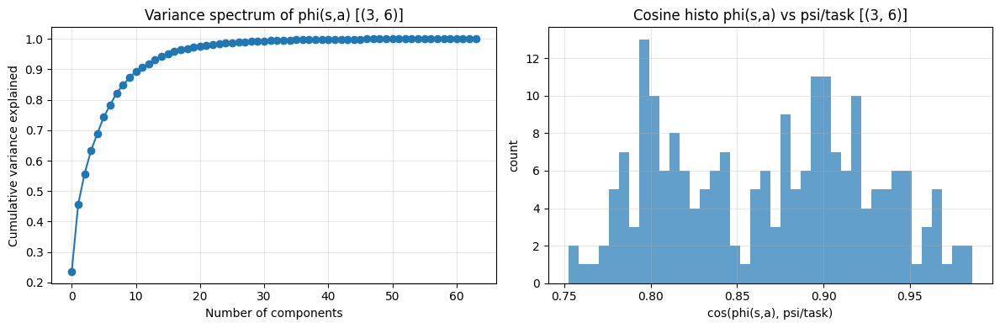


Goal embedding cosine similarity matrix:
     task_0     task_1
  task_0      1.000      0.993
  task_1      0.993      1.000

Off-diagonal mean similarity: 0.993
Off-diagonal min similarity: 0.993
Off-diagonal max similarity: 0.993
Finished task_1 | seed=456 | goal=(3, 6) | steps=25000 | time=60.18s | anchor_sets=2

----- seed=456, task_idx=2, goal=(4, 3) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=-43.113 | eval_len=438.1 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=-24.338 | eval_len=251.4 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=-36.800 | eval_len=376.4 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=-24.200 | eval_len=251.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-24.500 | eval_le

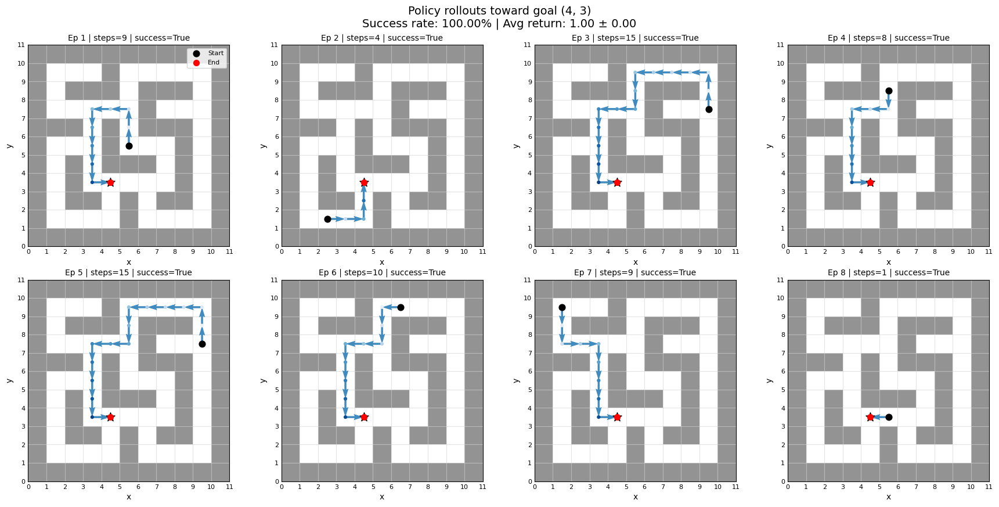

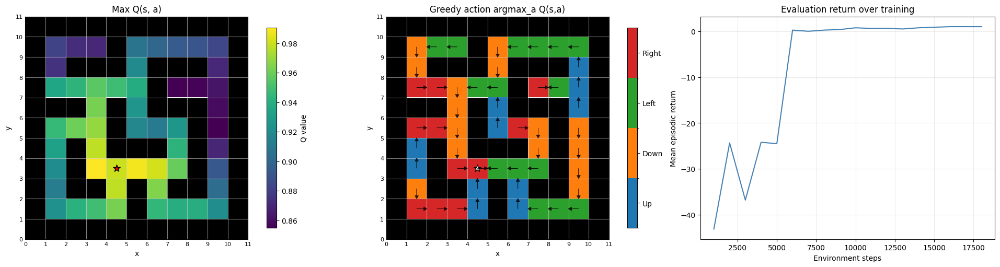

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.293986  3.2875898 2.1400576 1.9732779 1.76764  ]
cumulative variance (first 5 dims): [0.22365677 0.44644576 0.54084957 0.6211125  0.6855185 ]
cos(phi(s,a), psi/task): mean=0.8654, std=0.0631


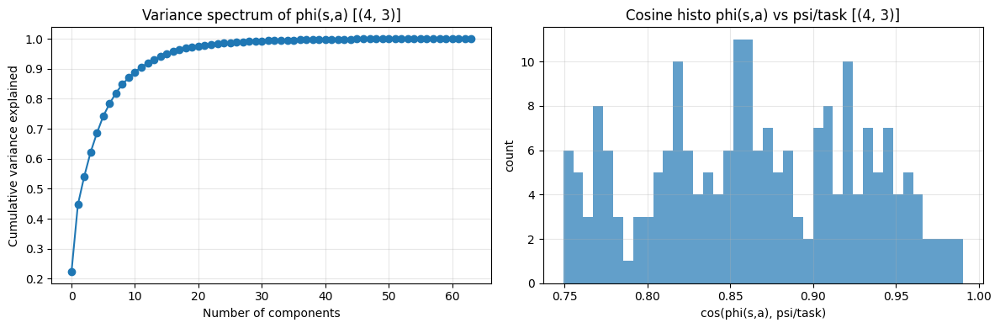


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2
  task_0      1.000      0.993      0.986
  task_1      0.993      1.000      0.992
  task_2      0.986      0.992      1.000

Off-diagonal mean similarity: 0.990
Off-diagonal min similarity: 0.986
Off-diagonal max similarity: 0.993
Finished task_2 | seed=456 | goal=(4, 3) | steps=18000 | time=47.02s | anchor_sets=3

----- seed=456, task_idx=3, goal=(1, 4) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.125 | eval_len=437.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.125 | eval_len=437.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-f

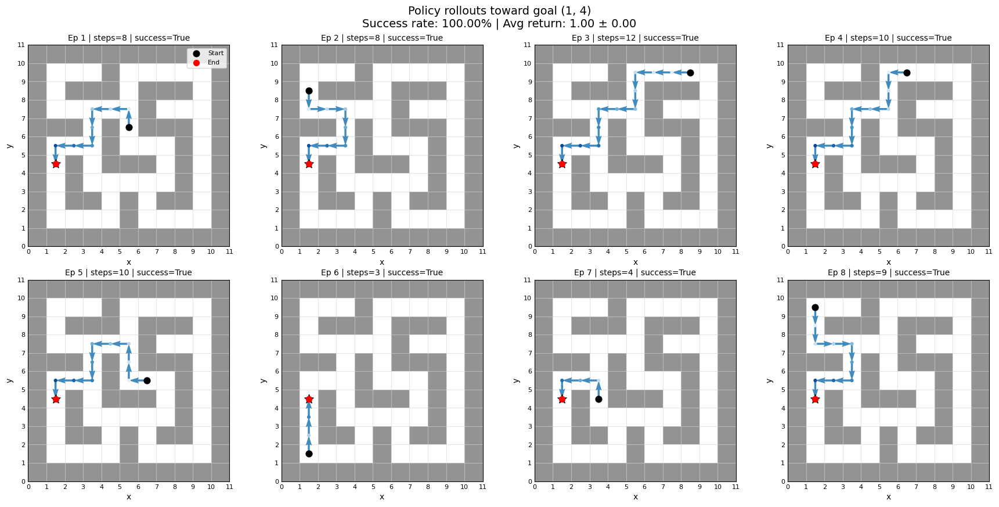

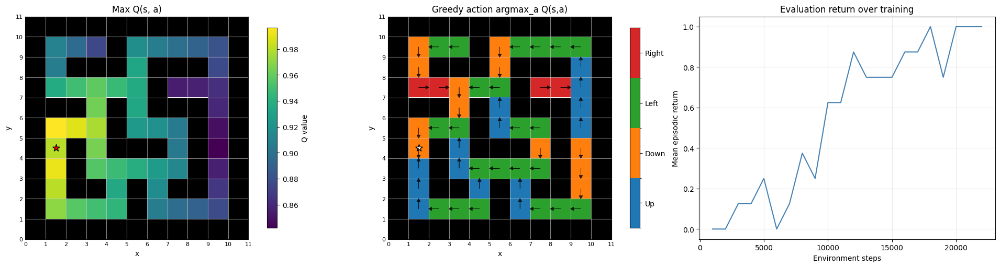

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.3464067 3.1798048 2.2700114 1.9825585 1.755905 ]
cumulative variance (first 5 dims): [0.23131251 0.4401664  0.5466047  0.6277931  0.691479  ]
cos(phi(s,a), psi/task): mean=0.8628, std=0.0662


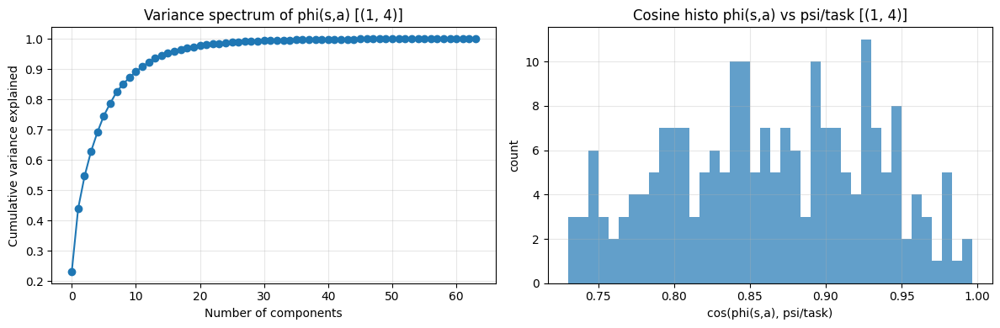


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3
  task_0      1.000      0.993      0.986      0.987
  task_1      0.993      1.000      0.992      0.994
  task_2      0.986      0.992      1.000      0.995
  task_3      0.987      0.994      0.995      1.000

Off-diagonal mean similarity: 0.991
Off-diagonal min similarity: 0.986
Off-diagonal max similarity: 0.995
Finished task_3 | seed=456 | goal=(1, 4) | steps=22000 | time=59.34s | anchor_sets=4

----- seed=456, task_idx=4, goal=(2, 1) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eva

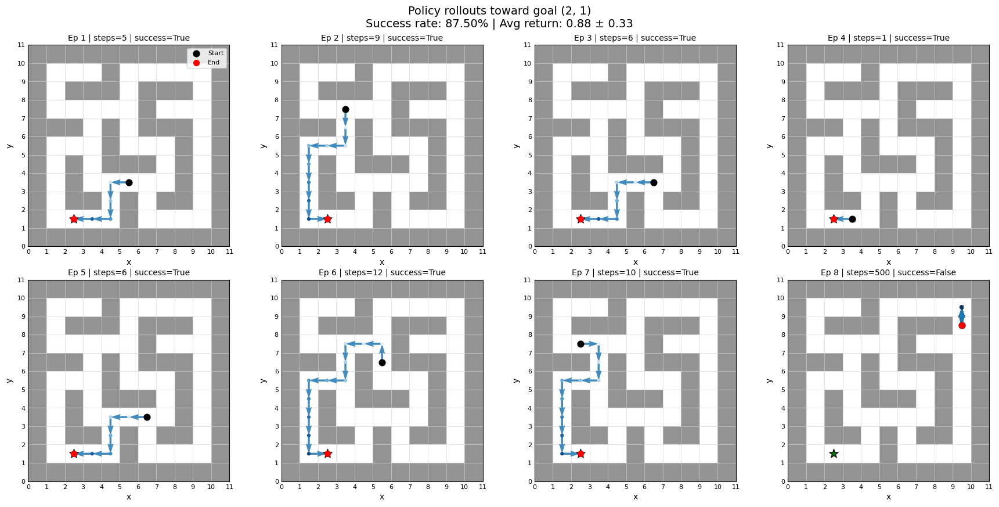

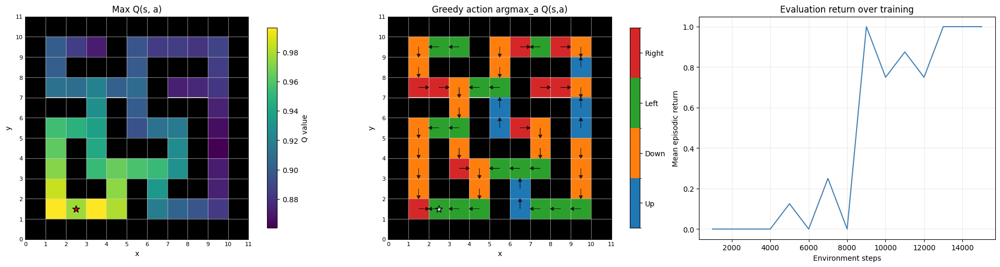

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.2715218 3.097428  2.180822  2.0039184 1.6738505]
cumulative variance (first 5 dims): [0.22946177 0.43515176 0.53711677 0.6232104  0.6832785 ]
cos(phi(s,a), psi/task): mean=0.8641, std=0.0604


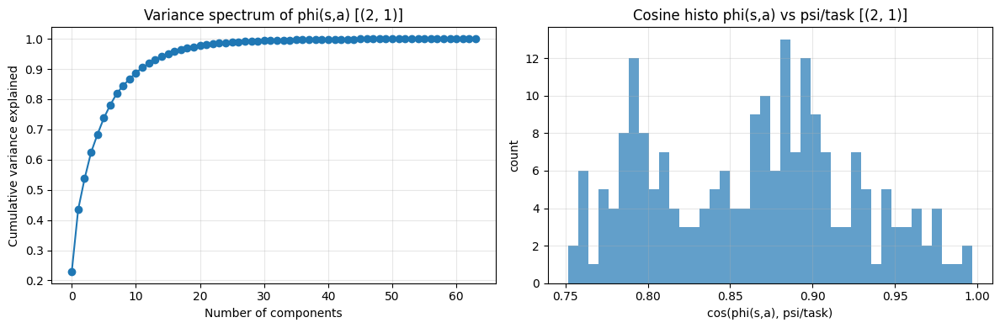


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4
  task_0      1.000      0.993      0.986      0.987      0.977
  task_1      0.993      1.000      0.992      0.994      0.982
  task_2      0.986      0.992      1.000      0.995      0.991
  task_3      0.987      0.994      0.995      1.000      0.990
  task_4      0.977      0.982      0.991      0.990      1.000

Off-diagonal mean similarity: 0.989
Off-diagonal min similarity: 0.977
Off-diagonal max similarity: 0.995
Finished task_4 | seed=456 | goal=(2, 1) | steps=15000 | time=50.35s | anchor_sets=5

----- seed=456, task_idx=5, goal=(4, 1) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.250 | eval_len=376.2 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.250 | eval_len=377.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.625 | ev

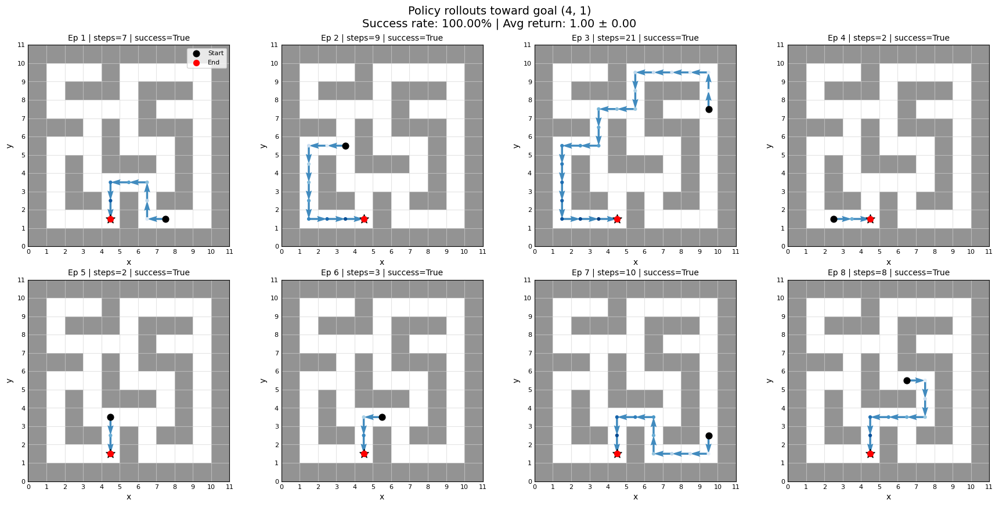

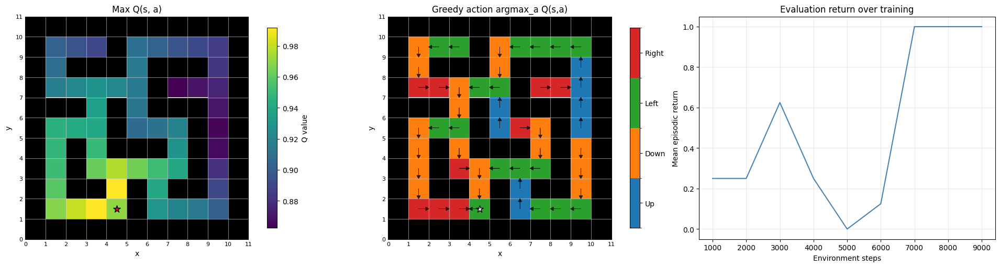

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.29229   3.2123258 2.1841614 1.9405015 1.762106 ]
cumulative variance (first 5 dims): [0.2254836  0.44014698 0.53938735 0.6177207  0.6823133 ]
cos(phi(s,a), psi/task): mean=0.8665, std=0.0611


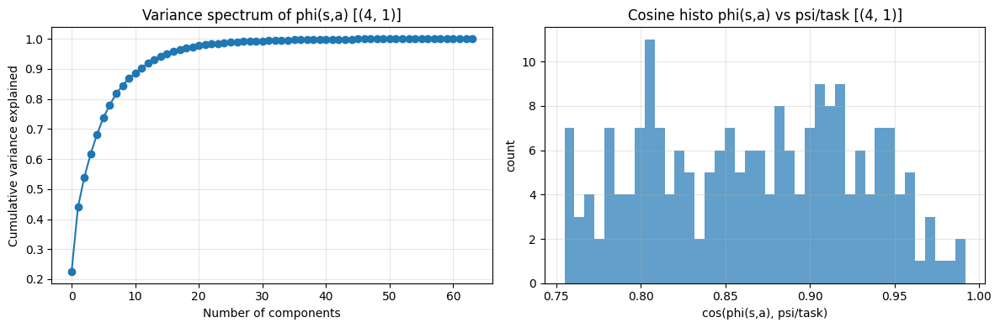


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5
  task_0      1.000      0.993      0.986      0.987      0.977      0.983
  task_1      0.993      1.000      0.992      0.994      0.982      0.988
  task_2      0.986      0.992      1.000      0.995      0.991      0.994
  task_3      0.987      0.994      0.995      1.000      0.990      0.990
  task_4      0.977      0.982      0.991      0.990      1.000      0.998
  task_5      0.983      0.988      0.994      0.990      0.998      1.000

Off-diagonal mean similarity: 0.989
Off-diagonal min similarity: 0.977
Off-diagonal max similarity: 0.998
Finished task_5 | seed=456 | goal=(4, 1) | steps=9000 | time=20.20s | anchor_sets=6

----- seed=456, task_idx=6, goal=(3, 4) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | 

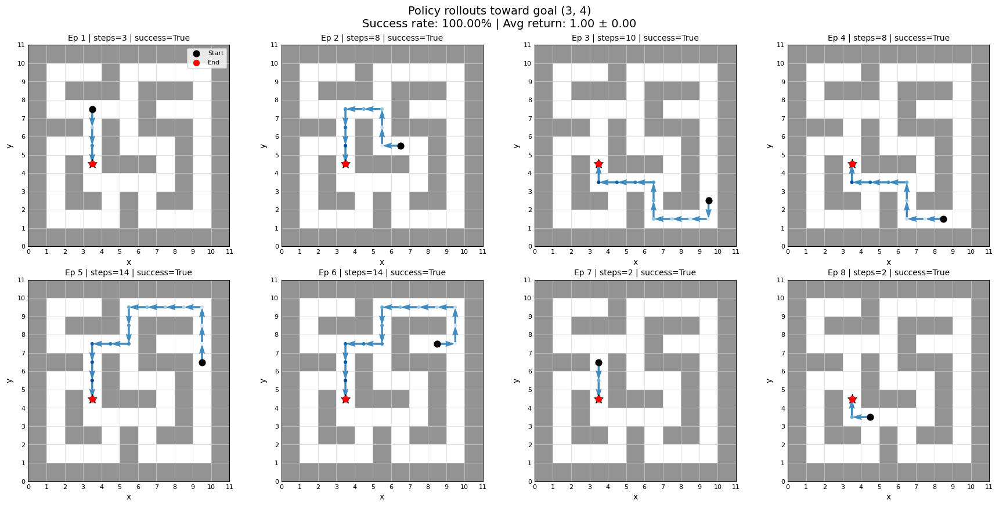

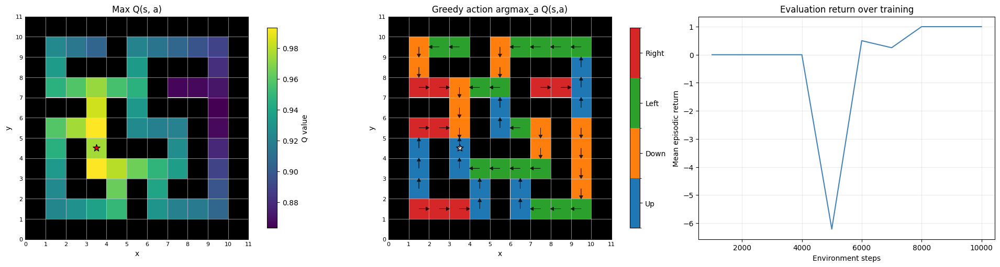

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.248263  3.1253147 2.2357006 1.9484897 1.7885628]
cumulative variance (first 5 dims): [0.22503237 0.433352   0.53995514 0.6209279  0.689154  ]
cos(phi(s,a), psi/task): mean=0.8726, std=0.0602


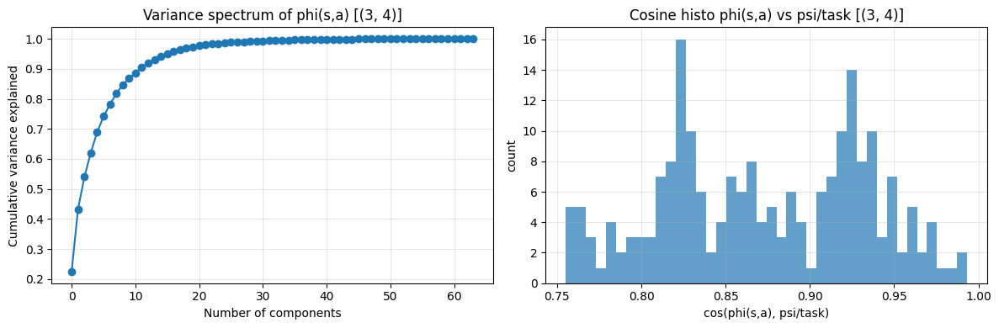


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6
  task_0      1.000      0.993      0.986      0.987      0.977      0.983      0.991
  task_1      0.993      1.000      0.992      0.994      0.982      0.988      0.997
  task_2      0.986      0.992      1.000      0.995      0.991      0.994      0.996
  task_3      0.987      0.994      0.995      1.000      0.990      0.990      0.993
  task_4      0.977      0.982      0.991      0.990      1.000      0.998      0.985
  task_5      0.983      0.988      0.994      0.990      0.998      1.000      0.991
  task_6      0.991      0.997      0.996      0.993      0.985      0.991      1.000

Off-diagonal mean similarity: 0.990
Off-diagonal min similarity: 0.977
Off-diagonal max similarity: 0.998
Finished task_6 | seed=456 | goal=(3, 4) | steps=10000 | time=26.83s | anchor_sets=7

----- seed=456, task_idx=7, goal=(7, 1) -----

[DQN-factorised] step=   1000 | eps=0.

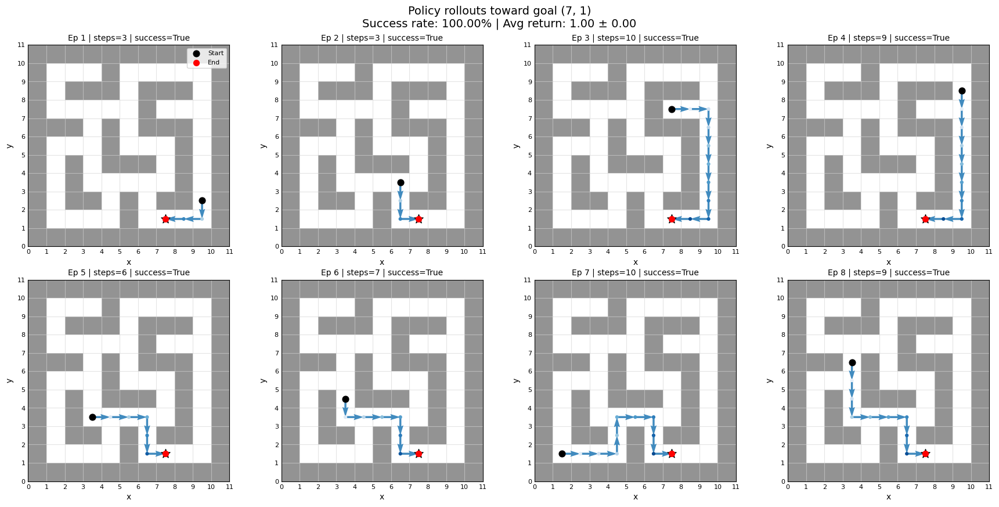

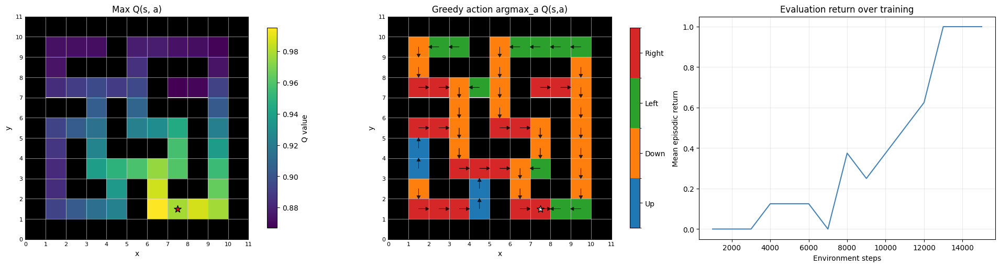

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.200897  3.0928347 2.434554  1.9703987 1.6749625]
cumulative variance (first 5 dims): [0.21405216 0.41389546 0.53772235 0.6188342  0.6774462 ]
cos(phi(s,a), psi/task): mean=0.8570, std=0.0625


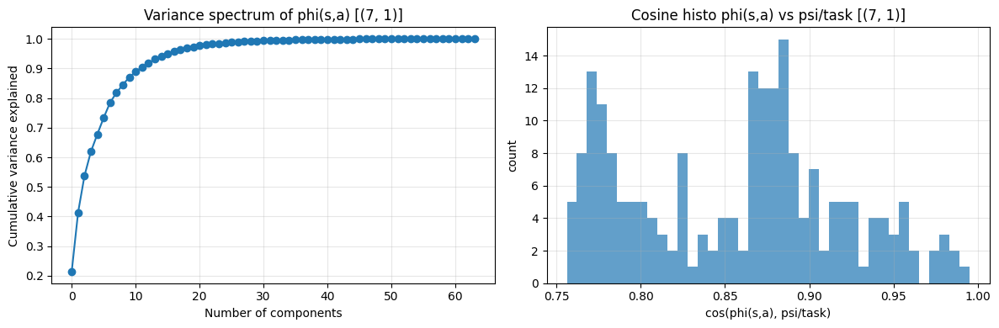


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7
  task_0      1.000      0.993      0.986      0.987      0.977      0.983      0.991      0.962
  task_1      0.993      1.000      0.992      0.994      0.982      0.988      0.997      0.970
  task_2      0.986      0.992      1.000      0.995      0.991      0.994      0.996      0.969
  task_3      0.987      0.994      0.995      1.000      0.990      0.990      0.993      0.963
  task_4      0.977      0.982      0.991      0.990      1.000      0.998      0.985      0.971
  task_5      0.983      0.988      0.994      0.990      0.998      1.000      0.991      0.977
  task_6      0.991      0.997      0.996      0.993      0.985      0.991      1.000      0.970
  task_7      0.962      0.970      0.969      0.963      0.971      0.977      0.970      1.000

Off-diagonal mean similarity: 0.985
Off-diagonal min similarity: 0.962
Off-diagonal max simi

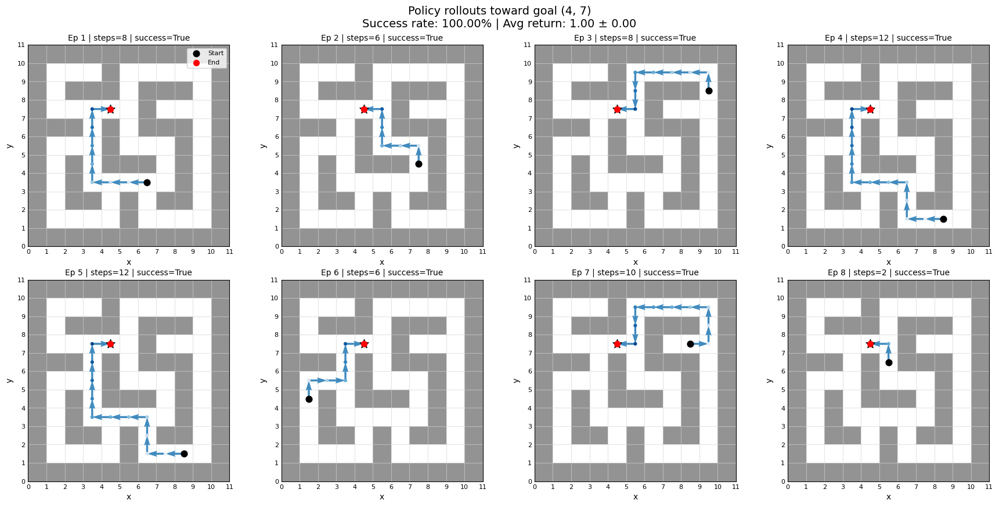

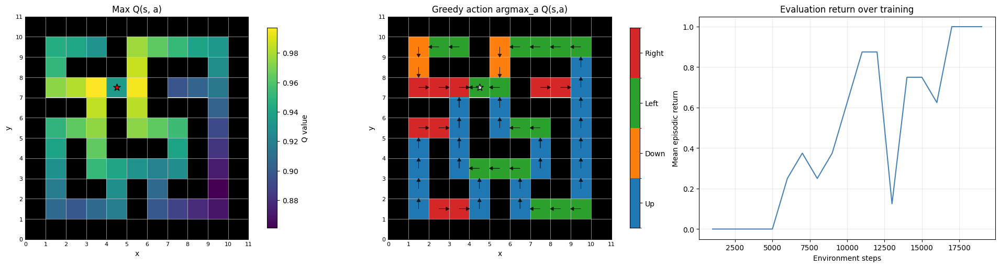

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.4100282 2.9347165 2.2523134 1.944569  1.5624524]
cumulative variance (first 5 dims): [0.25616857 0.44590127 0.5576564  0.64095867 0.694739  ]
cos(phi(s,a), psi/task): mean=0.8767, std=0.0617


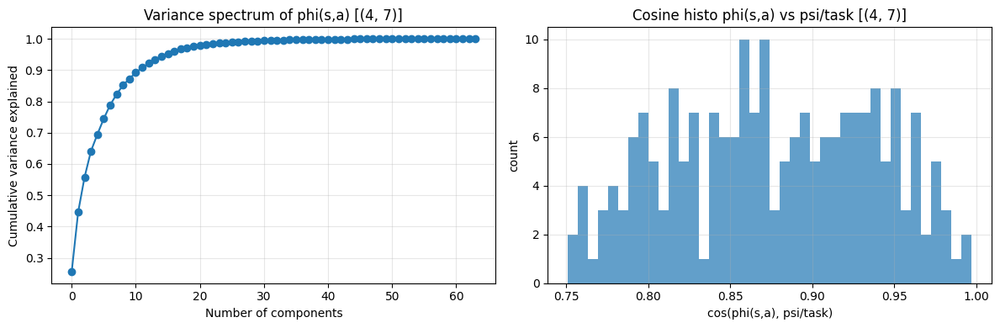


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8
  task_0      1.000      0.993      0.986      0.987      0.977      0.983      0.991      0.962      0.994
  task_1      0.993      1.000      0.992      0.994      0.982      0.988      0.997      0.970      0.997
  task_2      0.986      0.992      1.000      0.995      0.991      0.994      0.996      0.969      0.984
  task_3      0.987      0.994      0.995      1.000      0.990      0.990      0.993      0.963      0.987
  task_4      0.977      0.982      0.991      0.990      1.000      0.998      0.985      0.971      0.971
  task_5      0.983      0.988      0.994      0.990      0.998      1.000      0.991      0.977      0.980
  task_6      0.991      0.997      0.996      0.993      0.985      0.991      1.000      0.970      0.994
  task_7      0.962      0.970      0.969      0.963      0.971      0.977      0.970      1.000      

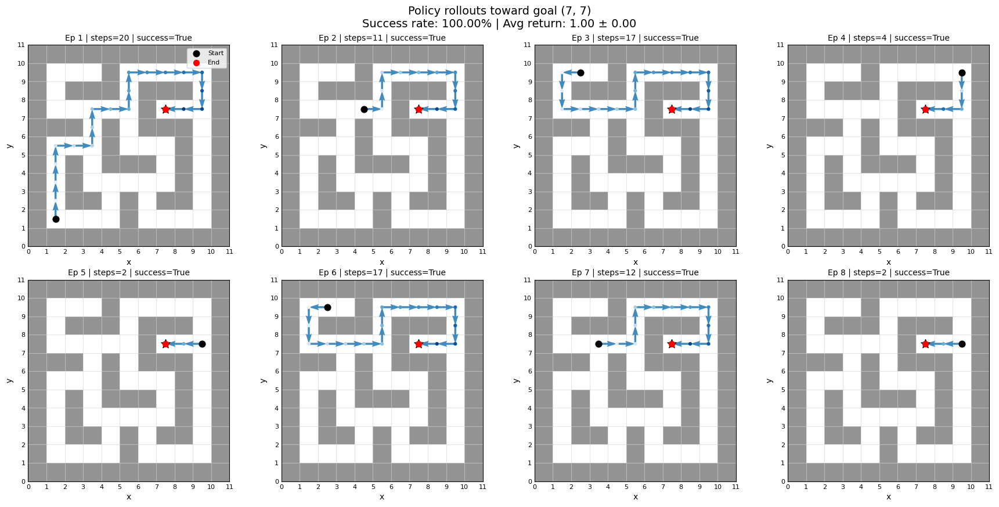

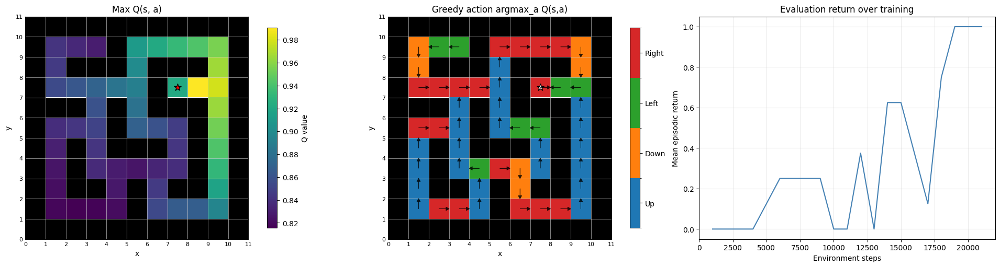

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.2366006 3.0929556 2.3943973 2.0858555 1.8647676]
cumulative variance (first 5 dims): [0.21116231 0.40399718 0.5195633  0.60726476 0.6773598 ]
cos(phi(s,a), psi/task): mean=0.8183, std=0.0678


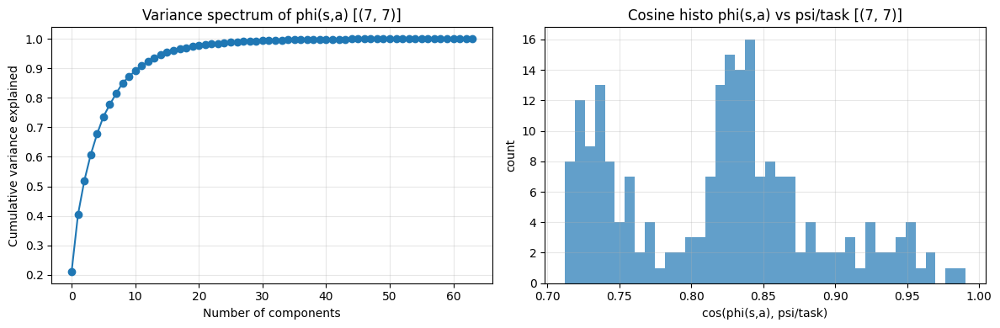


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9
  task_0      1.000      0.993      0.986      0.987      0.977      0.983      0.991      0.962      0.994      0.927
  task_1      0.993      1.000      0.992      0.994      0.982      0.988      0.997      0.970      0.997      0.921
  task_2      0.986      0.992      1.000      0.995      0.991      0.994      0.996      0.969      0.984      0.897
  task_3      0.987      0.994      0.995      1.000      0.990      0.990      0.993      0.963      0.987      0.900
  task_4      0.977      0.982      0.991      0.990      1.000      0.998      0.985      0.971      0.971      0.907
  task_5      0.983      0.988      0.994      0.990      0.998      1.000      0.991      0.977      0.980      0.911
  task_6      0.991      0.997      0.996      0.993      0.985      0.991      1.000      0.970      0.994      0.906
  task_7      

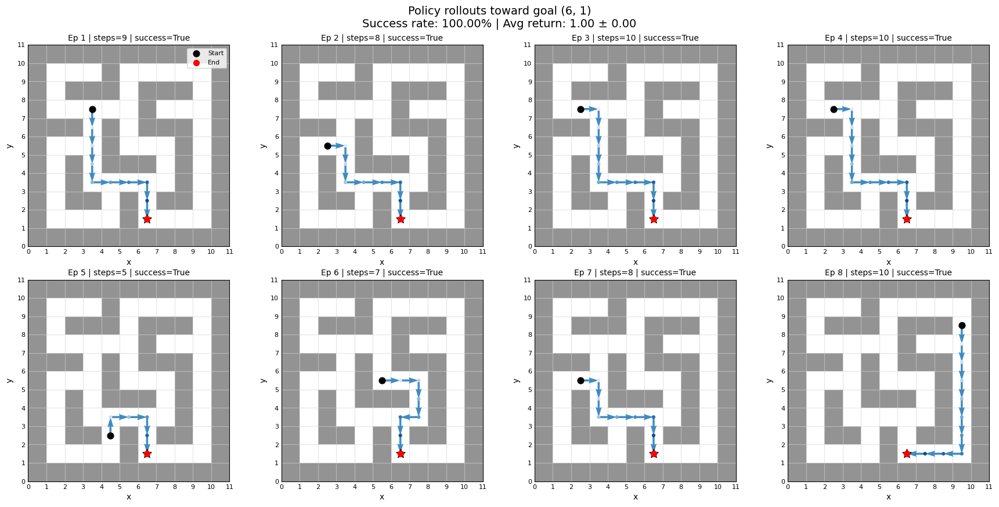

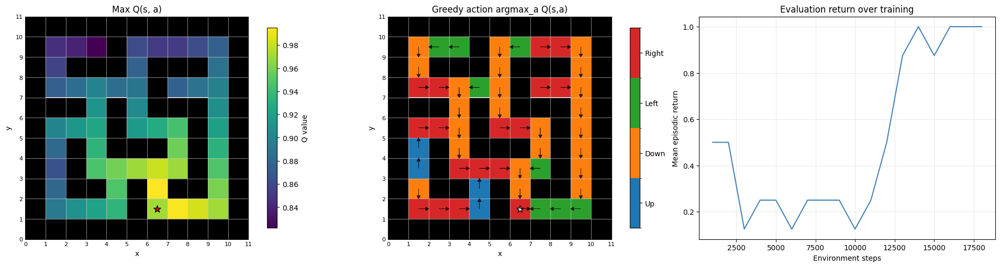

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.1900024 3.0672812 2.3921344 1.9272859 1.7995608]
cumulative variance (first 5 dims): [0.21535115 0.41445166 0.53554946 0.61415577 0.68268853]
cos(phi(s,a), psi/task): mean=0.8531, std=0.0669


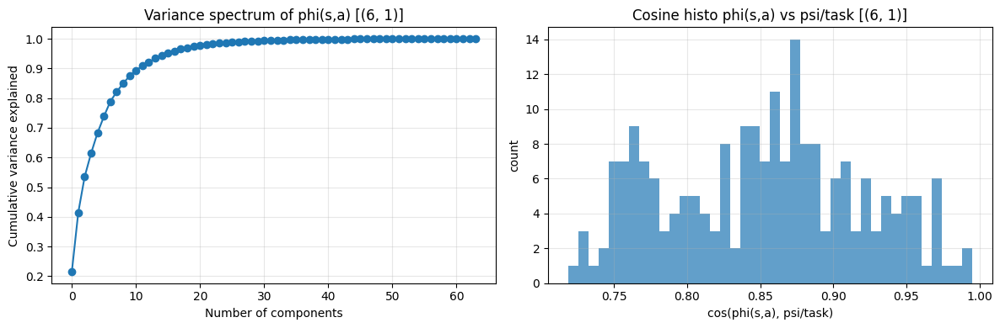


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10
  task_0      1.000      0.993      0.986      0.987      0.977      0.983      0.991      0.962      0.994      0.927      0.955
  task_1      0.993      1.000      0.992      0.994      0.982      0.988      0.997      0.970      0.997      0.921      0.963
  task_2      0.986      0.992      1.000      0.995      0.991      0.994      0.996      0.969      0.984      0.897      0.965
  task_3      0.987      0.994      0.995      1.000      0.990      0.990      0.993      0.963      0.987      0.900      0.957
  task_4      0.977      0.982      0.991      0.990      1.000      0.998      0.985      0.971      0.971      0.907      0.969
  task_5      0.983      0.988      0.994      0.990      0.998      1.000      0.991      0.977      0.980      0.911      0.974
  task_6      0.991      0.997      0.996      0.993    

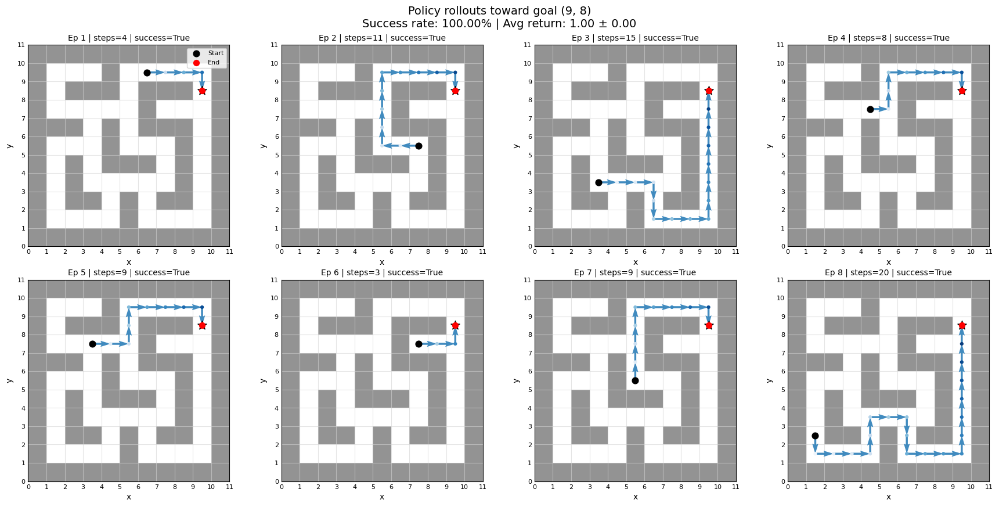

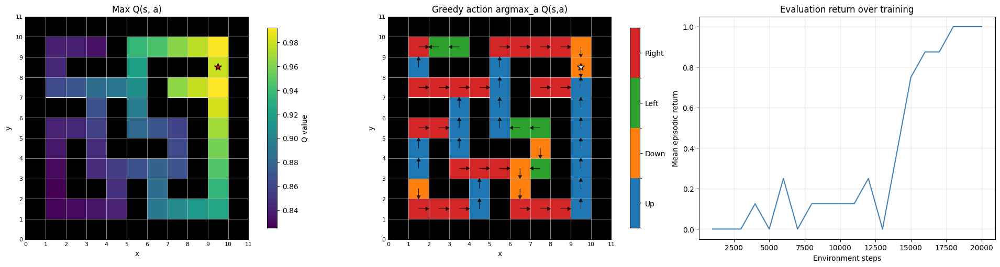

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.2150514 3.190161  2.4514658 2.1110938 1.7528256]
cumulative variance (first 5 dims): [0.20765054 0.41209835 0.5328266  0.62235737 0.68407863]
cos(phi(s,a), psi/task): mean=0.8349, std=0.0703


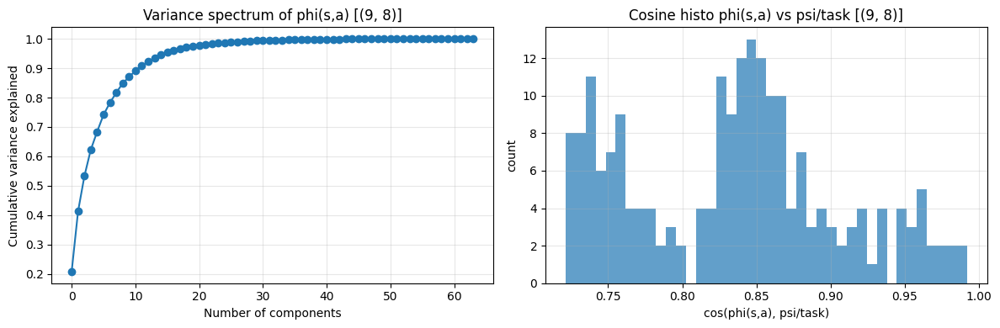


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10    task_11
  task_0      1.000      0.993      0.986      0.987      0.977      0.983      0.991      0.962      0.994      0.927      0.955      0.938
  task_1      0.993      1.000      0.992      0.994      0.982      0.988      0.997      0.970      0.997      0.921      0.963      0.938
  task_2      0.986      0.992      1.000      0.995      0.991      0.994      0.996      0.969      0.984      0.897      0.965      0.921
  task_3      0.987      0.994      0.995      1.000      0.990      0.990      0.993      0.963      0.987      0.900      0.957      0.923
  task_4      0.977      0.982      0.991      0.990      1.000      0.998      0.985      0.971      0.971      0.907      0.969      0.930
  task_5      0.983      0.988      0.994      0.990      0.998      1.000      0.991      0.977      0.980      0.911  

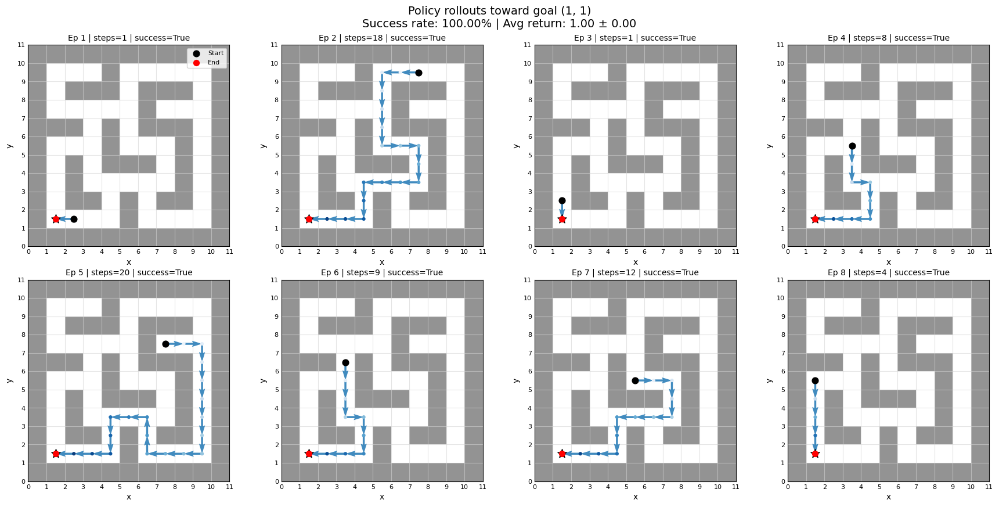

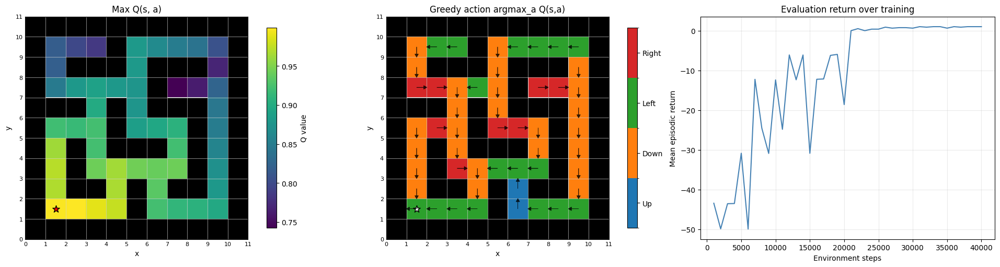

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.8567865 3.0273995 2.6494167 2.3980596 2.2581449]
cumulative variance (first 5 dims): [0.25689372 0.41517946 0.5364074  0.6357241  0.72378963]
cos(phi(s,a), psi/task): mean=0.8348, std=0.0773


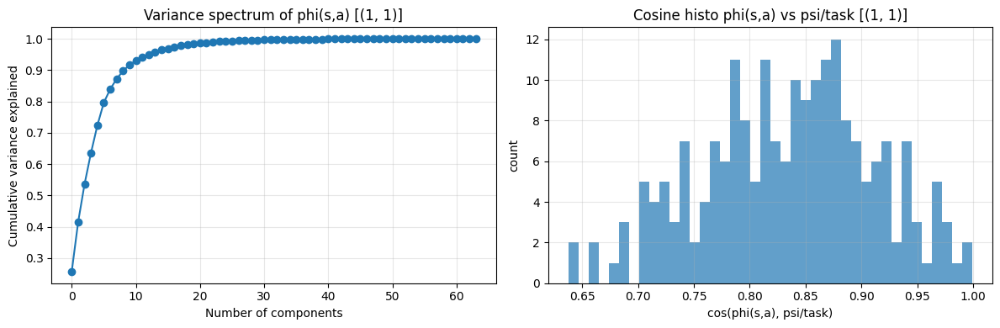


Goal embedding cosine similarity matrix:
     task_0
  task_0      1.000
Finished task_0 | seed=789 | goal=(1, 1) | steps=40000 | time=114.03s | anchor_sets=1

----- seed=789, task_idx=1, goal=(1, 2) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=-48.613 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=-42.463 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=-36.413 | eval_len=375.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=-48.775 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-24.288 | eval_len=375.2 | TD=4.3503e-04 | SA-stability=0.0000e+00 | projection=False dot=0.000e+00 g_new=7.339e-02 g_stable=0.000e+00
[DQN-factorised] step=   6000 | eps=0.886

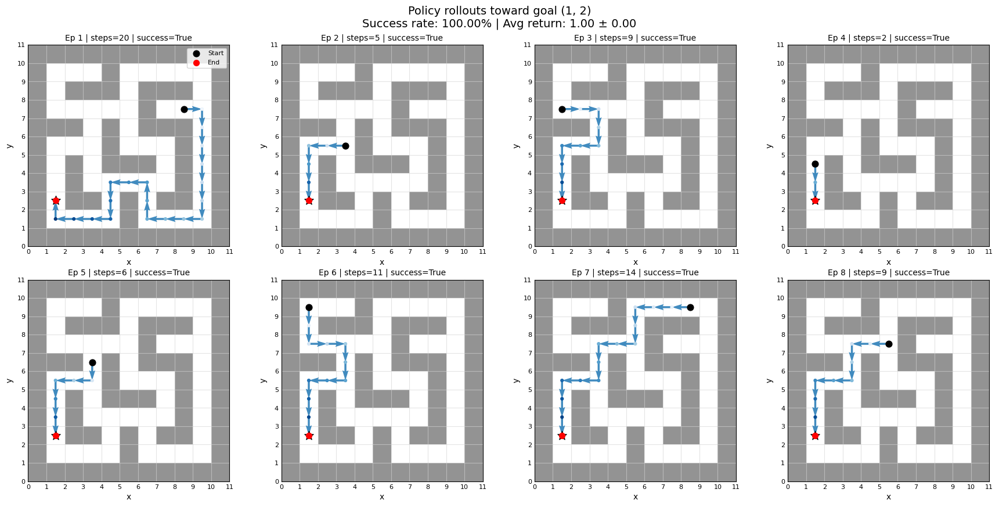

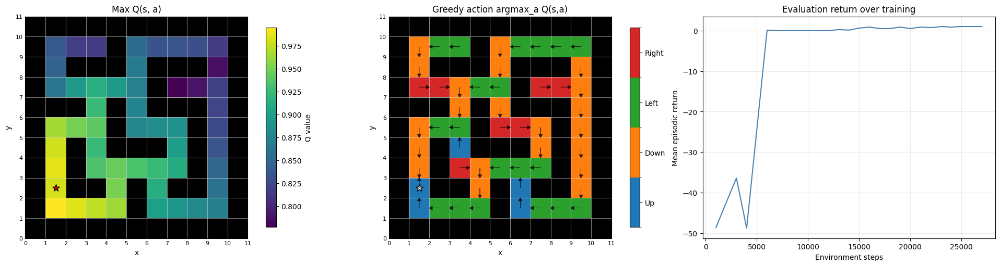

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.6018596 3.0472062 2.687665  2.5277135 2.3287632]
cumulative variance (first 5 dims): [0.22038499 0.37812147 0.5008311  0.6093697  0.70149505]
cos(phi(s,a), psi/task): mean=0.8307, std=0.0771


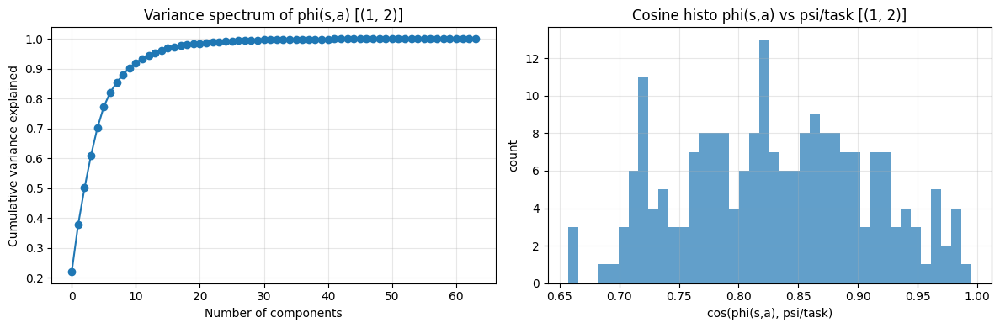


Goal embedding cosine similarity matrix:
     task_0     task_1
  task_0      1.000      0.990
  task_1      0.990      1.000

Off-diagonal mean similarity: 0.990
Off-diagonal min similarity: 0.990
Off-diagonal max similarity: 0.990
Finished task_1 | seed=789 | goal=(1, 2) | steps=27000 | time=86.61s | anchor_sets=2

----- seed=789, task_idx=2, goal=(4, 1) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.375 | eval_len=315.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.500 | eval_len=255.5 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.625 | eval_len=196.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.500 | eval_len=252.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-6.200 | eval_len=500.0 |

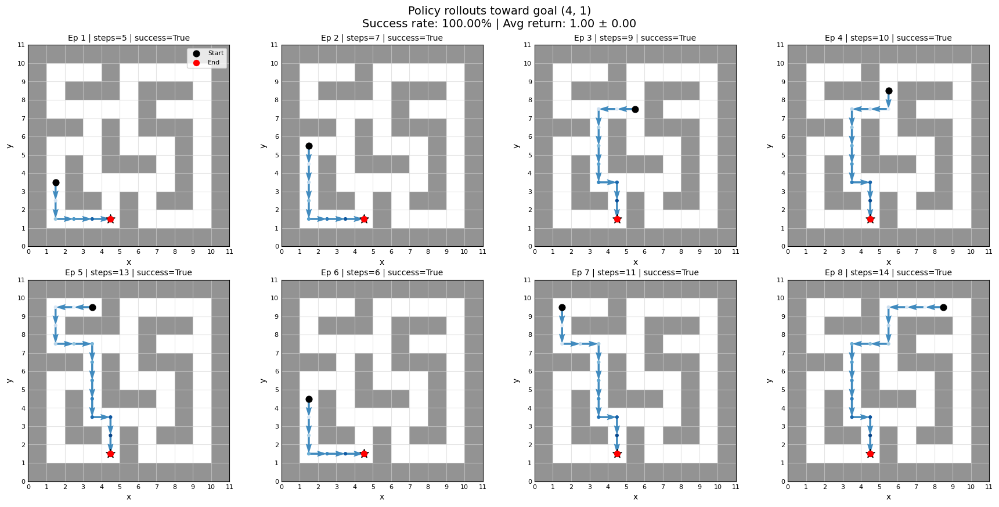

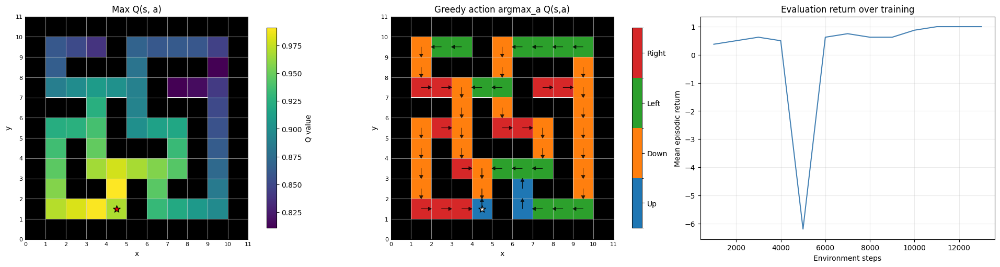

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.2591398 3.0980666 2.7812364 2.3534272 2.1754322]
cumulative variance (first 5 dims): [0.19045745 0.36255452 0.50125176 0.60056186 0.68541795]
cos(phi(s,a), psi/task): mean=0.8475, std=0.0701


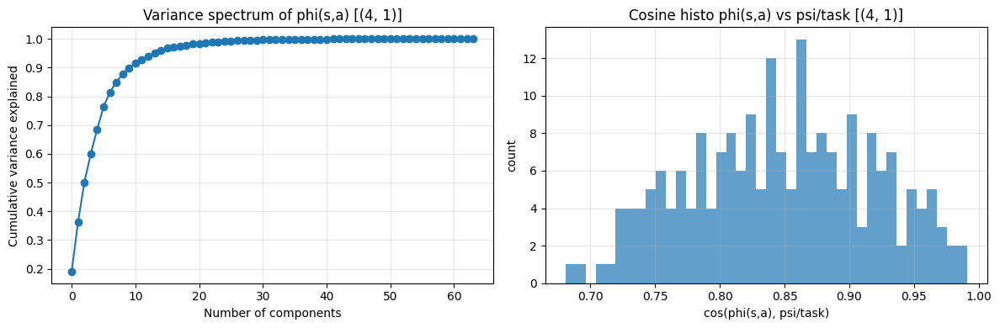


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2
  task_0      1.000      0.990      0.995
  task_1      0.990      1.000      0.994
  task_2      0.995      0.994      1.000

Off-diagonal mean similarity: 0.993
Off-diagonal min similarity: 0.990
Off-diagonal max similarity: 0.995
Finished task_2 | seed=789 | goal=(4, 1) | steps=13000 | time=28.07s | anchor_sets=3

----- seed=789, task_idx=3, goal=(9, 6) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=437.9 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-f

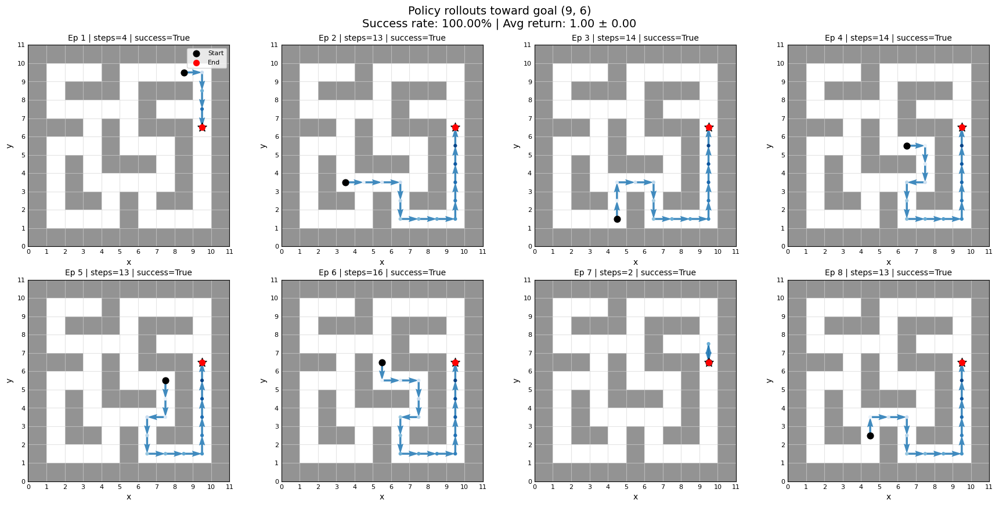

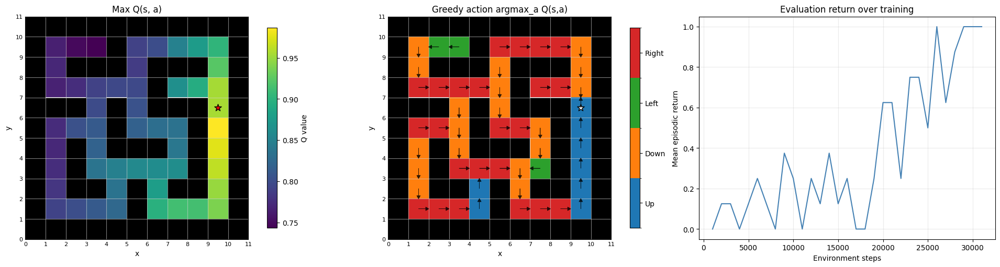

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.4689608 3.0864623 2.8415265 2.4620497 2.3449004]
cumulative variance (first 5 dims): [0.19944954 0.3573401  0.49116522 0.59163326 0.6827678 ]
cos(phi(s,a), psi/task): mean=0.7834, std=0.0786


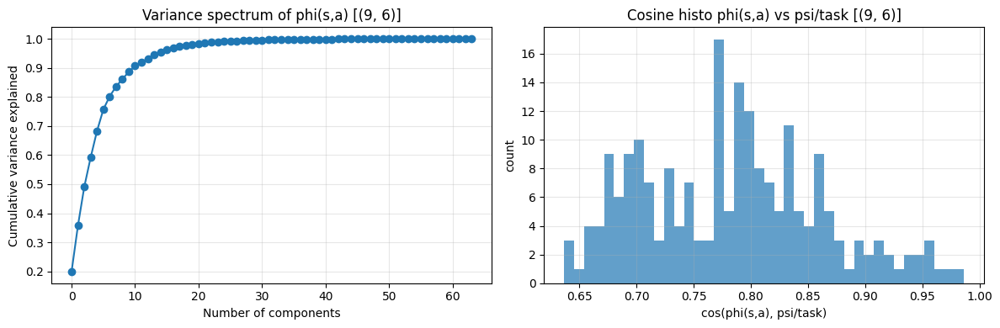


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3
  task_0      1.000      0.990      0.995      0.898
  task_1      0.990      1.000      0.994      0.901
  task_2      0.995      0.994      1.000      0.905
  task_3      0.898      0.901      0.905      1.000

Off-diagonal mean similarity: 0.947
Off-diagonal min similarity: 0.898
Off-diagonal max similarity: 0.995
Finished task_3 | seed=789 | goal=(9, 6) | steps=31000 | time=105.26s | anchor_sets=4

----- seed=789, task_idx=4, goal=(3, 1) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=438.1 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=437.9 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | ev

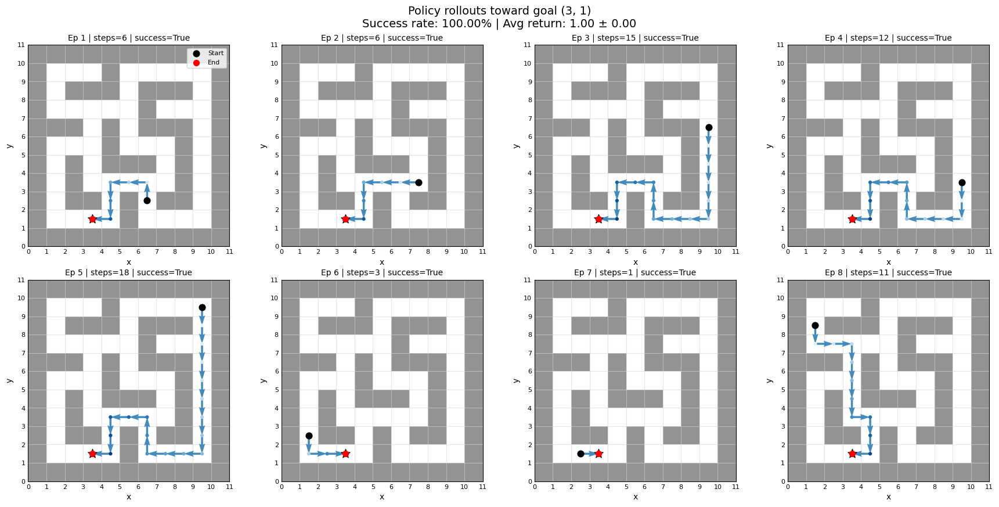

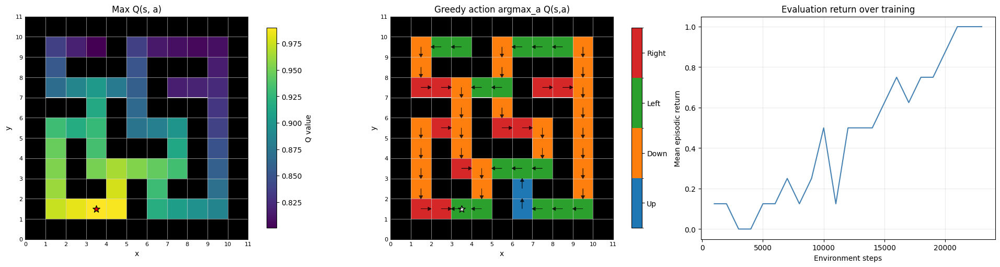

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.4637194 3.1144538 2.7634752 2.5818155 2.2682602]
cumulative variance (first 5 dims): [0.20433964 0.3695476  0.499618   0.6131498  0.70077986]
cos(phi(s,a), psi/task): mean=0.8312, std=0.0764


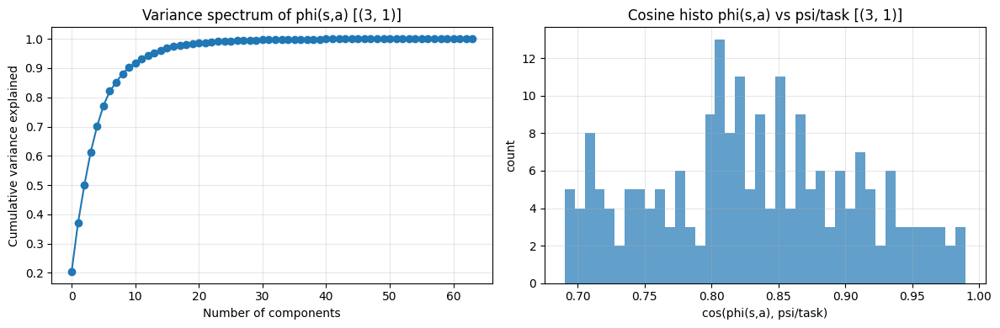


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4
  task_0      1.000      0.990      0.995      0.898      0.992
  task_1      0.990      1.000      0.994      0.901      0.991
  task_2      0.995      0.994      1.000      0.905      0.995
  task_3      0.898      0.901      0.905      1.000      0.897
  task_4      0.992      0.991      0.995      0.897      1.000

Off-diagonal mean similarity: 0.956
Off-diagonal min similarity: 0.897
Off-diagonal max similarity: 0.995
Finished task_4 | seed=789 | goal=(3, 1) | steps=23000 | time=70.10s | anchor_sets=5

----- seed=789, task_idx=5, goal=(5, 6) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=437.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.375 | ev

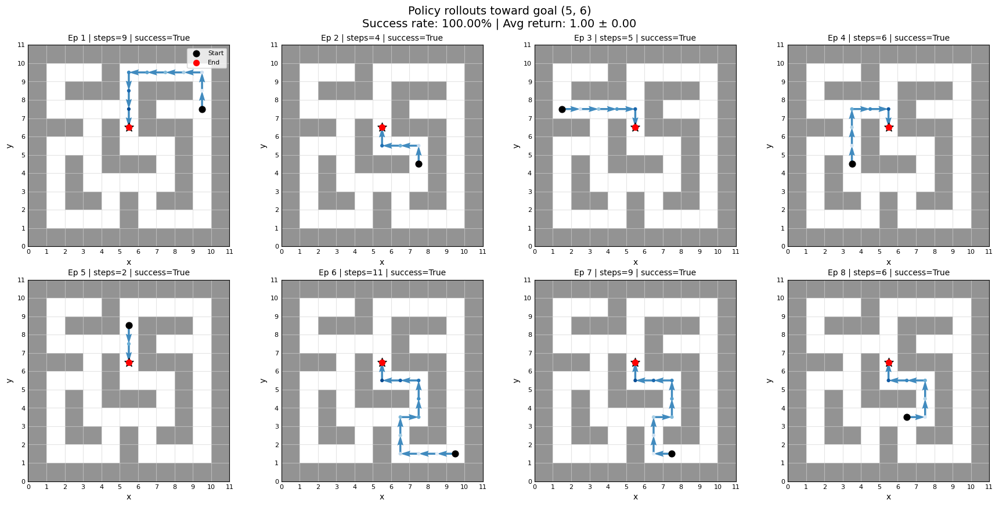

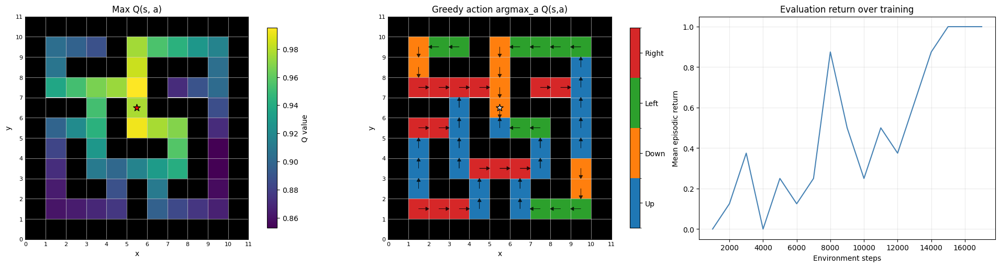

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.2881212 3.021345  2.911754  2.2159991 2.1833885]
cumulative variance (first 5 dims): [0.2017113  0.37201935 0.53019655 0.62181306 0.71075296]
cos(phi(s,a), psi/task): mean=0.8547, std=0.0652


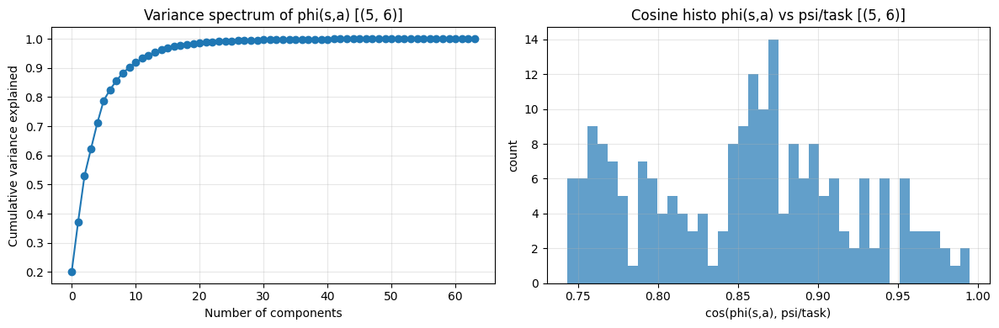


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5
  task_0      1.000      0.990      0.995      0.898      0.992      0.963
  task_1      0.990      1.000      0.994      0.901      0.991      0.964
  task_2      0.995      0.994      1.000      0.905      0.995      0.971
  task_3      0.898      0.901      0.905      1.000      0.897      0.921
  task_4      0.992      0.991      0.995      0.897      1.000      0.954
  task_5      0.963      0.964      0.971      0.921      0.954      1.000

Off-diagonal mean similarity: 0.955
Off-diagonal min similarity: 0.897
Off-diagonal max similarity: 0.995
Finished task_5 | seed=789 | goal=(5, 6) | steps=17000 | time=48.09s | anchor_sets=6

----- seed=789, task_idx=6, goal=(9, 5) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 |

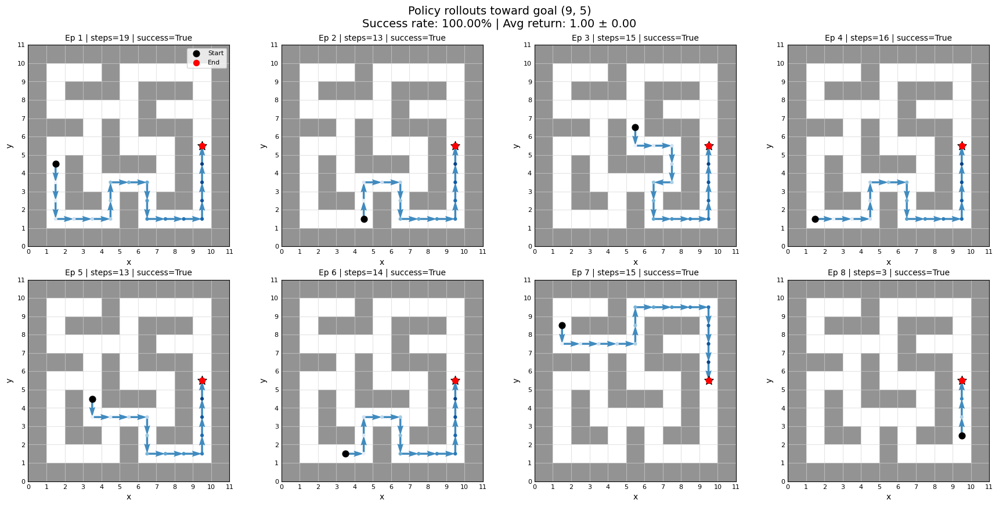

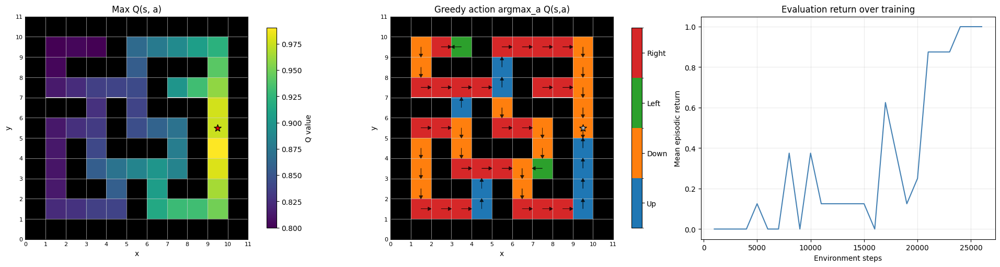

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.1931963 3.0062847 2.7635887 2.3072314 2.1695116]
cumulative variance (first 5 dims): [0.18706389 0.3528694  0.49298468 0.5906457  0.67699575]
cos(phi(s,a), psi/task): mean=0.8160, std=0.0717


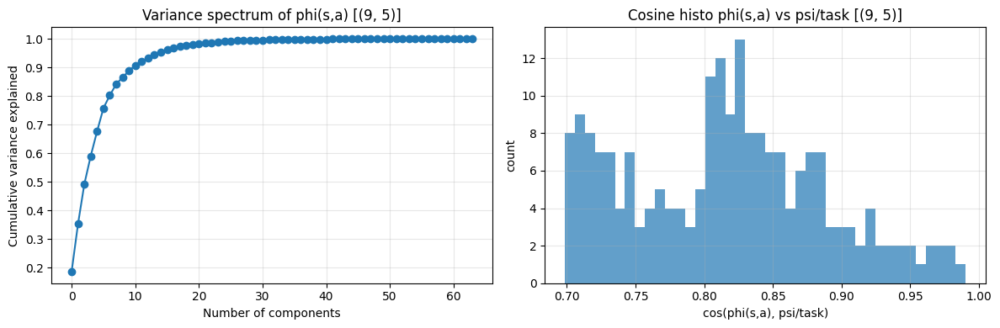


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6
  task_0      1.000      0.990      0.995      0.898      0.992      0.963      0.921
  task_1      0.990      1.000      0.994      0.901      0.991      0.964      0.921
  task_2      0.995      0.994      1.000      0.905      0.995      0.971      0.925
  task_3      0.898      0.901      0.905      1.000      0.897      0.921      0.994
  task_4      0.992      0.991      0.995      0.897      1.000      0.954      0.919
  task_5      0.963      0.964      0.971      0.921      0.954      1.000      0.935
  task_6      0.921      0.921      0.925      0.994      0.919      0.935      1.000

Off-diagonal mean similarity: 0.950
Off-diagonal min similarity: 0.897
Off-diagonal max similarity: 0.995
Finished task_6 | seed=789 | goal=(9, 5) | steps=26000 | time=92.32s | anchor_sets=7

----- seed=789, task_idx=7, goal=(1, 4) -----

[DQN-factorised] step=   1000 | eps=0.

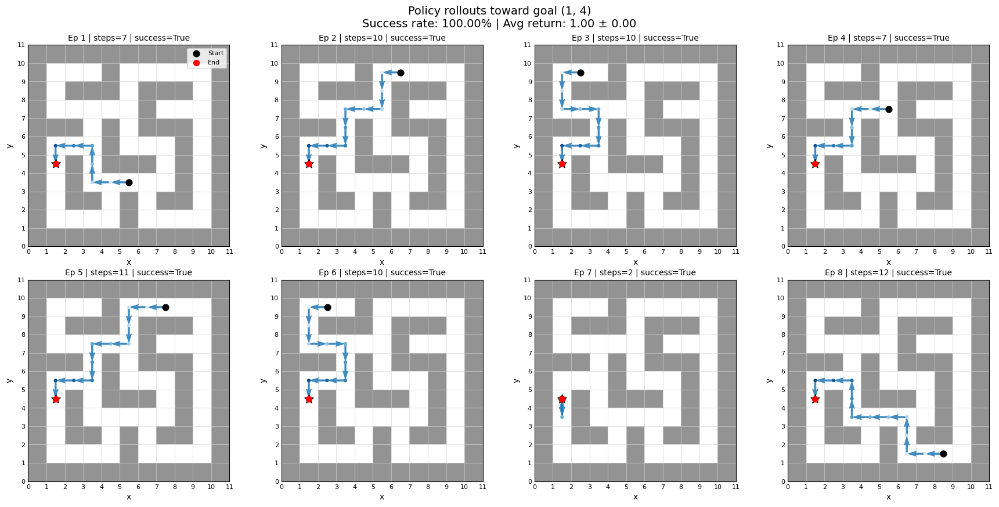

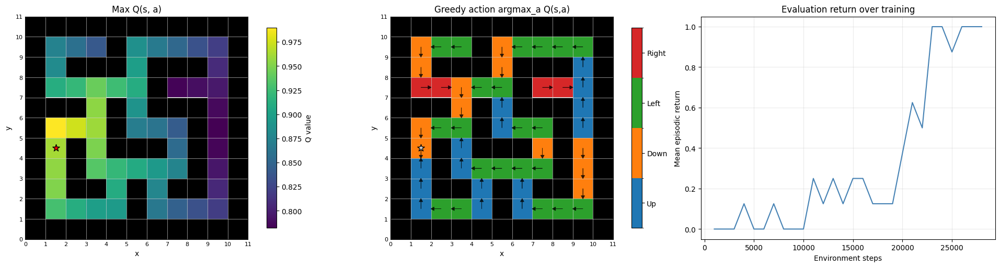

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.424381  2.8100235 2.7823348 2.4190984 2.2859313]
cumulative variance (first 5 dims): [0.21174587 0.35432985 0.49411774 0.59978926 0.69414693]
cos(phi(s,a), psi/task): mean=0.8189, std=0.0758


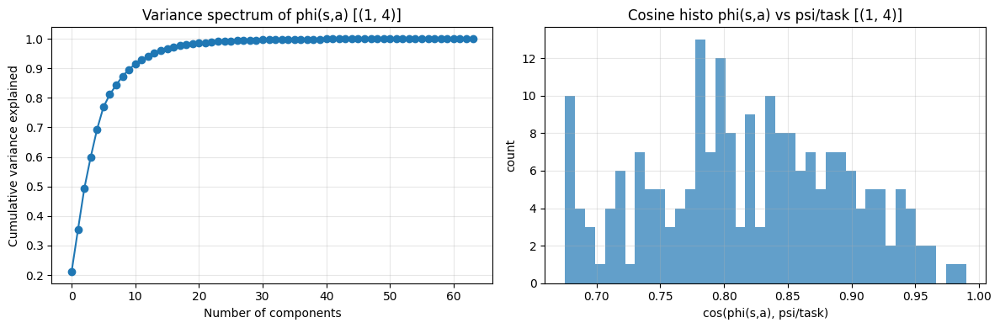


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7
  task_0      1.000      0.990      0.995      0.898      0.992      0.963      0.921      0.959
  task_1      0.990      1.000      0.994      0.901      0.991      0.964      0.921      0.985
  task_2      0.995      0.994      1.000      0.905      0.995      0.971      0.925      0.966
  task_3      0.898      0.901      0.905      1.000      0.897      0.921      0.994      0.881
  task_4      0.992      0.991      0.995      0.897      1.000      0.954      0.919      0.965
  task_5      0.963      0.964      0.971      0.921      0.954      1.000      0.935      0.944
  task_6      0.921      0.921      0.925      0.994      0.919      0.935      1.000      0.899
  task_7      0.959      0.985      0.966      0.881      0.965      0.944      0.899      1.000

Off-diagonal mean similarity: 0.948
Off-diagonal min similarity: 0.881
Off-diagonal max simi

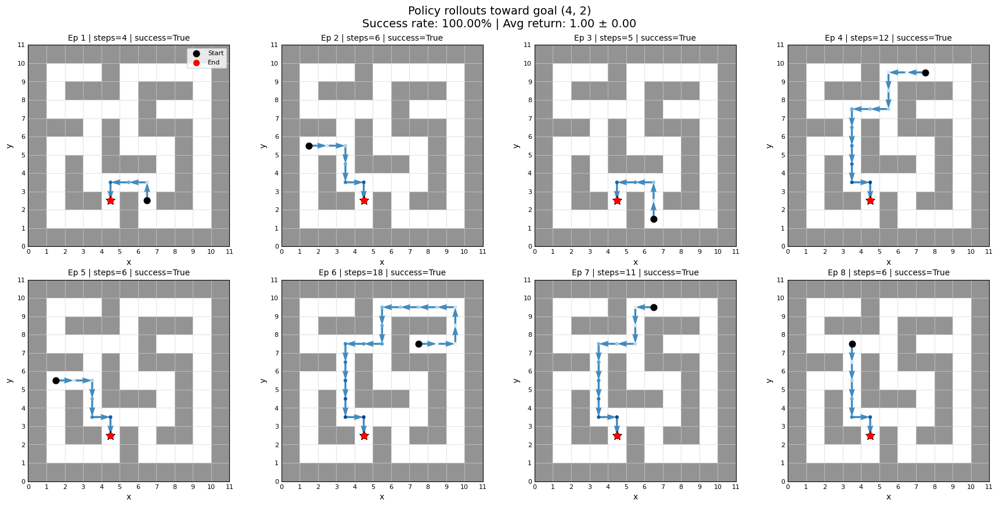

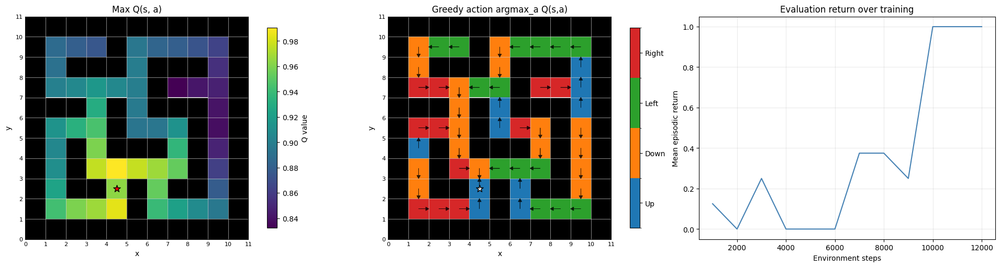

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.20122   3.070921  2.6903813 2.4681027 2.1164489]
cumulative variance (first 5 dims): [0.18886498 0.36266813 0.49606574 0.6083314  0.69088495]
cos(phi(s,a), psi/task): mean=0.8513, std=0.0659


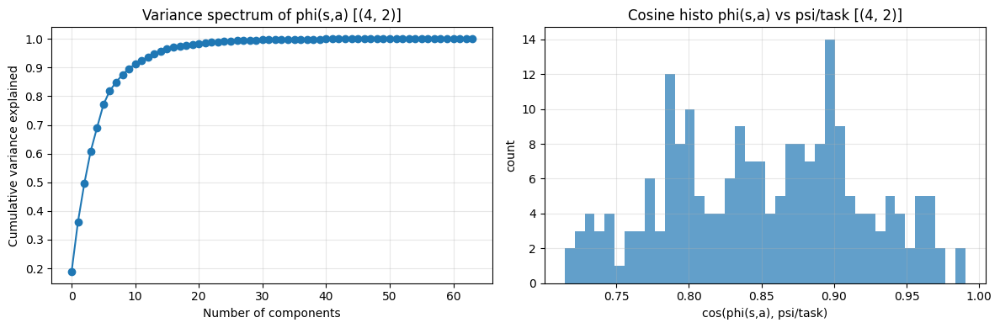


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8
  task_0      1.000      0.990      0.995      0.898      0.992      0.963      0.921      0.959      0.995
  task_1      0.990      1.000      0.994      0.901      0.991      0.964      0.921      0.985      0.993
  task_2      0.995      0.994      1.000      0.905      0.995      0.971      0.925      0.966      0.998
  task_3      0.898      0.901      0.905      1.000      0.897      0.921      0.994      0.881      0.904
  task_4      0.992      0.991      0.995      0.897      1.000      0.954      0.919      0.965      0.995
  task_5      0.963      0.964      0.971      0.921      0.954      1.000      0.935      0.944      0.971
  task_6      0.921      0.921      0.925      0.994      0.919      0.935      1.000      0.899      0.924
  task_7      0.959      0.985      0.966      0.881      0.965      0.944      0.899      1.000      

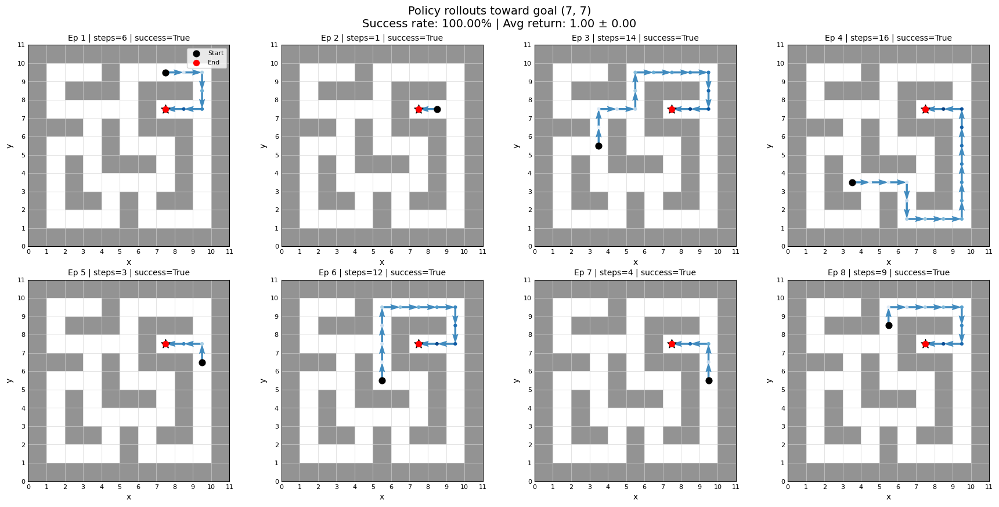

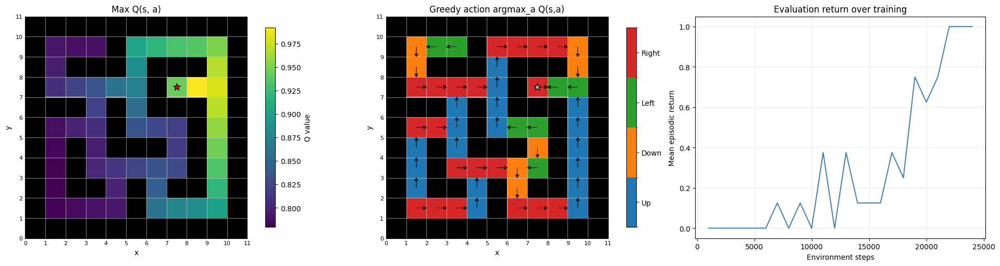

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.26791   3.0834656 2.6845512 2.2750154 2.2442932]
cumulative variance (first 5 dims): [0.18748258 0.35439897 0.48092043 0.5717839  0.6602099 ]
cos(phi(s,a), psi/task): mean=0.7972, std=0.0785


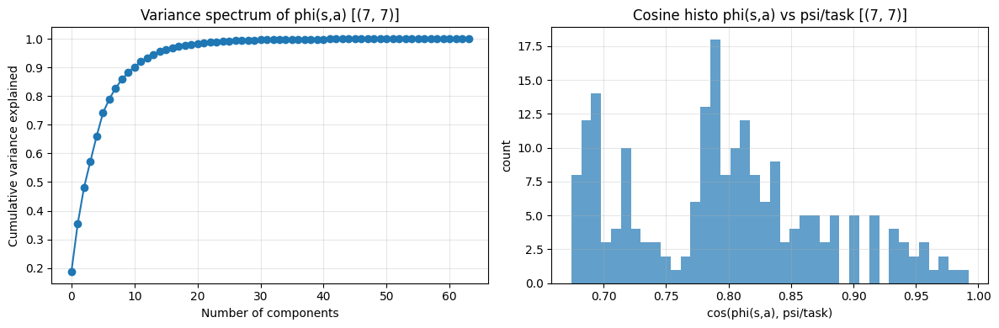


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9
  task_0      1.000      0.990      0.995      0.898      0.992      0.963      0.921      0.959      0.995      0.884
  task_1      0.990      1.000      0.994      0.901      0.991      0.964      0.921      0.985      0.993      0.896
  task_2      0.995      0.994      1.000      0.905      0.995      0.971      0.925      0.966      0.998      0.894
  task_3      0.898      0.901      0.905      1.000      0.897      0.921      0.994      0.881      0.904      0.983
  task_4      0.992      0.991      0.995      0.897      1.000      0.954      0.919      0.965      0.995      0.885
  task_5      0.963      0.964      0.971      0.921      0.954      1.000      0.935      0.944      0.971      0.922
  task_6      0.921      0.921      0.925      0.994      0.919      0.935      1.000      0.899      0.924      0.984
  task_7      

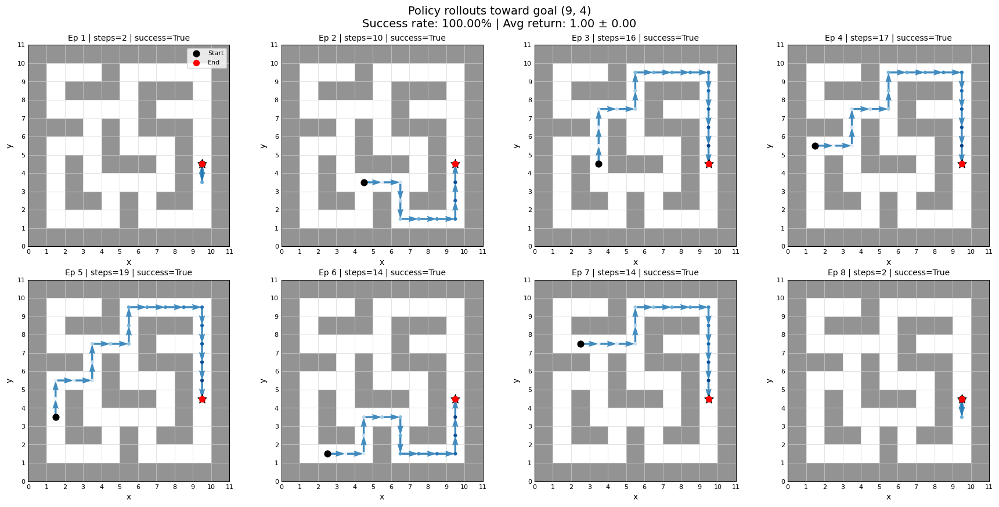

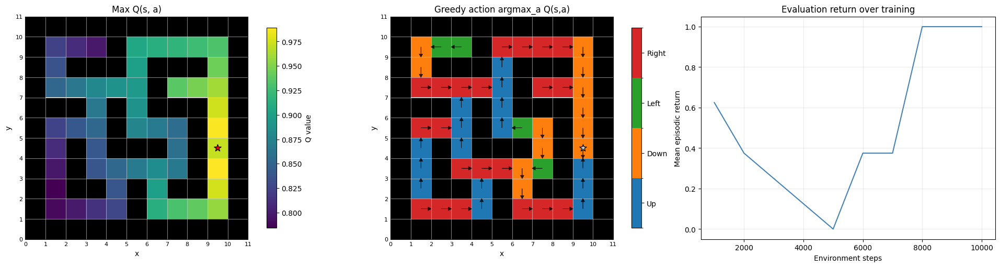

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.4179382 2.9644032 2.6396382 2.277711  2.111119 ]
cumulative variance (first 5 dims): [0.2106238  0.36905968 0.4946823  0.58821774 0.6685712 ]
cos(phi(s,a), psi/task): mean=0.8223, std=0.0757


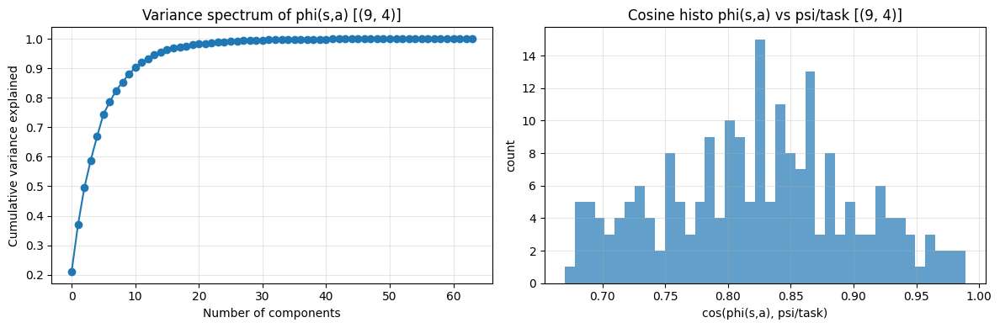


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10
  task_0      1.000      0.990      0.995      0.898      0.992      0.963      0.921      0.959      0.995      0.884      0.920
  task_1      0.990      1.000      0.994      0.901      0.991      0.964      0.921      0.985      0.993      0.896      0.921
  task_2      0.995      0.994      1.000      0.905      0.995      0.971      0.925      0.966      0.998      0.894      0.926
  task_3      0.898      0.901      0.905      1.000      0.897      0.921      0.994      0.881      0.904      0.983      0.989
  task_4      0.992      0.991      0.995      0.897      1.000      0.954      0.919      0.965      0.995      0.885      0.916
  task_5      0.963      0.964      0.971      0.921      0.954      1.000      0.935      0.944      0.971      0.922      0.946
  task_6      0.921      0.921      0.925      0.994    

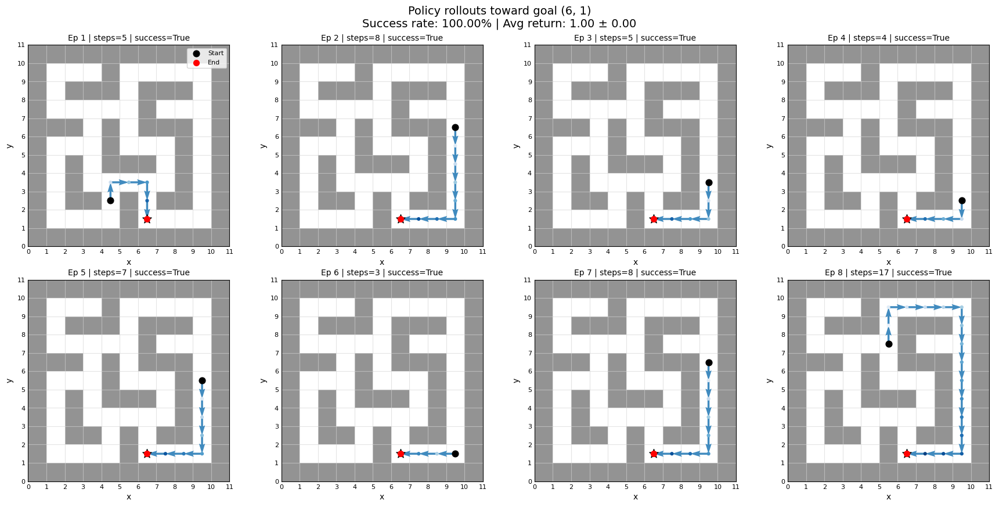

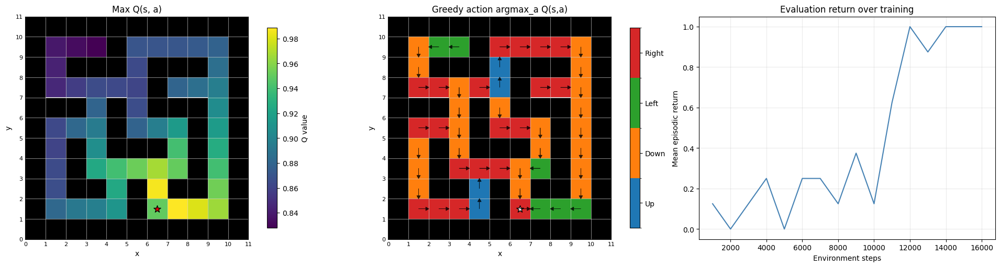

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.277158  3.1332762 2.6741521 2.3918612 2.2334821]
cumulative variance (first 5 dims): [0.19290219 0.3692377  0.49768192 0.6004396  0.69003946]
cos(phi(s,a), psi/task): mean=0.8405, std=0.0645


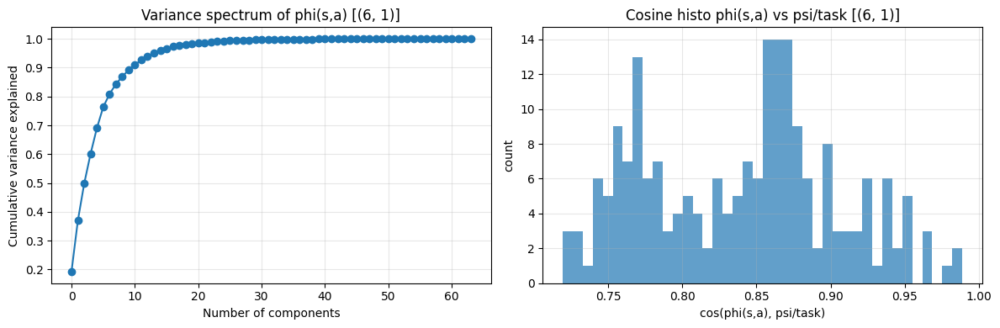


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10    task_11
  task_0      1.000      0.990      0.995      0.898      0.992      0.963      0.921      0.959      0.995      0.884      0.920      0.968
  task_1      0.990      1.000      0.994      0.901      0.991      0.964      0.921      0.985      0.993      0.896      0.921      0.958
  task_2      0.995      0.994      1.000      0.905      0.995      0.971      0.925      0.966      0.998      0.894      0.926      0.970
  task_3      0.898      0.901      0.905      1.000      0.897      0.921      0.994      0.881      0.904      0.983      0.989      0.960
  task_4      0.992      0.991      0.995      0.897      1.000      0.954      0.919      0.965      0.995      0.885      0.916      0.963
  task_5      0.963      0.964      0.971      0.921      0.954      1.000      0.935      0.944      0.971      0.922  

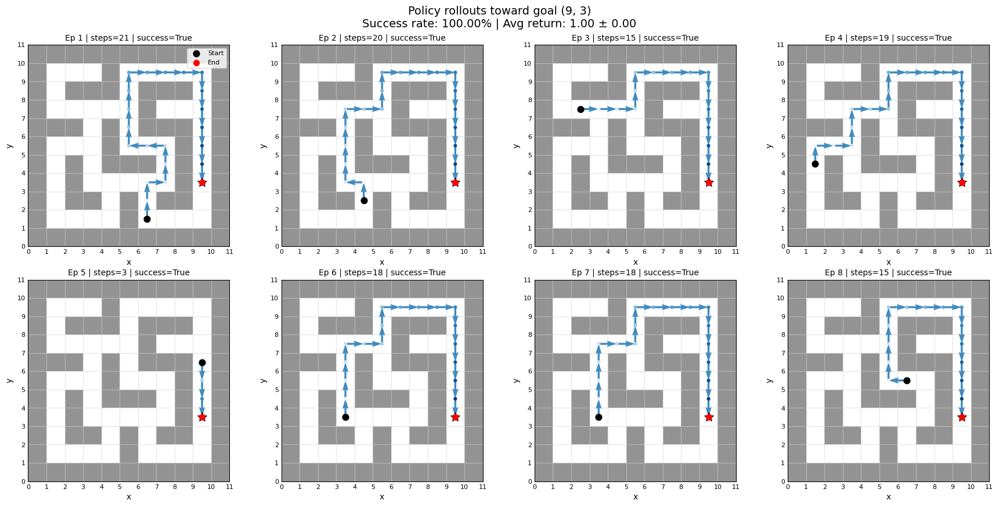

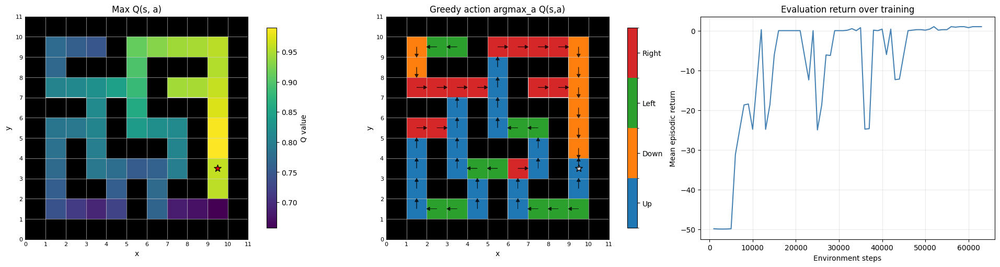

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.35576   3.5881631 2.5444322 2.1458027 1.7607487]
cumulative variance (first 5 dims): [0.31973252 0.5367043  0.6458083  0.7234041  0.7756502 ]
cos(phi(s,a), psi/task): mean=0.7658, std=0.1010


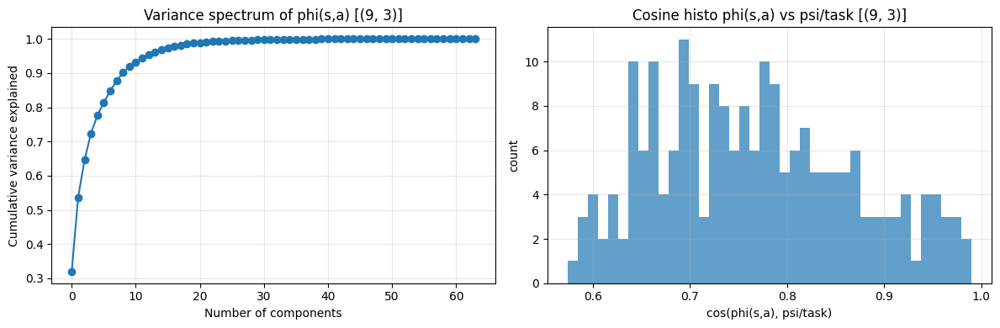


Goal embedding cosine similarity matrix:
     task_0
  task_0      1.000
Finished task_0 | seed=101112 | goal=(9, 3) | steps=63000 | time=224.69s | anchor_sets=1

----- seed=101112, task_idx=1, goal=(6, 9) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.750 | eval_len=130.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.750 | eval_len=131.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.875 | eval_len=70.1 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.625 | eval_len=192.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-49.713 | eval_len=500.0 | TD=6.1561e-04 | SA-stability=0.0000e+00 | projection=False dot=0.000e+00 g_new=4.694e-02 g_stable=0.000e+00
[DQN-factorised] step=   6000 | eps=0.886 | 

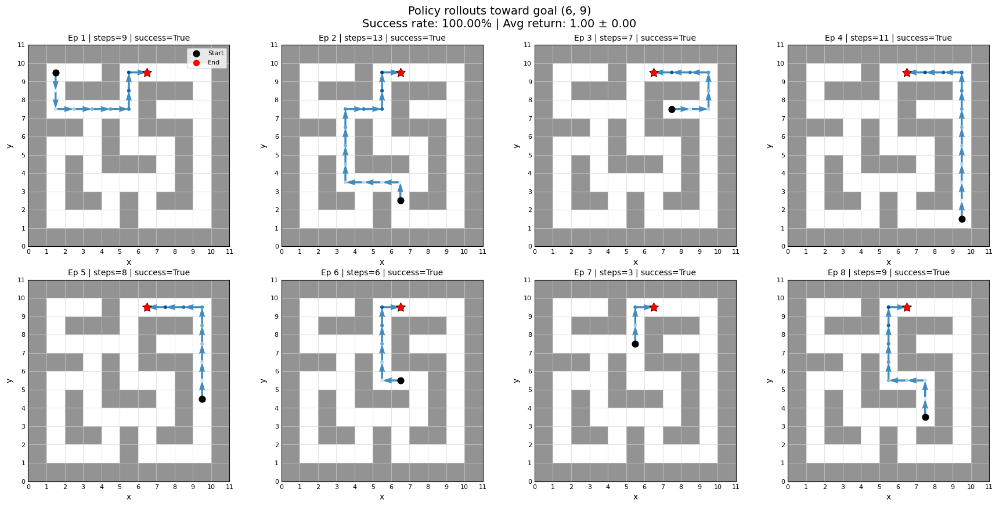

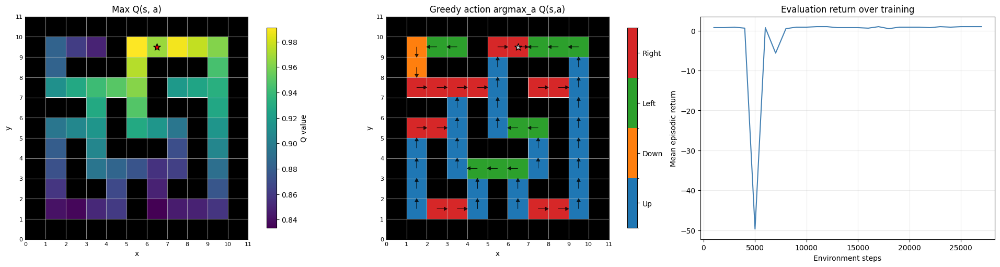

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.5528324 3.471664  2.263288  2.176959  1.8804356]
cumulative variance (first 5 dims): [0.24908446 0.48691767 0.58800036 0.6815189  0.7512962 ]
cos(phi(s,a), psi/task): mean=0.8414, std=0.0669


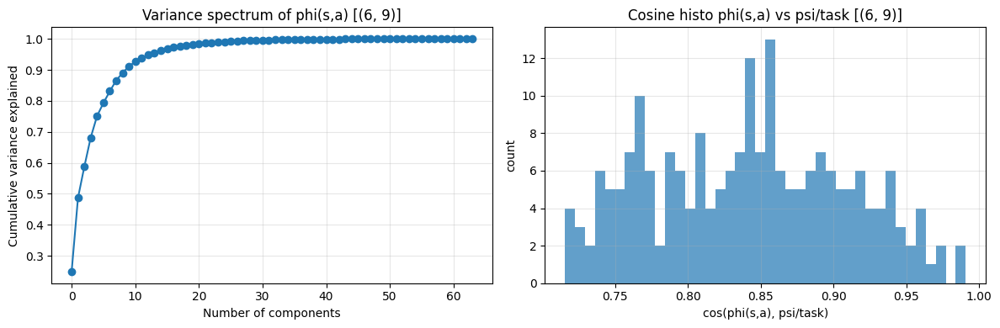


Goal embedding cosine similarity matrix:
     task_0     task_1
  task_0      1.000      0.974
  task_1      0.974      1.000

Off-diagonal mean similarity: 0.974
Off-diagonal min similarity: 0.974
Off-diagonal max similarity: 0.974
Finished task_1 | seed=101112 | goal=(6, 9) | steps=27000 | time=60.81s | anchor_sets=2

----- seed=101112, task_idx=2, goal=(1, 3) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.125 | eval_len=437.9 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=0.000 | eval_len=50

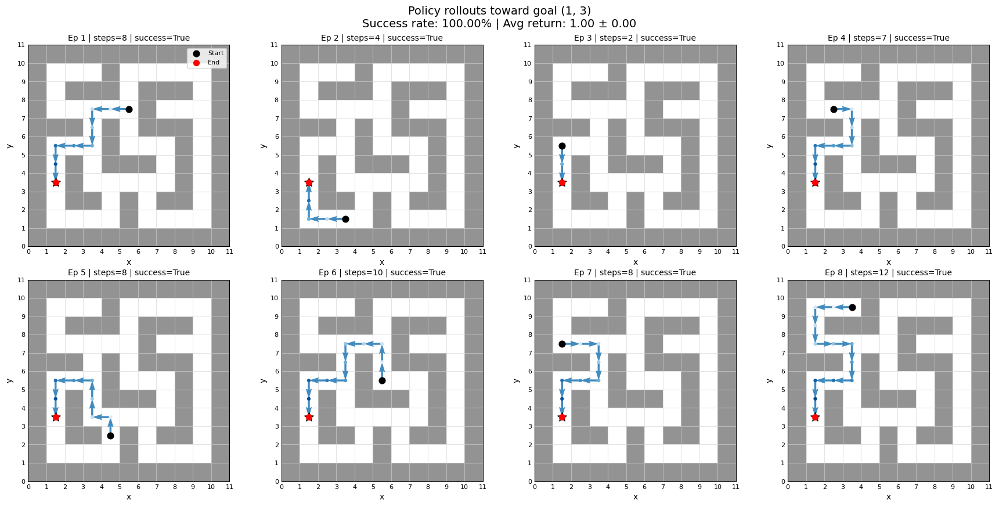

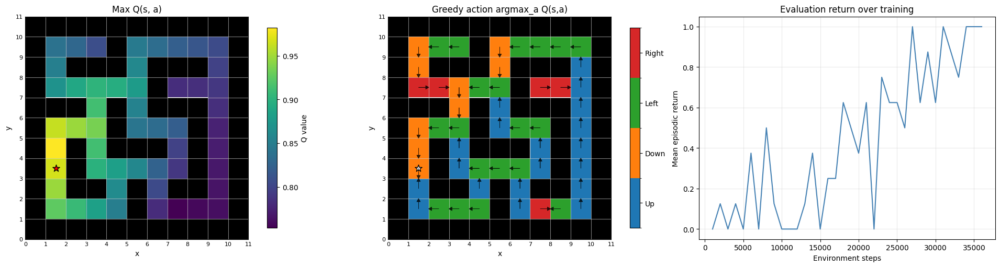

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.765794  3.3698268 2.3512402 2.250526  1.9064267]
cumulative variance (first 5 dims): [0.26373762 0.474928   0.57774216 0.671937   0.7395296 ]
cos(phi(s,a), psi/task): mean=0.7885, std=0.0766


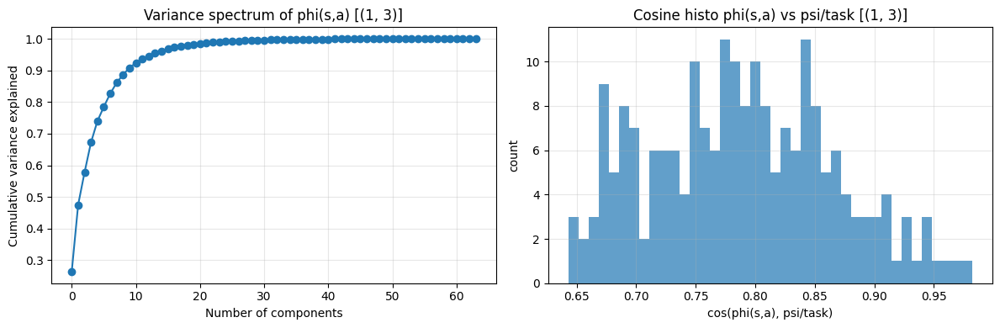


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2
  task_0      1.000      0.974      0.864
  task_1      0.974      1.000      0.925
  task_2      0.864      0.925      1.000

Off-diagonal mean similarity: 0.921
Off-diagonal min similarity: 0.864
Off-diagonal max similarity: 0.974
Finished task_2 | seed=101112 | goal=(1, 3) | steps=36000 | time=121.03s | anchor_sets=3

----- seed=101112, task_idx=3, goal=(1, 8) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=437.8 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a

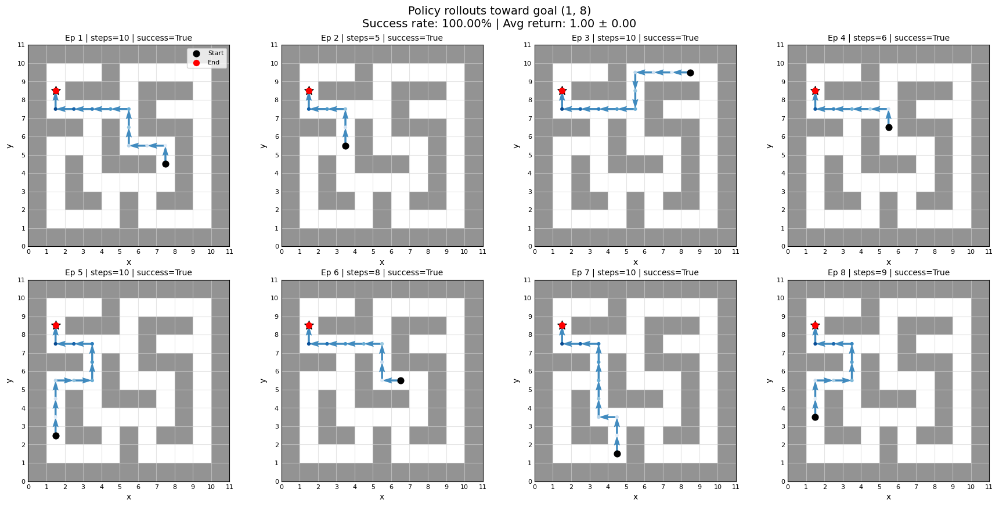

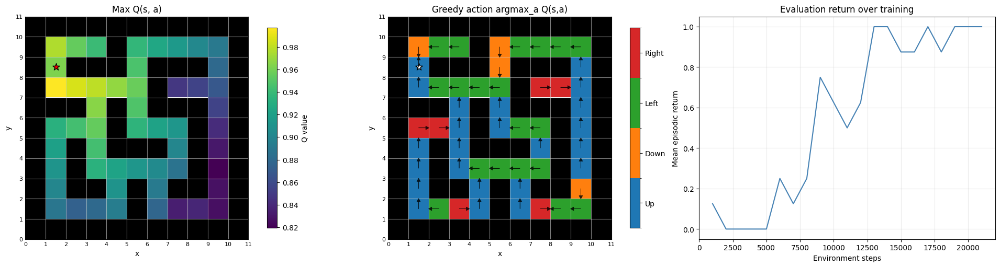

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.713112  3.365033  2.3103175 2.094441  1.8588425]
cumulative variance (first 5 dims): [0.2687475  0.48947018 0.5935129  0.67902046 0.74637294]
cos(phi(s,a), psi/task): mean=0.8503, std=0.0689


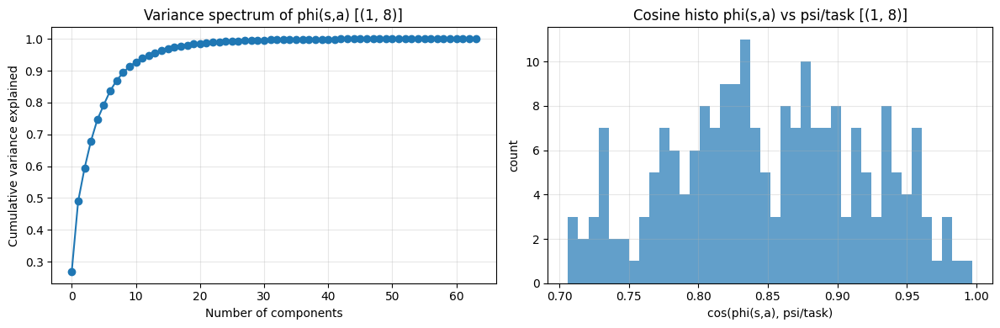


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3
  task_0      1.000      0.974      0.864      0.934
  task_1      0.974      1.000      0.925      0.984
  task_2      0.864      0.925      1.000      0.967
  task_3      0.934      0.984      0.967      1.000

Off-diagonal mean similarity: 0.941
Off-diagonal min similarity: 0.864
Off-diagonal max similarity: 0.984
Finished task_3 | seed=101112 | goal=(1, 8) | steps=21000 | time=55.91s | anchor_sets=4

----- seed=101112, task_idx=4, goal=(2, 9) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=437.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.125 | eval_len=437.6 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.924

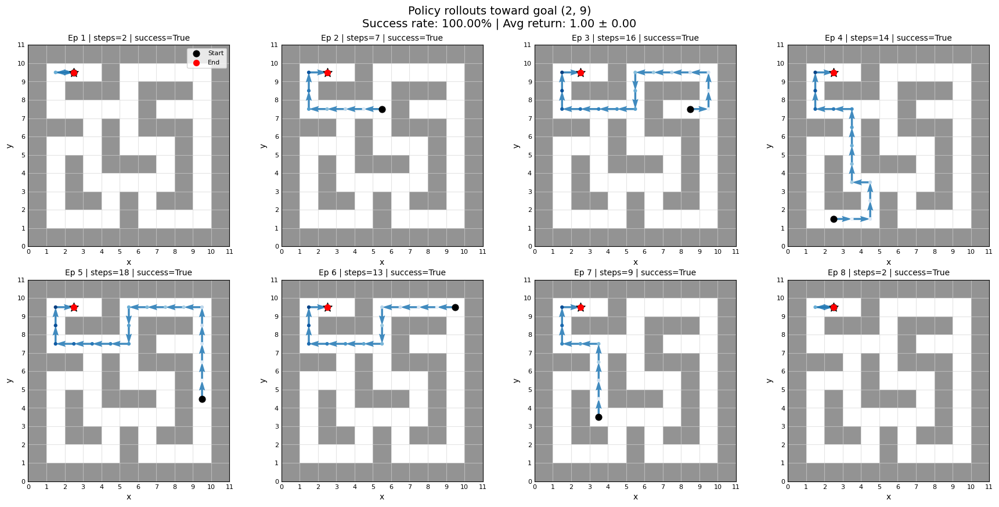

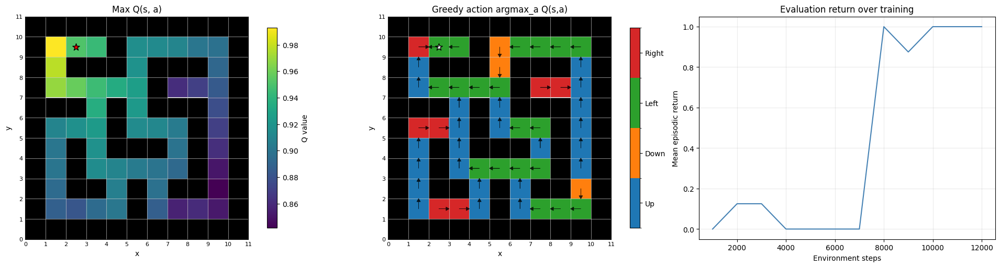

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.68301   3.3886929 2.2740755 2.061611  1.7977424]
cumulative variance (first 5 dims): [0.26811475 0.49509043 0.5973078  0.68131727 0.745198  ]
cos(phi(s,a), psi/task): mean=0.8497, std=0.0600


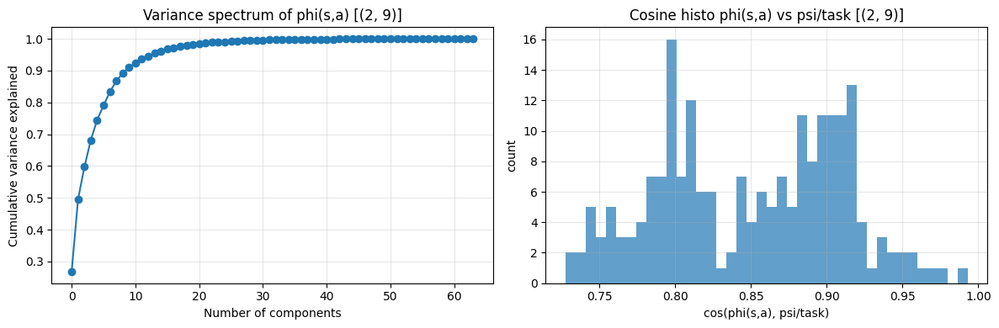


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4
  task_0      1.000      0.974      0.864      0.934      0.939
  task_1      0.974      1.000      0.925      0.984      0.984
  task_2      0.864      0.925      1.000      0.967      0.961
  task_3      0.934      0.984      0.967      1.000      0.994
  task_4      0.939      0.984      0.961      0.994      1.000

Off-diagonal mean similarity: 0.953
Off-diagonal min similarity: 0.864
Off-diagonal max similarity: 0.994
Finished task_4 | seed=101112 | goal=(2, 9) | steps=12000 | time=32.20s | anchor_sets=5

----- seed=101112, task_idx=5, goal=(7, 9) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.500 | eval_len=252.4 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.375 | eval_len=314.5 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.25

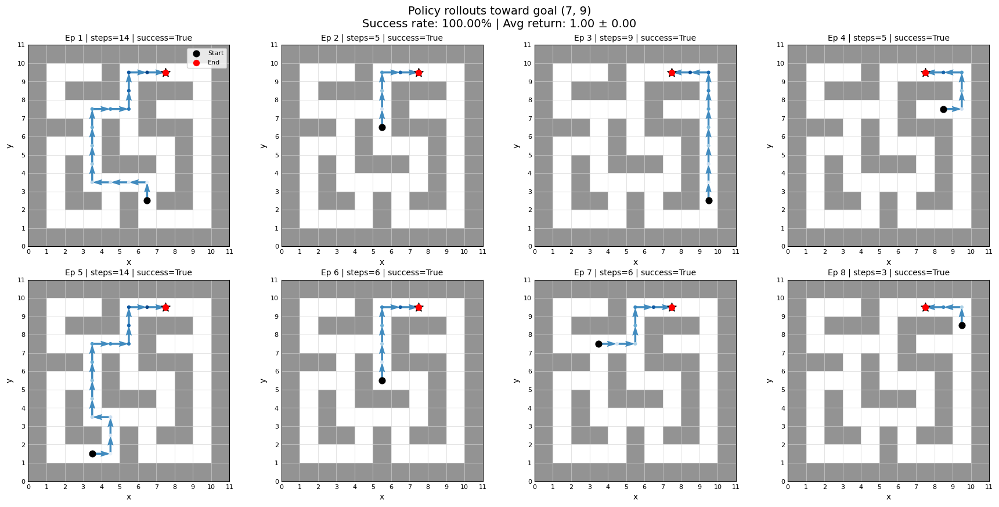

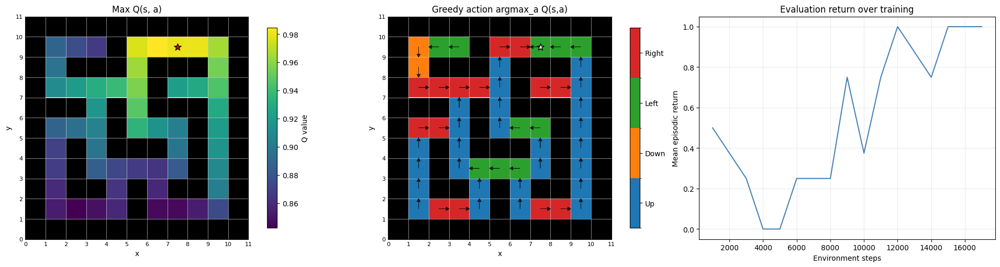

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.5066874 3.3424215 2.19219   2.0950227 1.8618876]
cumulative variance (first 5 dims): [0.2550641  0.48679164 0.58647245 0.6775125  0.749418  ]
cos(phi(s,a), psi/task): mean=0.8448, std=0.0639


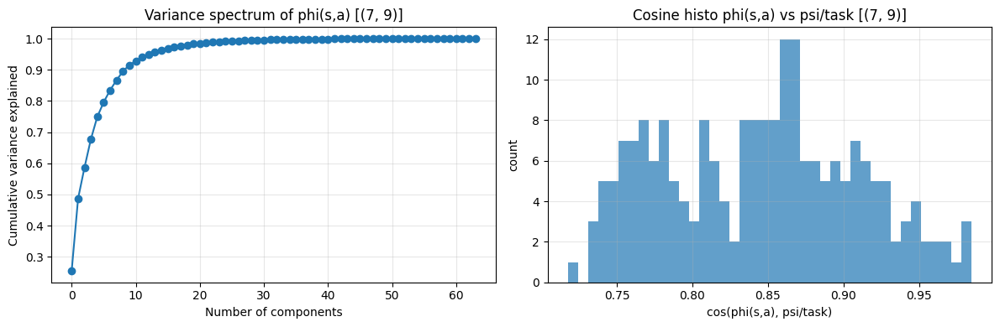


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5
  task_0      1.000      0.974      0.864      0.934      0.939      0.972
  task_1      0.974      1.000      0.925      0.984      0.984      0.996
  task_2      0.864      0.925      1.000      0.967      0.961      0.909
  task_3      0.934      0.984      0.967      1.000      0.994      0.972
  task_4      0.939      0.984      0.961      0.994      1.000      0.974
  task_5      0.972      0.996      0.909      0.972      0.974      1.000

Off-diagonal mean similarity: 0.957
Off-diagonal min similarity: 0.864
Off-diagonal max similarity: 0.996
Finished task_5 | seed=101112 | goal=(7, 9) | steps=17000 | time=43.82s | anchor_sets=6

----- seed=101112, task_idx=6, goal=(8, 7) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=500.0 | TD=0.0000e+00 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0

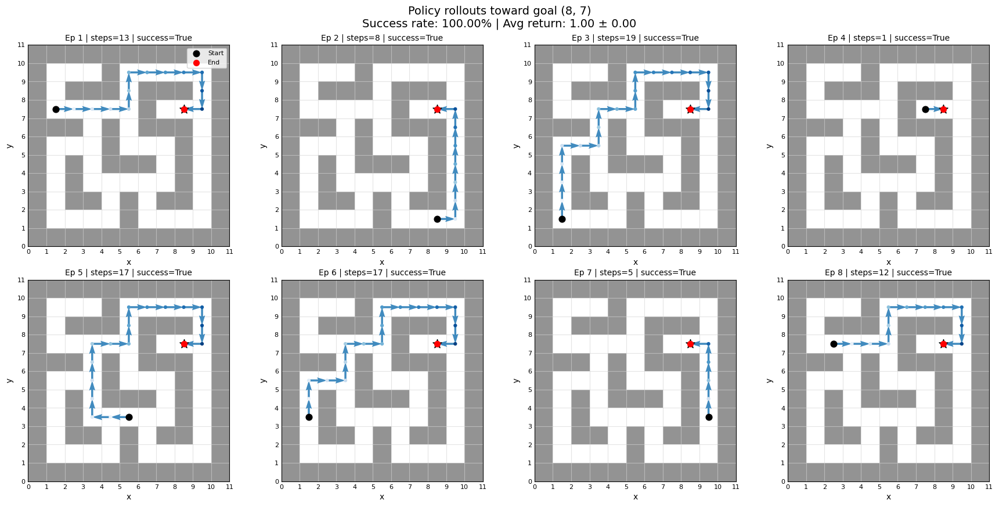

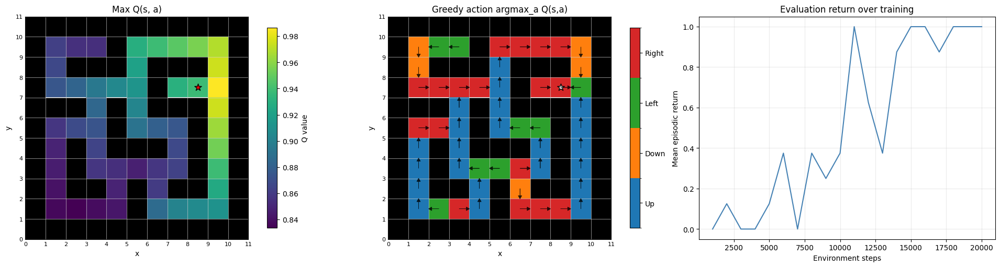

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.597921  3.3147044 2.1991332 2.1179068 1.7644315]
cumulative variance (first 5 dims): [0.26837924 0.4961696  0.5964345  0.68942946 0.75397336]
cos(phi(s,a), psi/task): mean=0.8381, std=0.0648


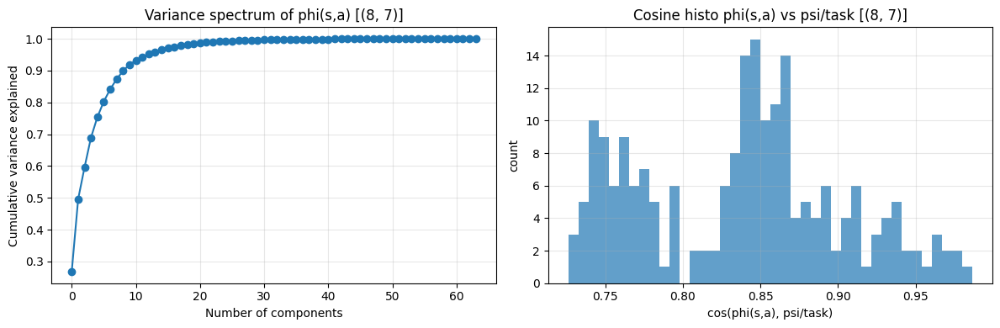


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6
  task_0      1.000      0.974      0.864      0.934      0.939      0.972      0.965
  task_1      0.974      1.000      0.925      0.984      0.984      0.996      0.972
  task_2      0.864      0.925      1.000      0.967      0.961      0.909      0.864
  task_3      0.934      0.984      0.967      1.000      0.994      0.972      0.937
  task_4      0.939      0.984      0.961      0.994      1.000      0.974      0.946
  task_5      0.972      0.996      0.909      0.972      0.974      1.000      0.981
  task_6      0.965      0.972      0.864      0.937      0.946      0.981      1.000

Off-diagonal mean similarity: 0.953
Off-diagonal min similarity: 0.864
Off-diagonal max similarity: 0.996
Finished task_6 | seed=101112 | goal=(8, 7) | steps=20000 | time=55.85s | anchor_sets=7

----- seed=101112, task_idx=7, goal=(3, 4) -----

[DQN-factorised] step=   1000 | 

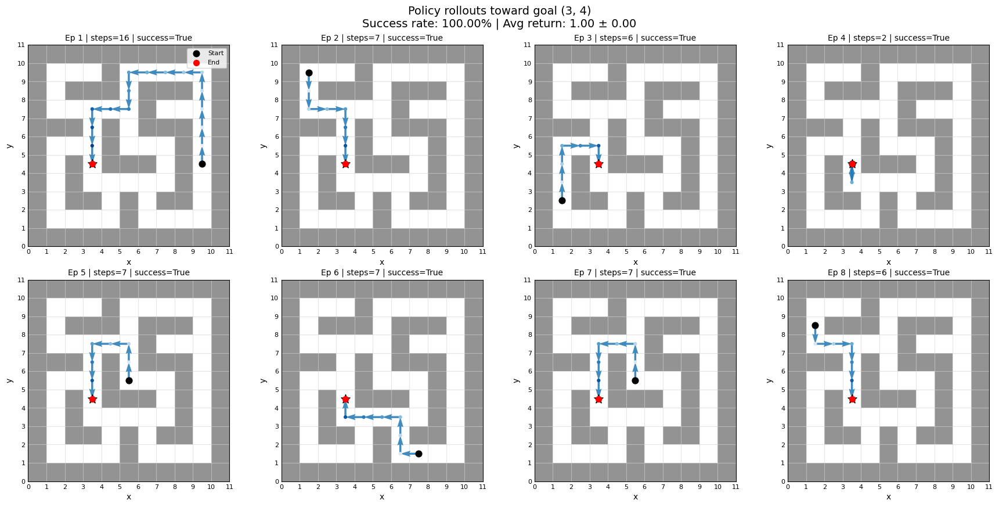

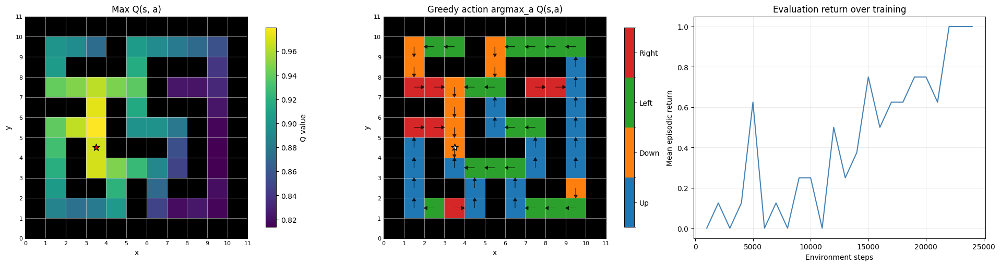

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.6748285 3.4130738 2.409319  2.0770197 1.8872654]
cumulative variance (first 5 dims): [0.25950047 0.48334956 0.5948952  0.6777934  0.74623656]
cos(phi(s,a), psi/task): mean=0.8326, std=0.0717


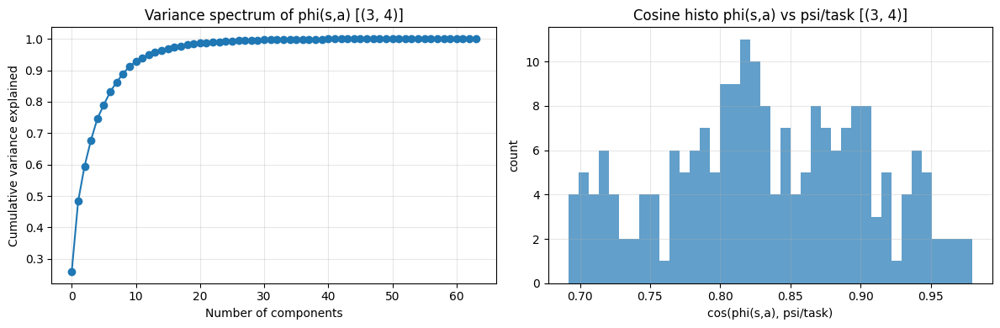


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7
  task_0      1.000      0.974      0.864      0.934      0.939      0.972      0.965      0.909
  task_1      0.974      1.000      0.925      0.984      0.984      0.996      0.972      0.965
  task_2      0.864      0.925      1.000      0.967      0.961      0.909      0.864      0.976
  task_3      0.934      0.984      0.967      1.000      0.994      0.972      0.937      0.989
  task_4      0.939      0.984      0.961      0.994      1.000      0.974      0.946      0.983
  task_5      0.972      0.996      0.909      0.972      0.974      1.000      0.981      0.952
  task_6      0.965      0.972      0.864      0.937      0.946      0.981      1.000      0.917
  task_7      0.909      0.965      0.976      0.989      0.983      0.952      0.917      1.000

Off-diagonal mean similarity: 0.954
Off-diagonal min similarity: 0.864
Off-diagonal max simi

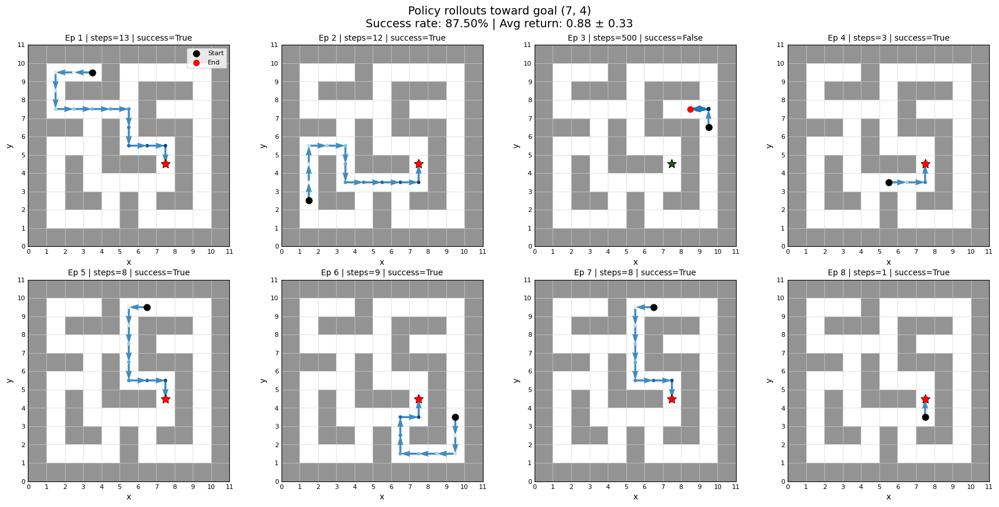

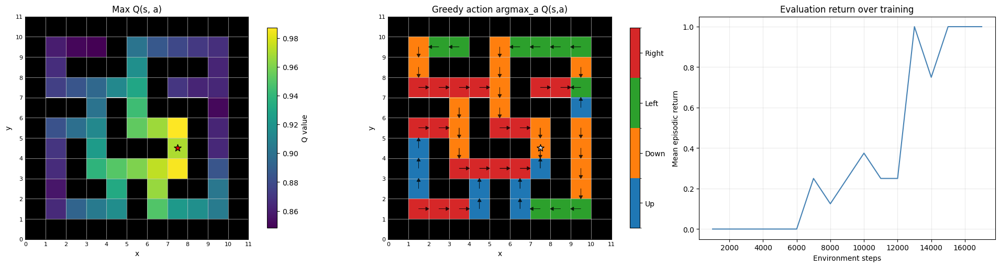

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.69554   3.3839116 2.187445  2.1718938 1.8280448]
cumulative variance (first 5 dims): [0.26391864 0.4852038  0.5776712  0.6688285  0.73340696]
cos(phi(s,a), psi/task): mean=0.8463, std=0.0634


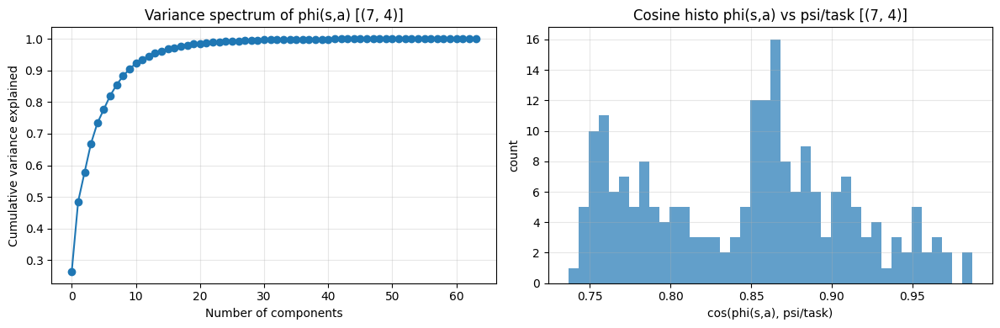


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8
  task_0      1.000      0.974      0.864      0.934      0.939      0.972      0.965      0.909      0.910
  task_1      0.974      1.000      0.925      0.984      0.984      0.996      0.972      0.965      0.955
  task_2      0.864      0.925      1.000      0.967      0.961      0.909      0.864      0.976      0.919
  task_3      0.934      0.984      0.967      1.000      0.994      0.972      0.937      0.989      0.960
  task_4      0.939      0.984      0.961      0.994      1.000      0.974      0.946      0.983      0.969
  task_5      0.972      0.996      0.909      0.972      0.974      1.000      0.981      0.952      0.948
  task_6      0.965      0.972      0.864      0.937      0.946      0.981      1.000      0.917      0.936
  task_7      0.909      0.965      0.976      0.989      0.983      0.952      0.917      1.000      

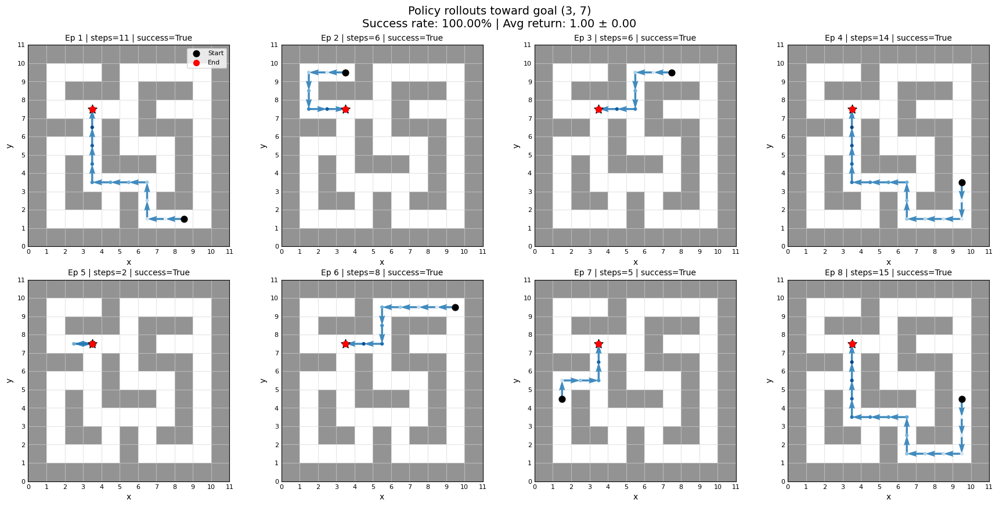

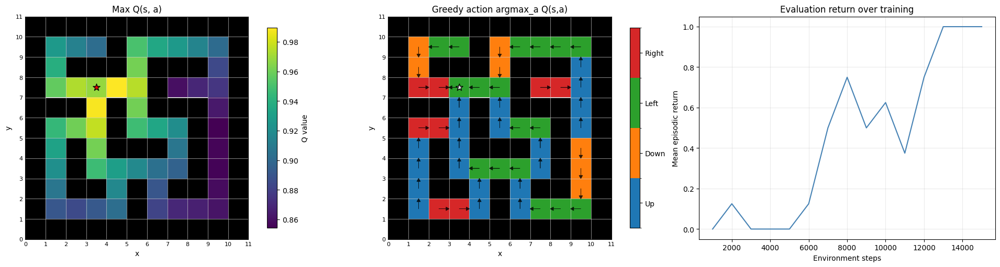

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.628978  3.3035579 2.3511622 2.0411446 1.8690346]
cumulative variance (first 5 dims): [0.26626715 0.48692164 0.5986888  0.6829245  0.7535536 ]
cos(phi(s,a), psi/task): mean=0.8582, std=0.0639


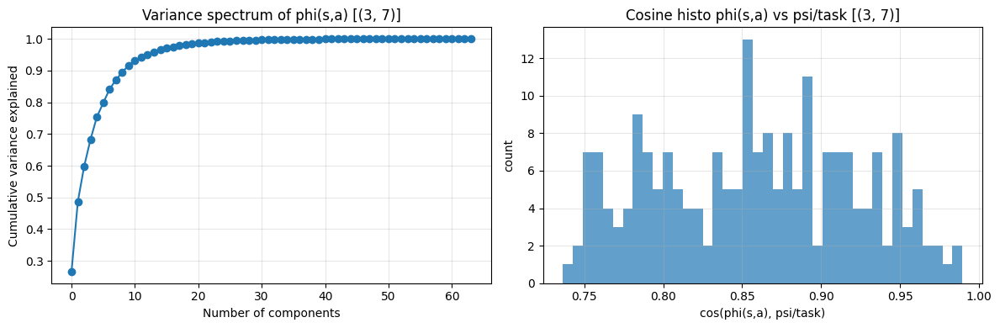


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9
  task_0      1.000      0.974      0.864      0.934      0.939      0.972      0.965      0.909      0.910      0.938
  task_1      0.974      1.000      0.925      0.984      0.984      0.996      0.972      0.965      0.955      0.987
  task_2      0.864      0.925      1.000      0.967      0.961      0.909      0.864      0.976      0.919      0.959
  task_3      0.934      0.984      0.967      1.000      0.994      0.972      0.937      0.989      0.960      0.997
  task_4      0.939      0.984      0.961      0.994      1.000      0.974      0.946      0.983      0.969      0.990
  task_5      0.972      0.996      0.909      0.972      0.974      1.000      0.981      0.952      0.948      0.978
  task_6      0.965      0.972      0.864      0.937      0.946      0.981      1.000      0.917      0.936      0.947
  task_7      

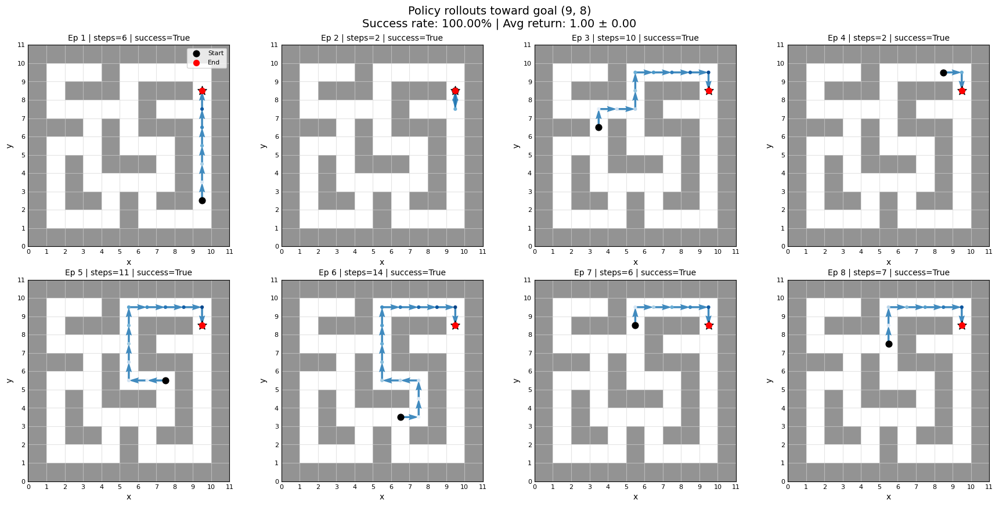

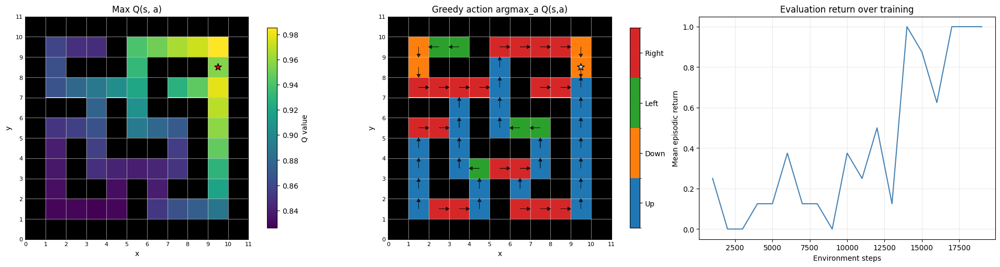

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.5851753 3.31813   2.2125266 2.116746  1.8541679]
cumulative variance (first 5 dims): [0.26342732 0.48907292 0.58939976 0.6812283  0.7516875 ]
cos(phi(s,a), psi/task): mean=0.8287, std=0.0688


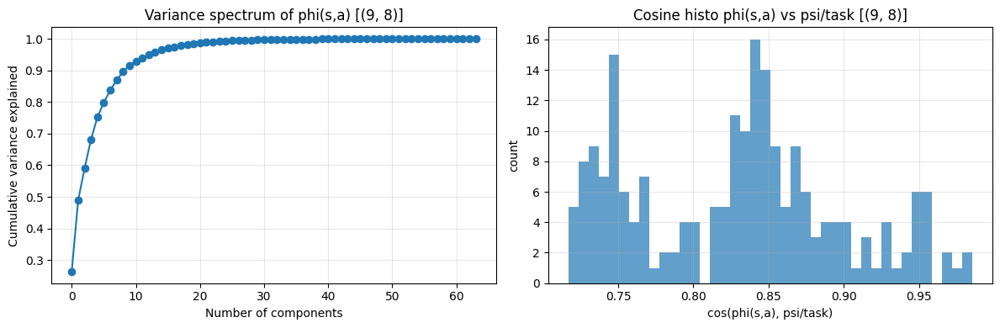


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10
  task_0      1.000      0.974      0.864      0.934      0.939      0.972      0.965      0.909      0.910      0.938      0.969
  task_1      0.974      1.000      0.925      0.984      0.984      0.996      0.972      0.965      0.955      0.987      0.973
  task_2      0.864      0.925      1.000      0.967      0.961      0.909      0.864      0.976      0.919      0.959      0.864
  task_3      0.934      0.984      0.967      1.000      0.994      0.972      0.937      0.989      0.960      0.997      0.936
  task_4      0.939      0.984      0.961      0.994      1.000      0.974      0.946      0.983      0.969      0.990      0.947
  task_5      0.972      0.996      0.909      0.972      0.974      1.000      0.981      0.952      0.948      0.978      0.983
  task_6      0.965      0.972      0.864      0.937    

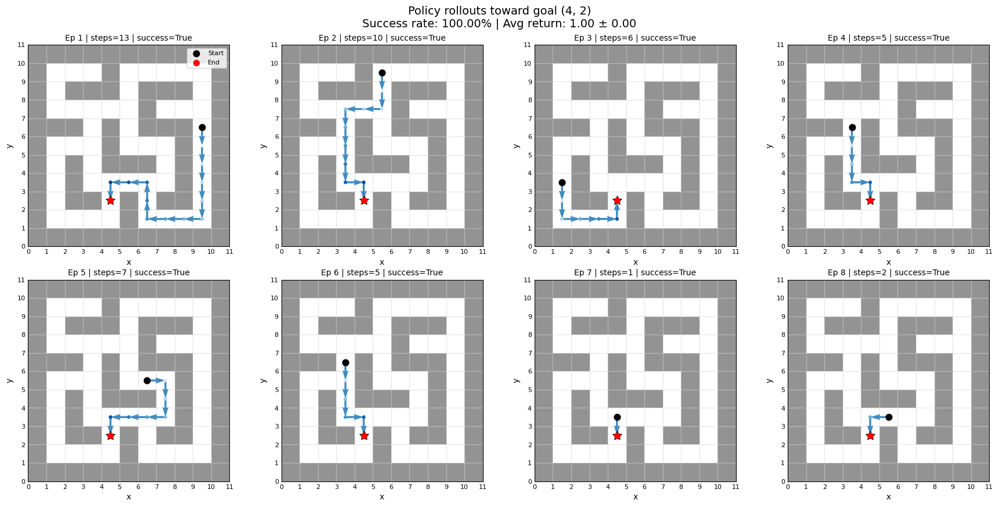

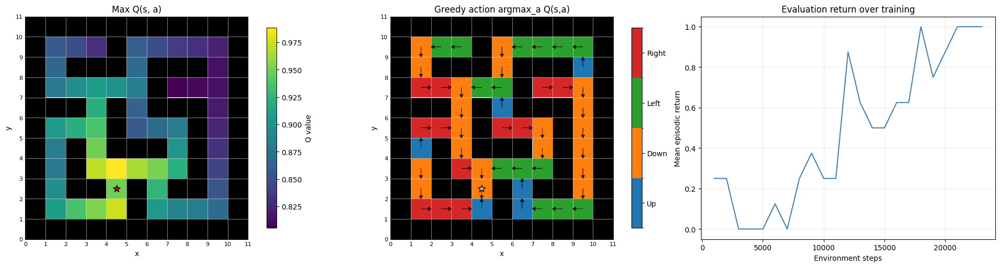

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.6981335 3.437533  2.239876  2.1108255 1.8727664]
cumulative variance (first 5 dims): [0.2607321  0.48601234 0.5816606  0.6666049  0.73346955]
cos(phi(s,a), psi/task): mean=0.8261, std=0.0691


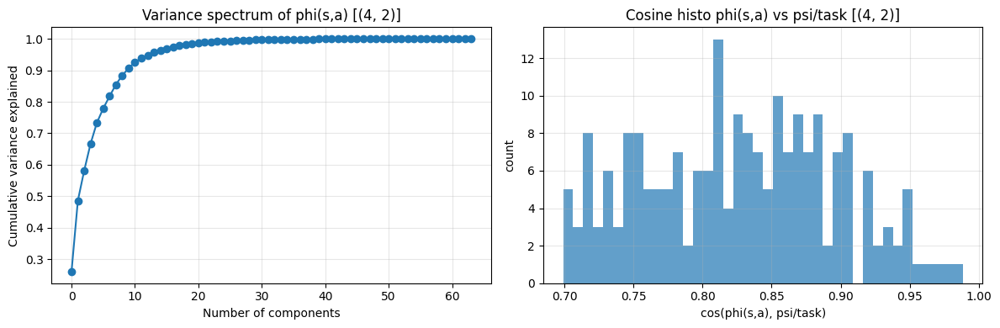


Goal embedding cosine similarity matrix:
     task_0     task_1     task_2     task_3     task_4     task_5     task_6     task_7     task_8     task_9    task_10    task_11
  task_0      1.000      0.974      0.864      0.934      0.939      0.972      0.965      0.909      0.910      0.938      0.969      0.878
  task_1      0.974      1.000      0.925      0.984      0.984      0.996      0.972      0.965      0.955      0.987      0.973      0.935
  task_2      0.864      0.925      1.000      0.967      0.961      0.909      0.864      0.976      0.919      0.959      0.864      0.942
  task_3      0.934      0.984      0.967      1.000      0.994      0.972      0.937      0.989      0.960      0.997      0.936      0.956
  task_4      0.939      0.984      0.961      0.994      1.000      0.974      0.946      0.983      0.969      0.990      0.947      0.964
  task_5      0.972      0.996      0.909      0.972      0.974      1.000      0.981      0.952      0.948      0.978  

In [3]:
SEEDS = [42, 123, 456, 789, 101112]

NUM_GOALS = 12

BUFFER_CAPACITY = 100000
LR = 1e-3

TOTAL_STEPS = 100000
WARMUP_STEPS = 5000
BATCH_SIZE = 256
GAMMA = 0.99
TAU = 0.005

EPS_START = 1.0
EPS_END = 0.05
EPS_DECAY_STEPS = 50000
TRAIN_FREQ = 4

sa_keywords_local = ["sa_encoder"]
goal_keywords_local = ["goal_encoder"]


# Store results by logical task index.
# task_idx=0 means the first sampled task for each seed,
# task_idx=1 means the second sampled task, etc.
overall_results = {
    task_idx: {
        "goals_by_seed": {},
        "eval_returns": [],
        "eval_returns_time": [],
        "min_steps": [],
        "min_time": [],
        "task_embeddings": [],
        "sa_embeddings": [],
        "sa_fixed_probe_embeddings": [],
        "sa_batches_final": [],
        "sa_weight_change": [],
        "goal_weight_change": [],
    }
    for task_idx in range(NUM_GOALS)
}


# Store the actual physical goal associated with each
# seed/task-index pair.
goals_by_seed = {}


final_q_networks = {}
final_q_target_networks = {}
weight_history_by_seed = {}


free_cells = get_free_cells(MAZE_LAYOUT)


for seed in SEEDS:
    print(
        f"\n================ SEED {seed} ================\n"
    )

    # Set the training seed
    set_seed(seed)

    # Use the seed to generate a different goal sequence
    # for each seed.
    goal_rng = np.random.default_rng(seed)

    GOALS = sample_goals(
        NUM_GOALS,
        goal_rng,
        cells=free_cells,
    )

    # Save this seed's task-index-to-goal mapping
    goals_by_seed[seed] = list(GOALS)

    # Also store the mapping inside overall_results
    for task_idx, goal in enumerate(GOALS):
        overall_results[task_idx]["goals_by_seed"][seed] = goal

    print(
        f"Sampled GOALS for seed {seed}: {GOALS}"
    )


    # Obtain environment dimensions
    env_tmp = make_env(goal=GOALS[0])

    obs_dim = env_tmp.observation_space.shape[0]
    num_actions = env_tmp.action_space.n

    env_tmp.close()


    # Initialise online and target networks
    q_net = FactorisedDQN_QNetwork(
        obs_dim=obs_dim,
        num_actions=num_actions,
        goal_dim=2,
        hidden_dim=128,
        rep_dim=64,
    ).to(DEVICE)

    q_target = FactorisedDQN_QNetwork(
        obs_dim=obs_dim,
        num_actions=num_actions,
        goal_dim=2,
        hidden_dim=128,
        rep_dim=64,
    ).to(DEVICE)


    q_target.load_state_dict(
        q_net.state_dict()
    )


    for p in q_net.parameters():
        p.requires_grad_(True)

    for p in q_target.parameters():
        p.requires_grad_(False)


    # Reset memory for each seed
    embedding_memory = {
        "sa_anchors": [],
    }

    task_embedding_memory = []
    task_labels = []
    weight_history = []


    # Train sequentially through this seed's task sequence
    for task_idx, goal in enumerate(GOALS):
        task_label = f"task_{task_idx}"

        print(
            f"\n----- seed={seed}, "
            f"task_idx={task_idx}, "
            f"goal={goal} -----\n"
        )


        for p in q_net.parameters():
            p.requires_grad_(True)


        # Snapshot before training the current task
        weight_history.append(
            collect_weight_snapshot(
                qnet=q_net,
                goal_label=task_label,
                stage_label=(
                    f"{task_label}_before_train"
                ),
                sa_keywords_local=sa_keywords_local,
                goal_keywords_local=goal_keywords_local,
                max_samples_per_group=40000,
            )
        )


        train_env = make_env(
            goal=goal
        )


        (
            q_net,
            q_target,
            eval_returns,
            min_steps,
            min_time,
            task_embedding,
            sa_embedding_mean,
            sa_embedding_fixed,
            sa_batch_final,
            buffer,
        ) = dqn_train_new(
            # This gives each seed/task pair a distinct
            # training seed.
            seed=seed + task_idx,

            q_network=q_net,
            q_target_network=q_target,
            env=train_env,
            make_env=make_env,

            buffer_capacity=BUFFER_CAPACITY,
            lr=LR,
            obs_dim=obs_dim,
            device=DEVICE,

            total_steps=TOTAL_STEPS,
            warmup_steps=WARMUP_STEPS,
            batch_size=BATCH_SIZE,

            gamma=GAMMA,
            tau=TAU,

            eps_start=EPS_START,
            eps_end=EPS_END,
            eps_decay_steps=EPS_DECAY_STEPS,
            train_freq=TRAIN_FREQ,

            goal=goal,
            td_steps=1,

            embedding_memory=embedding_memory,

            early_stop_reward=0.99,
            early_stop_patience=3,
            enable_early_stop=True,

            use_sa_stability=True,
            project_sa_gradients=True,
            lambda_sa_stability=1.0,

            sa_anchor_batch_size=128,
            sa_anchor_memory_per_goal=512,
            max_anchor_sets=20,
        )


        # Snapshot after training the current task
        weight_history.append(
            collect_weight_snapshot(
                qnet=q_net,
                goal_label=task_label,
                stage_label=(
                    f"{task_label}_after_train"
                ),
                sa_keywords_local=sa_keywords_local,
                goal_keywords_local=goal_keywords_local,
                max_samples_per_group=40000,
            )
        )


        # Compute parameter changes for this task
        before_snap = weight_history[-2]
        after_snap = weight_history[-1]


        sa_change_stats = (
            compute_weight_change_from_snapshots(
                before_snap,
                after_snap,
                prefix="sa",
            )
        )


        goal_change_stats = (
            compute_weight_change_from_snapshots(
                before_snap,
                after_snap,
                prefix="goal",
            )
        )


        # These functions still receive the actual goal because
        # they need the physical goal to construct the environment.
        # Their internal titles/labels can be changed separately
        # to use task_idx if required.
        visualise_q_table(
            goal,
            q_net,
            eval_returns=eval_returns,
            device=DEVICE,
            make_env=make_env,
        )


        visualise_embeddings(
            goal=goal,
            q_network=q_net,
            device=DEVICE,
            make_env=make_env,
            action_mode="all_discrete",
        )


        # Store task embedding using task-index labels
        task_embedding_memory.append(
            task_embedding
        )

        task_labels.append(
            task_label
        )


        print_goal_embedding_similarity(
            task_embedding_memory,
            goal_labels=task_labels,
        )


        # Store all results by task_idx
        overall_results[task_idx][
            "eval_returns"
        ].append(
            eval_returns
        )

        overall_results[task_idx][
            "min_steps"
        ].append(
            min_steps
        )

        overall_results[task_idx][
            "min_time"
        ].append(
            min_time
        )

        overall_results[task_idx][
            "task_embeddings"
        ].append(
            task_embedding
        )

        overall_results[task_idx][
            "sa_embeddings"
        ].append(
            sa_embedding_mean
        )

        overall_results[task_idx][
            "sa_fixed_probe_embeddings"
        ].append(
            sa_embedding_fixed
        )

        overall_results[task_idx][
            "sa_batches_final"
        ].append(
            sa_batch_final
        )

        overall_results[task_idx][
            "sa_weight_change"
        ].append(
            sa_change_stats
        )

        overall_results[task_idx][
            "goal_weight_change"
        ].append(
            goal_change_stats
        )


        print(
            f"Finished {task_label} | "
            f"seed={seed} | "
            f"goal={goal} | "
            f"steps={min_steps} | "
            f"time={min_time:.2f}s | "
            f"anchor_sets="
            f"{len(embedding_memory['sa_anchors'])}"
        )


    # Save final networks for this seed
    final_q_networks[seed] = (
        deepcopy(q_net).eval()
    )

    final_q_target_networks[seed] = (
        deepcopy(q_target).eval()
    )

    weight_history_by_seed[seed] = (
        weight_history
    )


    print(
        f"\nSaved final networks for seed {seed}."
    )

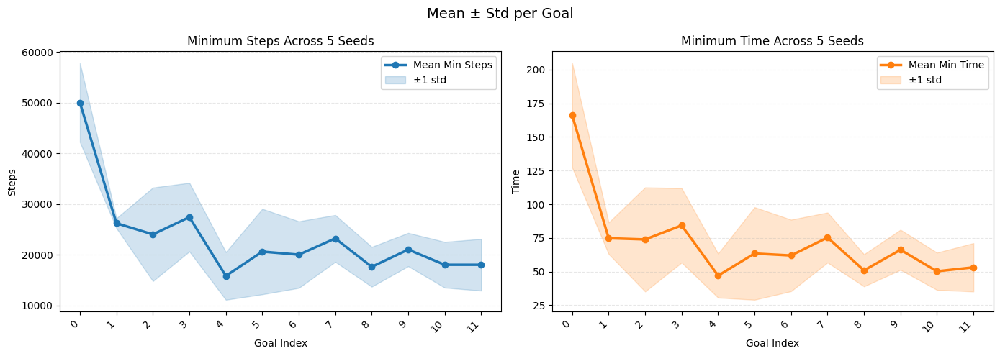

In [4]:
plot_min_steps_and_min_time(overall_results=overall_results, seeds=SEEDS)

## Backward Compatibility test (or new goal test)

Do not retrain anything, just give the task embedding, and check whether the sa encoder can give good Q functions still. The task embedding must be previously learned.

In [5]:
def evaluate_zero_shot_goal(
    q_network,
    goal,
    make_env,
    device,
    episodes=8,
):
    q_network.eval()

    eval_env = make_env(goal=goal)

    goal_arr = np.asarray(
        goal,
        dtype=np.float32,
    )

    goal_t = torch.tensor(
        goal_arr,
        dtype=torch.float32,
        device=device,
    ).unsqueeze(0)

    def eval_policy(obs):
        obs_t = torch.tensor(
            obs,
            dtype=torch.float32,
            device=device,
        ).unsqueeze(0)

        with torch.inference_mode():
            q_values = q_network.q_val_for_argmax_action(
                obs_t,
                goal_t,
            )

        return int(
            q_values.argmax(
                dim=-1,
            ).item()
        )

    mean_return, mean_length = evaluate_policy(
        eval_env,
        eval_policy,
        episodes=episodes,
    )

    eval_env.close()

    return mean_return, mean_length


# Check that seed-specific goals were saved
if "goals_by_seed" not in globals():
    raise RuntimeError(
        "goals_by_seed does not exist. "
        "Add goals_by_seed = {} before the training loop and "
        "goals_by_seed[seed] = list(GOALS) after sampling goals."
    )


# Store zero-shot results using task_idx rather than goal coordinates
zero_shot_returns = {
    seed: {
        task_idx: None
        for task_idx in range(NUM_GOALS)
    }
    for seed in SEEDS
}

zero_shot_lengths = {
    seed: {
        task_idx: None
        for task_idx in range(NUM_GOALS)
    }
    for seed in SEEDS
}


# Evaluate each final network on the goals sampled for its own seed
for seed in SEEDS:
    print(
        f"\n========== ZERO-SHOT EVALUATION "
        f"SEED {seed} ==========\n"
    )

    q_final = final_q_networks[seed]

    # These are the goals generated for this particular seed
    seed_goals = goals_by_seed[seed]

    if len(seed_goals) != NUM_GOALS:
        raise ValueError(
            f"Seed {seed} has {len(seed_goals)} goals, "
            f"but NUM_GOALS={NUM_GOALS}."
        )

    for task_idx, test_goal in enumerate(seed_goals):
        mean_return, mean_length = evaluate_zero_shot_goal(
            q_network=q_final,
            goal=test_goal,
            make_env=make_env,
            device=DEVICE,
            episodes=8,
        )

        zero_shot_returns[seed][task_idx] = mean_return
        zero_shot_lengths[seed][task_idx] = mean_length

        print(
            f"task_idx={task_idx} | "
            f"goal={test_goal} | "
            f"return={mean_return:.3f} | "
            f"length={mean_length:.1f}"
        )


# Aggregate zero-shot results across seeds by task index
zero_shot_return_mean = {}
zero_shot_return_std = {}
zero_shot_length_mean = {}
zero_shot_length_std = {}

for task_idx in range(NUM_GOALS):
    return_values = [
        zero_shot_returns[seed][task_idx]
        for seed in SEEDS
    ]

    length_values = [
        zero_shot_lengths[seed][task_idx]
        for seed in SEEDS
    ]

    zero_shot_return_mean[task_idx] = float(
        np.mean(return_values)
    )

    zero_shot_return_std[task_idx] = float(
        np.std(return_values)
    )

    zero_shot_length_mean[task_idx] = float(
        np.mean(length_values)
    )

    zero_shot_length_std[task_idx] = float(
        np.std(length_values)
    )


# Print final task-index-based results
print(
    "\n========== FINAL ZERO-SHOT RESULTS "
    "BY TASK INDEX ==========\n"
)

for task_idx in range(NUM_GOALS):
    print(
        f"task_idx={task_idx} | "
        f"return="
        f"{zero_shot_return_mean[task_idx]:.3f} "
        f"+/- "
        f"{zero_shot_return_std[task_idx]:.3f} | "
        f"length="
        f"{zero_shot_length_mean[task_idx]:.1f} "
        f"+/- "
        f"{zero_shot_length_std[task_idx]:.1f}"
    )


# Optional diagnostic: show which physical goal each task_idx represented
print(
    "\n========== TASK INDEX TO GOAL MAPPING ==========\n"
)

for task_idx in range(NUM_GOALS):
    task_goal_mapping = {
        seed: goals_by_seed[seed][task_idx]
        for seed in SEEDS
    }

    print(
        f"task_idx={task_idx} | "
        f"goals_by_seed={task_goal_mapping}"
    )


========== ZERO-SHOT EVALUATION SEED 42 ==========

task_idx=0 | goal=(1, 4) | return=0.125 | length=437.6
task_idx=1 | goal=(6, 1) | return=0.125 | length=438.5
task_idx=2 | goal=(9, 6) | return=0.000 | length=500.0
task_idx=3 | goal=(5, 5) | return=0.000 | length=500.0
task_idx=4 | goal=(7, 5) | return=0.000 | length=500.0
task_idx=5 | goal=(8, 7) | return=0.000 | length=500.0
task_idx=6 | goal=(4, 1) | return=0.250 | length=375.2
task_idx=7 | goal=(1, 9) | return=0.125 | length=437.6
task_idx=8 | goal=(7, 9) | return=0.000 | length=500.0
task_idx=9 | goal=(1, 7) | return=0.250 | length=375.4
task_idx=10 | goal=(8, 9) | return=0.000 | length=500.0
task_idx=11 | goal=(4, 2) | return=1.000 | length=8.0

========== ZERO-SHOT EVALUATION SEED 123 ==========

task_idx=0 | goal=(6, 3) | return=1.000 | length=7.1
task_idx=1 | goal=(3, 1) | return=0.125 | length=437.9
task_idx=2 | goal=(7, 5) | return=0.250 | length=376.8
task_idx=3 | goal=(1, 1) | return=0.000 | length=500.0
task_idx=4 | go

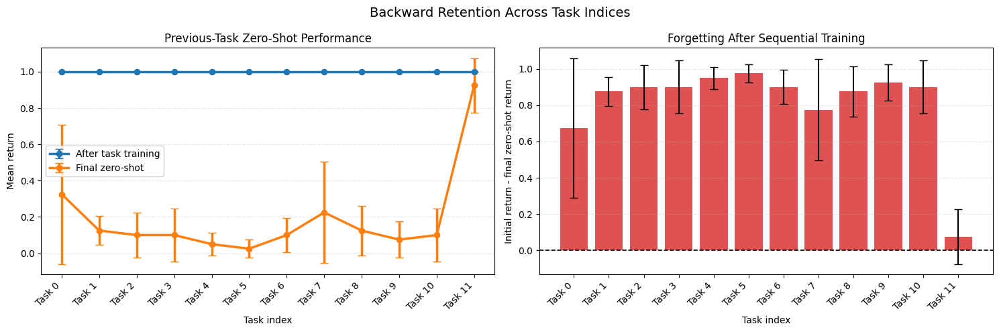

In [6]:
# Logical task labels for plotting
task_labels = [
    f"Task {task_idx}"
    for task_idx in range(NUM_GOALS)
]

task_indices = np.arange(NUM_GOALS)


def get_last_eval_return(eval_history):
    """
    Extract the final return from an evaluation history.

    Handles histories containing:
    - scalar returns
    - (time, return) pairs
    - lists or numpy arrays
    """
    if len(eval_history) == 0:
        return np.nan

    last_value = eval_history[-1]

    if isinstance(
        last_value,
        (tuple, list, np.ndarray),
    ):
        return float(last_value[1])

    return float(last_value)


# ------------------------------------------------------------
# Initial performance after training each task
# ------------------------------------------------------------
initial_returns_by_seed = {
    seed: {}
    for seed in SEEDS
}


for seed_idx, seed in enumerate(SEEDS):
    for task_idx in range(NUM_GOALS):
        eval_history = (
            overall_results[task_idx][
                "eval_returns"
            ][seed_idx]
        )

        initial_returns_by_seed[seed][task_idx] = (
            get_last_eval_return(eval_history)
        )


# ------------------------------------------------------------
# Aggregate initial performance, final zero-shot
# performance, and forgetting by task index
# ------------------------------------------------------------
initial_return_mean = []
initial_return_std = []

final_return_mean = []
final_return_std = []

forgetting_mean = []
forgetting_std = []


for task_idx in range(NUM_GOALS):
    initial_values = [
        initial_returns_by_seed[seed][task_idx]
        for seed in SEEDS
    ]

    final_values = [
        zero_shot_returns[seed][task_idx]
        for seed in SEEDS
    ]

    forgetting_values = [
        initial_returns_by_seed[seed][task_idx]
        - zero_shot_returns[seed][task_idx]
        for seed in SEEDS
    ]

    initial_return_mean.append(
        np.nanmean(initial_values)
    )

    initial_return_std.append(
        np.nanstd(initial_values)
    )

    final_return_mean.append(
        np.nanmean(final_values)
    )

    final_return_std.append(
        np.nanstd(final_values)
    )

    forgetting_mean.append(
        np.nanmean(forgetting_values)
    )

    forgetting_std.append(
        np.nanstd(forgetting_values)
    )


initial_return_mean = np.asarray(
    initial_return_mean
)

initial_return_std = np.asarray(
    initial_return_std
)

final_return_mean = np.asarray(
    final_return_mean
)

final_return_std = np.asarray(
    final_return_std
)

forgetting_mean = np.asarray(
    forgetting_mean
)

forgetting_std = np.asarray(
    forgetting_std
)


# ------------------------------------------------------------
# Plot results
# ------------------------------------------------------------
fig, axes = plt.subplots(
    1,
    2,
    figsize=(15, 5),
)


# ------------------------------------------------------------
# Initial versus final zero-shot performance
# ------------------------------------------------------------
axes[0].errorbar(
    task_indices,
    initial_return_mean,
    yerr=initial_return_std,
    marker="o",
    linewidth=2.5,
    capsize=4,
    color="tab:blue",
    label="After task training",
)

axes[0].errorbar(
    task_indices,
    final_return_mean,
    yerr=final_return_std,
    marker="o",
    linewidth=2.5,
    capsize=4,
    color="tab:orange",
    label="Final zero-shot",
)

axes[0].set_title(
    "Previous-Task Zero-Shot Performance"
)

axes[0].set_xlabel(
    "Task index"
)

axes[0].set_ylabel(
    "Mean return"
)

axes[0].set_xticks(
    task_indices
)

axes[0].set_xticklabels(
    task_labels,
    rotation=45,
    ha="right",
)

axes[0].grid(
    True,
    axis="y",
    linestyle="--",
    alpha=0.3,
)

axes[0].legend()


# ------------------------------------------------------------
# Forgetting / backward transfer
# ------------------------------------------------------------
colors = [
    "tab:red" if value > 0 else "tab:green"
    for value in forgetting_mean
]

axes[1].bar(
    task_indices,
    forgetting_mean,
    yerr=forgetting_std,
    capsize=4,
    color=colors,
    alpha=0.8,
)

axes[1].axhline(
    0.0,
    color="black",
    linestyle="--",
    linewidth=1.2,
)

axes[1].set_title(
    "Forgetting After Sequential Training"
)

axes[1].set_xlabel(
    "Task index"
)

axes[1].set_ylabel(
    "Initial return - final zero-shot return"
)

axes[1].set_xticks(
    task_indices
)

axes[1].set_xticklabels(
    task_labels,
    rotation=45,
    ha="right",
)

axes[1].grid(
    True,
    axis="y",
    linestyle="--",
    alpha=0.3,
)


fig.suptitle(
    "Backward Retention Across Task Indices",
    fontsize=14,
)

fig.tight_layout()

plt.show()


========== CONTINUAL LEARNING METRICS BY TASK INDEX ==========

Task 0 | initial=1.000 +/- 0.000 | final zero-shot=0.325 +/- 0.384 | forgetting=0.675 +/- 0.384 | BWT=-0.675 +/- 0.384 | retention=0.325 +/- 0.384
Task 1 | initial=1.000 +/- 0.000 | final zero-shot=0.125 +/- 0.079 | forgetting=0.875 +/- 0.079 | BWT=-0.875 +/- 0.079 | retention=0.125 +/- 0.079
Task 2 | initial=1.000 +/- 0.000 | final zero-shot=0.100 +/- 0.122 | forgetting=0.900 +/- 0.122 | BWT=-0.900 +/- 0.122 | retention=0.100 +/- 0.122
Task 3 | initial=1.000 +/- 0.000 | final zero-shot=0.100 +/- 0.146 | forgetting=0.900 +/- 0.146 | BWT=-0.900 +/- 0.146 | retention=0.100 +/- 0.146
Task 4 | initial=1.000 +/- 0.000 | final zero-shot=0.050 +/- 0.061 | forgetting=0.950 +/- 0.061 | BWT=-0.950 +/- 0.061 | retention=0.050 +/- 0.061
Task 5 | initial=1.000 +/- 0.000 | final zero-shot=0.025 +/- 0.050 | forgetting=0.975 +/- 0.050 | BWT=-0.975 +/- 0.050 | retention=0.025 +/- 0.050
Task 6 | initial=1.000 +/- 0.000 | final zero-shot=0.

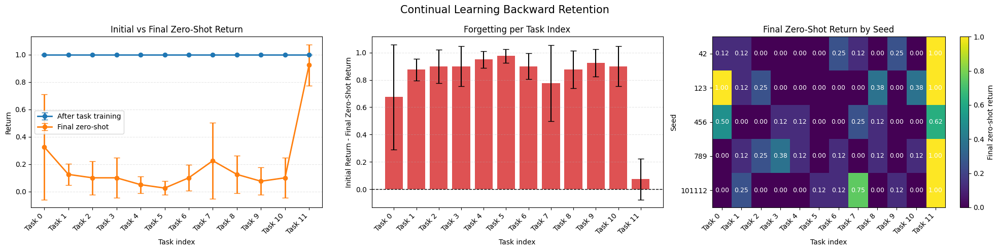

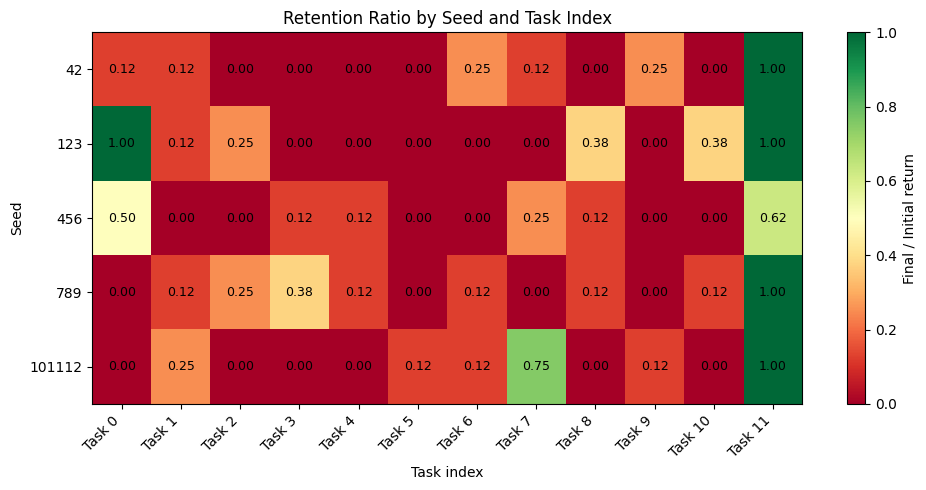

In [7]:
def extract_initial_return(eval_history):
    if len(eval_history) == 0:
        return np.nan

    last_entry = eval_history[-1]

    if isinstance(
        last_entry,
        (tuple, list, np.ndarray),
    ):
        return float(last_entry[1])

    return float(last_entry)


num_seeds = len(SEEDS)
num_tasks = NUM_GOALS


# ------------------------------------------------------------
# Allocate matrices
# Rows    = seeds
# Columns = task indices
# ------------------------------------------------------------
initial_matrix = np.full(
    (num_seeds, num_tasks),
    np.nan,
    dtype=np.float32,
)

final_zero_shot_matrix = np.full(
    (num_seeds, num_tasks),
    np.nan,
    dtype=np.float32,
)


# ------------------------------------------------------------
# Fill initial and final zero-shot matrices
# ------------------------------------------------------------
for seed_idx, seed in enumerate(SEEDS):
    for task_idx in range(num_tasks):

        # Initial return after training this task.
        # Results were appended in SEEDS order during training.
        eval_history = (
            overall_results[task_idx][
                "eval_returns"
            ][seed_idx]
        )

        initial_matrix[
            seed_idx,
            task_idx,
        ] = extract_initial_return(
            eval_history
        )

        # Final zero-shot return for this seed/task pair
        final_zero_shot_matrix[
            seed_idx,
            task_idx,
        ] = zero_shot_returns[
            seed
        ][
            task_idx
        ]


# ------------------------------------------------------------
# Continual-learning metrics
# ------------------------------------------------------------
forgetting_matrix = (
    initial_matrix
    - final_zero_shot_matrix
)

backward_transfer_matrix = (
    final_zero_shot_matrix
    - initial_matrix
)


# Use a safe division operation for retention.
# This avoids division by zero when the initial return is zero.
retention_matrix = np.divide(
    final_zero_shot_matrix,
    initial_matrix,
    out=np.full_like(
        final_zero_shot_matrix,
        np.nan,
    ),
    where=np.abs(initial_matrix) > 1e-8,
)


# ------------------------------------------------------------
# Aggregate metrics across seeds
# ------------------------------------------------------------
initial_mean = np.nanmean(
    initial_matrix,
    axis=0,
)

initial_std = np.nanstd(
    initial_matrix,
    axis=0,
)

final_mean = np.nanmean(
    final_zero_shot_matrix,
    axis=0,
)

final_std = np.nanstd(
    final_zero_shot_matrix,
    axis=0,
)

forgetting_mean = np.nanmean(
    forgetting_matrix,
    axis=0,
)

forgetting_std = np.nanstd(
    forgetting_matrix,
    axis=0,
)

bwt_mean = np.nanmean(
    backward_transfer_matrix,
    axis=0,
)

bwt_std = np.nanstd(
    backward_transfer_matrix,
    axis=0,
)

retention_mean = np.nanmean(
    retention_matrix,
    axis=0,
)

retention_std = np.nanstd(
    retention_matrix,
    axis=0,
)


# ------------------------------------------------------------
# Print per-task metrics
# ------------------------------------------------------------
print(
    "\n========== CONTINUAL LEARNING METRICS "
    "BY TASK INDEX ==========\n"
)

for task_idx in range(num_tasks):
    print(
        f"Task {task_idx} | "
        f"initial="
        f"{initial_mean[task_idx]:.3f} "
        f"+/- "
        f"{initial_std[task_idx]:.3f} | "
        f"final zero-shot="
        f"{final_mean[task_idx]:.3f} "
        f"+/- "
        f"{final_std[task_idx]:.3f} | "
        f"forgetting="
        f"{forgetting_mean[task_idx]:.3f} "
        f"+/- "
        f"{forgetting_std[task_idx]:.3f} | "
        f"BWT="
        f"{bwt_mean[task_idx]:.3f} "
        f"+/- "
        f"{bwt_std[task_idx]:.3f} | "
        f"retention="
        f"{retention_mean[task_idx]:.3f} "
        f"+/- "
        f"{retention_std[task_idx]:.3f}"
    )


# ------------------------------------------------------------
# Print overall metrics
# ------------------------------------------------------------
print(
    "\n========== OVERALL METRICS ==========\n"
)

print(
    f"Mean initial return: "
    f"{np.nanmean(initial_matrix):.3f}"
)

print(
    f"Mean final zero-shot return: "
    f"{np.nanmean(final_zero_shot_matrix):.3f}"
)

print(
    f"Mean forgetting: "
    f"{np.nanmean(forgetting_matrix):.3f}"
)

print(
    f"Mean backward transfer: "
    f"{np.nanmean(backward_transfer_matrix):.3f}"
)

print(
    f"Mean retention: "
    f"{np.nanmean(retention_matrix):.3f}"
)


# ------------------------------------------------------------
# Plot labels
# ------------------------------------------------------------
task_labels = [
    f"Task {task_idx}"
    for task_idx in range(num_tasks)
]

seed_labels = [
    str(seed)
    for seed in SEEDS
]

x = np.arange(num_tasks)


# ------------------------------------------------------------
# Main plots
# ------------------------------------------------------------
fig, axes = plt.subplots(
    1,
    3,
    figsize=(20, 5),
)


# ------------------------------------------------------------
# Initial versus final zero-shot return
# ------------------------------------------------------------
axes[0].errorbar(
    x,
    initial_mean,
    yerr=initial_std,
    marker="o",
    linewidth=2,
    capsize=4,
    label="After task training",
)

axes[0].errorbar(
    x,
    final_mean,
    yerr=final_std,
    marker="o",
    linewidth=2,
    capsize=4,
    label="Final zero-shot",
)

axes[0].set_title(
    "Initial vs Final Zero-Shot Return"
)

axes[0].set_xlabel(
    "Task index"
)

axes[0].set_ylabel(
    "Return"
)

axes[0].set_xticks(x)

axes[0].set_xticklabels(
    task_labels,
    rotation=45,
    ha="right",
)

axes[0].grid(
    True,
    axis="y",
    linestyle="--",
    alpha=0.3,
)

axes[0].legend()


# ------------------------------------------------------------
# Forgetting
# ------------------------------------------------------------
forgetting_colors = [
    "tab:red" if value > 0 else "tab:green"
    for value in forgetting_mean
]

axes[1].bar(
    x,
    forgetting_mean,
    yerr=forgetting_std,
    color=forgetting_colors,
    alpha=0.8,
    capsize=4,
)

axes[1].axhline(
    0.0,
    color="black",
    linestyle="--",
    linewidth=1,
)

axes[1].set_title(
    "Forgetting per Task Index"
)

axes[1].set_xlabel(
    "Task index"
)

axes[1].set_ylabel(
    "Initial Return - Final Zero-Shot Return"
)

axes[1].set_xticks(x)

axes[1].set_xticklabels(
    task_labels,
    rotation=45,
    ha="right",
)

axes[1].grid(
    True,
    axis="y",
    linestyle="--",
    alpha=0.3,
)


# ------------------------------------------------------------
# Final zero-shot heatmap across seeds
# ------------------------------------------------------------
im = axes[2].imshow(
    final_zero_shot_matrix,
    aspect="auto",
    cmap="viridis",
    vmin=0.0,
    vmax=1.0,
)

axes[2].set_title(
    "Final Zero-Shot Return by Seed"
)

axes[2].set_xlabel(
    "Task index"
)

axes[2].set_ylabel(
    "Seed"
)

axes[2].set_xticks(
    np.arange(num_tasks)
)

axes[2].set_xticklabels(
    task_labels,
    rotation=45,
    ha="right",
)

axes[2].set_yticks(
    np.arange(num_seeds)
)

axes[2].set_yticklabels(
    seed_labels
)


for seed_idx in range(num_seeds):
    for task_idx in range(num_tasks):
        value = final_zero_shot_matrix[
            seed_idx,
            task_idx,
        ]

        if np.isnan(value):
            text_value = "nan"
        else:
            text_value = f"{value:.2f}"

        axes[2].text(
            task_idx,
            seed_idx,
            text_value,
            ha="center",
            va="center",
            color="white",
            fontsize=9,
        )


fig.colorbar(
    im,
    ax=axes[2],
    label="Final zero-shot return",
)


fig.suptitle(
    "Continual Learning Backward Retention",
    fontsize=15,
)

fig.tight_layout()

plt.show()


# ------------------------------------------------------------
# Separate retention heatmap
# ------------------------------------------------------------
fig, ax = plt.subplots(
    figsize=(10, 5),
)


# Clip only for visualisation
retention_plot = np.clip(
    retention_matrix,
    0.0,
    1.0,
)


im = ax.imshow(
    retention_plot,
    aspect="auto",
    cmap="RdYlGn",
    vmin=0.0,
    vmax=1.0,
)

ax.set_title(
    "Retention Ratio by Seed and Task Index"
)

ax.set_xlabel(
    "Task index"
)

ax.set_ylabel(
    "Seed"
)

ax.set_xticks(
    np.arange(num_tasks)
)

ax.set_xticklabels(
    task_labels,
    rotation=45,
    ha="right",
)

ax.set_yticks(
    np.arange(num_seeds)
)

ax.set_yticklabels(
    seed_labels
)


for seed_idx in range(num_seeds):
    for task_idx in range(num_tasks):
        value = retention_matrix[
            seed_idx,
            task_idx,
        ]

        if np.isnan(value):
            text_value = "nan"
        else:
            text_value = f"{value:.2f}"

        ax.text(
            task_idx,
            seed_idx,
            text_value,
            ha="center",
            va="center",
            color="black",
            fontsize=9,
        )


fig.colorbar(
    im,
    ax=ax,
    label="Final / Initial return",
)

fig.tight_layout()

plt.show()

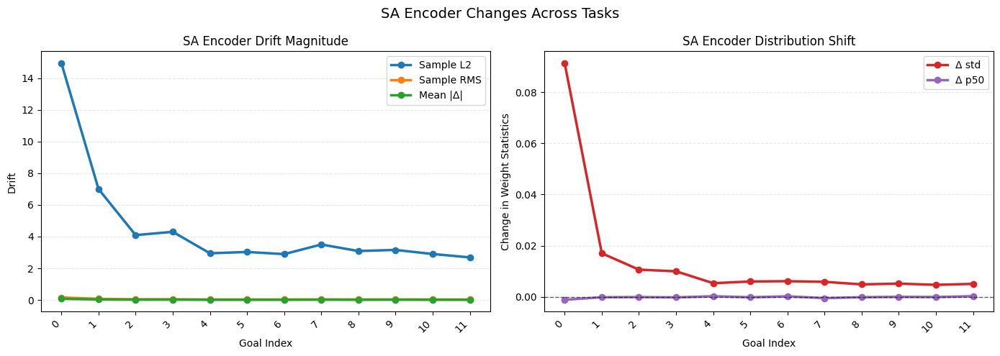

In [8]:
plot_sa_encoder_changes_across_tasks(overall_results)

In [9]:
# ============================================================
# Retraining / adaptation from saved sequential model
# ============================================================

ADAPT_TOTAL_STEPS = 30_000
ADAPT_WARMUP_STEPS = 1_000
ADAPT_BATCH_SIZE = 256
ADAPT_LR = 1e-3

ADAPT_GAMMA = 0.99
ADAPT_TAU = 0.005

ADAPT_EPS_START = 0.3
ADAPT_EPS_END = 0.05
ADAPT_EPS_DECAY_STEPS = 10_000
ADAPT_TRAIN_FREQ = 4


num_tasks = NUM_GOALS


# Results are stored by seed and task index
adaptation_results = {
    seed: {
        "scratch": {},
        "sa_transfer": {},
    }
    for seed in SEEDS
}


for seed in SEEDS:
    print(
        f"\n================ ADAPTATION "
        f"SEED {seed} ================\n"
    )

    # Goals sampled specifically for this seed
    seed_goals = goals_by_seed[seed]

    # Final sequentially trained network for this seed
    final_q = final_q_networks[seed]


    for task_idx, goal in enumerate(seed_goals):
        task_label = f"Task {task_idx}"

        print(
            f"\n----- seed={seed}, "
            f"task_idx={task_idx}, "
            f"goal={goal} -----\n"
        )


        adapt_seed = (
            seed
            + 10000
            + task_idx
        )


        env_tmp = make_env(
            goal=goal
        )

        obs_dim = int(
            env_tmp.observation_space.shape[0]
        )

        num_actions = int(
            env_tmp.action_space.n
        )

        env_tmp.close()


        # ====================================================
        # Scratch model
        # ====================================================
        set_seed(adapt_seed)


        scratch_q = FactorisedDQN_QNetwork(
            obs_dim=obs_dim,
            num_actions=num_actions,
            goal_dim=2,
            hidden_dim=128,
            rep_dim=64,
        ).to(DEVICE)


        scratch_target = FactorisedDQN_QNetwork(
            obs_dim=obs_dim,
            num_actions=num_actions,
            goal_dim=2,
            hidden_dim=128,
            rep_dim=64,
        ).to(DEVICE)


        scratch_target.load_state_dict(
            scratch_q.state_dict()
        )


        for p in scratch_q.parameters():
            p.requires_grad_(True)


        for p in scratch_target.parameters():
            p.requires_grad_(False)


        scratch_env = make_env(
            goal=goal
        )


        (
            scratch_q,
            scratch_target,
            scratch_returns,
            scratch_steps,
            scratch_time,
            scratch_task_embedding,
            scratch_sa_mean,
            scratch_sa_fixed,
            scratch_sa_batch,
            scratch_buffer,
        ) = dqn_train_new(
            seed=adapt_seed,
            q_network=scratch_q,
            q_target_network=scratch_target,
            env=scratch_env,
            make_env=make_env,

            buffer_capacity=BUFFER_CAPACITY,
            lr=ADAPT_LR,
            obs_dim=obs_dim,
            device=DEVICE,

            total_steps=ADAPT_TOTAL_STEPS,
            warmup_steps=ADAPT_WARMUP_STEPS,
            batch_size=ADAPT_BATCH_SIZE,

            gamma=ADAPT_GAMMA,
            tau=ADAPT_TAU,

            eps_start=ADAPT_EPS_START,
            eps_end=ADAPT_EPS_END,
            eps_decay_steps=ADAPT_EPS_DECAY_STEPS,
            train_freq=ADAPT_TRAIN_FREQ,

            goal=goal,
            td_steps=1,

            embedding_memory={
                "sa_anchors": [],
            },

            early_stop_reward=0.99,
            early_stop_patience=3,
            enable_early_stop=True,

            use_sa_stability=False,
            project_sa_gradients=False,
            lambda_sa_stability=0.0,
        )


        if hasattr(scratch_env, "close"):
            scratch_env.close()


        # ====================================================
        # SA-transfer model
        # ====================================================
        set_seed(adapt_seed)


        transfer_q = FactorisedDQN_QNetwork(
            obs_dim=obs_dim,
            num_actions=num_actions,
            goal_dim=2,
            hidden_dim=128,
            rep_dim=64,
        ).to(DEVICE)


        transfer_target = FactorisedDQN_QNetwork(
            obs_dim=obs_dim,
            num_actions=num_actions,
            goal_dim=2,
            hidden_dim=128,
            rep_dim=64,
        ).to(DEVICE)


        # Transfer the complete final sequential model
        transfer_q.load_state_dict(
            final_q.state_dict()
        )


        # Freeze phi(s,a)
        for p in transfer_q.sa_encoder.parameters():
            p.requires_grad_(False)


        # Keep psi(g) trainable
        for p in transfer_q.goal_encoder.parameters():
            p.requires_grad_(True)


        # Target starts from the transferred model
        transfer_target.load_state_dict(
            transfer_q.state_dict()
        )


        for p in transfer_target.parameters():
            p.requires_grad_(False)


        transfer_params = [
            p
            for p in transfer_q.goal_encoder.parameters()
            if p.requires_grad
        ]


        transfer_env = make_env(
            goal=goal
        )


        (
            transfer_q,
            transfer_target,
            transfer_returns,
            transfer_steps,
            transfer_time,
            transfer_task_embedding,
            transfer_sa_mean,
            transfer_sa_fixed,
            transfer_sa_batch,
            transfer_buffer,
        ) = dqn_train_new(
            seed=adapt_seed,
            q_network=transfer_q,
            q_target_network=transfer_target,
            env=transfer_env,
            make_env=make_env,

            buffer_capacity=BUFFER_CAPACITY,
            lr=ADAPT_LR,
            obs_dim=obs_dim,
            device=DEVICE,

            total_steps=ADAPT_TOTAL_STEPS,
            warmup_steps=ADAPT_WARMUP_STEPS,
            batch_size=ADAPT_BATCH_SIZE,

            gamma=ADAPT_GAMMA,
            tau=ADAPT_TAU,

            eps_start=ADAPT_EPS_START,
            eps_end=ADAPT_EPS_END,
            eps_decay_steps=ADAPT_EPS_DECAY_STEPS,
            train_freq=ADAPT_TRAIN_FREQ,

            goal=goal,
            td_steps=1,

            params=transfer_params,

            embedding_memory={
                "sa_anchors": [],
            },

            early_stop_reward=0.99,
            early_stop_patience=3,
            enable_early_stop=True,

            use_sa_stability=False,
            project_sa_gradients=False,
            lambda_sa_stability=0.0,
        )


        if hasattr(transfer_env, "close"):
            transfer_env.close()


        # ====================================================
        # Save results by task index
        # ====================================================
        adaptation_results[seed]["scratch"][task_idx] = {
            "goal": goal,
            "eval_returns": scratch_returns,
            "min_steps": scratch_steps,
            "min_time": scratch_time,
            "task_embedding": scratch_task_embedding,
            "sa_embedding": scratch_sa_mean,
            "sa_fixed_probe_embedding": scratch_sa_fixed,
            "sa_batch_final": scratch_sa_batch,
        }


        adaptation_results[seed]["sa_transfer"][task_idx] = {
            "goal": goal,
            "eval_returns": transfer_returns,
            "min_steps": transfer_steps,
            "min_time": transfer_time,
            "task_embedding": transfer_task_embedding,
            "sa_embedding": transfer_sa_mean,
            "sa_fixed_probe_embedding": transfer_sa_fixed,
            "sa_batch_final": transfer_sa_batch,
        }


        print(
            f"{task_label} | "
            f"goal={goal} | "
            f"scratch steps={scratch_steps} | "
            f"SA transfer steps={transfer_steps} | "
            f"scratch time={scratch_time:.2f}s | "
            f"SA transfer time={transfer_time:.2f}s"
        )


# ============================================================
# Aggregate adaptation results
# ============================================================

num_seeds = len(SEEDS)
num_tasks = NUM_GOALS


scratch_steps = np.full(
    (num_seeds, num_tasks),
    np.nan,
    dtype=np.float32,
)

transfer_steps = np.full(
    (num_seeds, num_tasks),
    np.nan,
    dtype=np.float32,
)

scratch_times = np.full(
    (num_seeds, num_tasks),
    np.nan,
    dtype=np.float32,
)

transfer_times = np.full(
    (num_seeds, num_tasks),
    np.nan,
    dtype=np.float32,
)


for seed_idx, seed in enumerate(SEEDS):
    for task_idx in range(num_tasks):

        scratch_result = (
            adaptation_results[seed]
            ["scratch"]
            [task_idx]
        )

        transfer_result = (
            adaptation_results[seed]
            ["sa_transfer"]
            [task_idx]
        )


        scratch_steps[
            seed_idx,
            task_idx,
        ] = float(
            scratch_result["min_steps"]
        )

        transfer_steps[
            seed_idx,
            task_idx,
        ] = float(
            transfer_result["min_steps"]
        )

        scratch_times[
            seed_idx,
            task_idx,
        ] = float(
            scratch_result["min_time"]
        )

        transfer_times[
            seed_idx,
            task_idx,
        ] = float(
            transfer_result["min_time"]
        )


# ============================================================
# Aggregate statistics across seeds
# ============================================================

scratch_steps_mean = np.nanmean(
    scratch_steps,
    axis=0,
)

scratch_steps_std = np.nanstd(
    scratch_steps,
    axis=0,
)

transfer_steps_mean = np.nanmean(
    transfer_steps,
    axis=0,
)

transfer_steps_std = np.nanstd(
    transfer_steps,
    axis=0,
)

scratch_times_mean = np.nanmean(
    scratch_times,
    axis=0,
)

scratch_times_std = np.nanstd(
    scratch_times,
    axis=0,
)

transfer_times_mean = np.nanmean(
    transfer_times,
    axis=0,
)

transfer_times_std = np.nanstd(
    transfer_times,
    axis=0,
)


# ============================================================
# Print results by task index
# ============================================================

print(
    "\n========== ADAPTATION RESULTS "
    "BY TASK INDEX ==========\n"
)


for task_idx in range(num_tasks):
    print(
        f"Task {task_idx} | "
        f"scratch steps="
        f"{scratch_steps_mean[task_idx]:.1f} "
        f"+/- "
        f"{scratch_steps_std[task_idx]:.1f} | "
        f"SA-transfer steps="
        f"{transfer_steps_mean[task_idx]:.1f} "
        f"+/- "
        f"{transfer_steps_std[task_idx]:.1f} | "
        f"scratch time="
        f"{scratch_times_mean[task_idx]:.2f}s "
        f"+/- "
        f"{scratch_times_std[task_idx]:.2f}s | "
        f"SA-transfer time="
        f"{transfer_times_mean[task_idx]:.2f}s "
        f"+/- "
        f"{transfer_times_std[task_idx]:.2f}s"
    )


# ============================================================
# Overall metrics
# ============================================================

print(
    "\n========== OVERALL ADAPTATION METRICS ==========\n"
)

print(
    f"Mean scratch steps: "
    f"{np.nanmean(scratch_steps):.1f}"
)

print(
    f"Mean SA-transfer steps: "
    f"{np.nanmean(transfer_steps):.1f}"
)

print(
    f"Mean scratch time: "
    f"{np.nanmean(scratch_times):.2f}s"
)

print(
    f"Mean SA-transfer time: "
    f"{np.nanmean(transfer_times):.2f}s"
)


# Positive values mean that SA transfer used fewer steps
step_reduction = (
    scratch_steps
    - transfer_steps
)

step_reduction_mean = np.nanmean(
    step_reduction,
    axis=0,
)

step_reduction_std = np.nanstd(
    step_reduction,
    axis=0,
)


print(
    "\n========== SA-TRANSFER STEP REDUCTION "
    "BY TASK ==========\n"
)

for task_idx in range(num_tasks):
    print(
        f"Task {task_idx} | "
        f"step reduction="
        f"{step_reduction_mean[task_idx]:.1f} "
        f"+/- "
        f"{step_reduction_std[task_idx]:.1f}"
    )


================ ADAPTATION SEED 42 ================


----- seed=42, task_idx=0, goal=(1, 4) -----

[DQN-factorised] step=   1000 | eps=0.275 | eval_return=-37.325 | eval_len=437.6 | TD=7.4561e-03 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   2000 | eps=0.250 | eval_return=-18.613 | eval_len=437.6 | TD=1.4488e-03 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   3000 | eps=0.225 | eval_return=-24.725 | eval_len=375.2 | TD=9.1415e-04 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   4000 | eps=0.200 | eval_return=-24.538 | eval_len=313.2 | TD=1.0732e-03 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   5000 | eps=0.175 | eval_return=-12.350 | eval_len=437.8 | TD=2.4790e-03 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   6000 | eps=0.150 | eval_return=-12.488 | eval_len=500.0 | TD=1.4379e-03 | SA-stability=0.0000e+00 | projection=n/a
[DQN-factorised] step=   7000 | eps=0.125 | eval_return=-6

## HTML visualisation

In [10]:
for goal, data in overall_results.items():
    print(goal)
    print("task_embeddings:", len(data.get("task_embeddings", [])))
    print("sa_fixed_probe_embeddings:", len(data.get("sa_fixed_probe_embeddings", [])))
    print("sa_batches_final:", len(data.get("sa_batches_final", [])))

dashboard = plot_full_embedding_dashboard_html(
    overall_results=overall_results,
    qnet=q_network,
    mode="all",
    save_html="plots/full_embedding_dashboard_maze.html",
    weights_his=weight_history,
)

print(dashboard["save_html"])
print(dashboard["isotropy_metrics"])

0
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
1
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
2
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
3
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
4
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
5
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
6
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
7
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
8
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
9
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
10
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5
11
task_embeddings: 5
sa_fixed_probe_embeddings: 5
sa_batches_final: 5


NameError: name 'q_network' is not defined